In [266]:
from netCDF4 import Dataset
import pandas as pd
import numpy as np
import matplotlib as mpl
import copy

import os, sys
import pickle as pkl
from scipy import interpolate
import scipy as sp

from hypnotoad import tokamak
from hypnotoad.core.mesh import BoutMesh
from fusiondls import run_dls, file_read, file_write
from fusiondls.unpackConfigurationsMK import unpackConfigurationMK
from fusiondls.AnalyticCoolingCurves import LfuncKallenbach
from fusiondls.Profile import Profile


onedrive_path = onedrive_path = str(os.getcwd()).split("OneDrive")[0] + "OneDrive"
sys.path.append(os.path.join(onedrive_path, r"Project\python-packages\sdtools"))

from DLS.postprocess import *

from code_comparison.solps_pp import *

from sdtools.general.plotstyle import change_colors
change_colors("default")

%matplotlib inline

%load_ext autoreload
%autoreload 2


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Read SOLPS case

In [267]:
balance_paths = {
    "50MW" : r"C:\Users\mikek\OneDrive\Project\DLS\from ryoko\2024-11-01 - V10 Inner power scans for PSI\50MW\P50nu1p75e22Ar1e22Dpuff3e23r",
    "55MW" : r"C:\Users\mikek\OneDrive\Project\DLS\from ryoko\2024-11-01 - V10 Inner power scans for PSI\55MW\P55nu1p75e22Ar1e22Dpuff3e23r",
    "60MW" : r"C:\Users\mikek\OneDrive\Project\DLS\from ryoko\2024-11-01 - V10 Inner power scans for PSI\60MW\P60nu1p75e22Ar1e22Dpuff3e23r",
    "70MW" : r"C:\Users\mikek\OneDrive\Project\DLS\from ryoko\2024-11-01 - V10 Inner power scans for PSI\70MW\P70nu1p75e22Ar1e22Dpuff3e23r",
    "80MW" : r"C:\Users\mikek\OneDrive\Project\DLS\from ryoko\2024-11-01 - V10 Inner power scans for PSI\80MW",
    "90MW" : r"C:\Users\mikek\OneDrive\Project\DLS\from ryoko\2024-11-01 - V10 Inner power scans for PSI\90MW",
    "100MW" : r"C:\Users\mikek\OneDrive\Project\DLS\from ryoko\2024-11-01 - V10 Inner power scans for PSI\100MW\P100nu1p75e22Ar1e22Dpuff3e23_balanceadded",
    "120MW" : r"C:\Users\mikek\OneDrive\Project\DLS\from ryoko\2024-11-01 - V10 Inner power scans for PSI\120MW\P120nu1p75e22Ar1e22Dpuff3e23r",
    "SPR45" : r"C:\Users\mikek\OneDrive\Project\DLS\from ryoko\2024-09-09 - STEP simulation for wide radiation front",
    "100MW_inner_arpuff" : r"C:\Users\mikek\OneDrive\Project\DLS\from ryoko\2024-11-05 - CDN V10 runs\V10_100MW_inner_ar_seed\step0_A5e21D1e24spr",
    "100MW_innerar_midplanepuff" : r"C:\Users\mikek\OneDrive\Project\DLS\from ryoko\2024-11-05 - CDN V10 runs\V10_100MW_inner_ar_seed_impomp_puff\step2_Xomp20_A8e21D0p4e24sp50r",
    "100MW_innerar_midplanepuff" : r"C:\Users\mikek\OneDrive\Project\DLS\from ryoko\2024-11-05 - CDN V10 runs\V10_100MW_inner_ar_seed_impomp_puff\step2_Xomp20_A8e21D0p4e24sp50r",
    "100MW_inar_mp_Ar_2.0e21_D_1.0e24" : r"C:\Users\mikek\OneDrive\Project\DLS\from ryoko\2024-11-07 - More V10 MP puff CDN runs\step2_Xomp20_A2e21D1e24spr",
    "100MW_inar_mp_Ar_2.5e21_D_1.0e24" : r"C:\Users\mikek\OneDrive\Project\DLS\from ryoko\2024-11-07 - More V10 MP puff CDN runs\step2_Xomp20_A2p5e21D1e24spr_tosimdb",
    "100MW_inar_mp_Ar_5.0e21_D_1.0e24" : r"C:\Users\mikek\OneDrive\Project\DLS\from ryoko\2024-11-07 - More V10 MP puff CDN runs\step2_Xomp20_A5e21D1e24sp50r",
    "100MW_inar_mp_Ar_6.0e21_D_0.8e24" : r"C:\Users\mikek\OneDrive\Project\DLS\from ryoko\2024-11-07 - More V10 MP puff CDN runs\step2_Xomp20_A6e21D0p8e24sp50r_tosimdb",
    "100MW_inar_mp_Ar_7.0e21_D_0.8e24" : r"C:\Users\mikek\OneDrive\Project\DLS\from ryoko\2024-11-07 - More V10 MP puff CDN runs\step2_Xomp20_A7e21D0p8e24sp50r",
    "100MW_inar_mp_Ar_7.0e21_D_0.6e24" : r"C:\Users\mikek\OneDrive\Project\DLS\from ryoko\2024-11-07 - More V10 MP puff CDN runs\step2_Xomp20_A7e21D0p6e24sp50r",
    
    # "150MW" : r"C:\Users\mikek\OneDrive\Project\DLS\from ryoko\2024-11-01 - V10 Inner power scans for PSI\150MW\P150nu1p75e22Ar1e22Dpuff3e23r",
}

store_slc = {}

for case in balance_paths:
    print(case)
    if "balance.nc" in os.listdir(balance_paths[case]):
        store_slc[case] = SOLPScase(balance_paths[case])
        store_slc[case].get_species()
        store_slc[case].get_impurity_stats("Ar", all_states = True)
    else:
        print(f"Skipping {case} as no balance.nc file found")

50MW
Saving all states
Added total radiation, density and fraction for Ar
55MW
Saving all states
Added total radiation, density and fraction for Ar
60MW
Saving all states
Added total radiation, density and fraction for Ar
70MW
Saving all states
Added total radiation, density and fraction for Ar
80MW
Saving all states
Added total radiation, density and fraction for Ar
90MW
Saving all states
Added total radiation, density and fraction for Ar
100MW
Saving all states
Added total radiation, density and fraction for Ar
120MW
Saving all states
Added total radiation, density and fraction for Ar
SPR45
Saving all states
Added total radiation, density and fraction for Ar
100MW_inner_arpuff
Saving all states
Added total radiation, density and fraction for Ar
100MW_innerar_midplanepuff
Saving all states
Added total radiation, density and fraction for Ar
100MW_inar_mp_Ar_2.0e21_D_1.0e24
Saving all states
Added total radiation, density and fraction for Ar
100MW_inar_mp_Ar_2.5e21_D_1.0e24
Saving all s

In [327]:
labels = {'100MW_inner_arpuff' : "PFR puff", '100MW_innerar_midplanepuff' : "Midplane puff"}

# Prepare DLS geometry from SOLPS
- eqb is the usual high res interpolated version
- eqb_alt uses SOLPS data explicitly for an identical comparison

In [268]:
eqb = dict()       # Geometry calculated using DLS built-in routines
eqb_alt = dict()   # Geometry calculated with my SOLPS post-processing routines

for case in balance_paths:
    print(case)
    eqb[case] = dict()
    eqb_alt[case] = dict()
    for side in ["ol", "il", "ou", "iu"]:
        eqb[case][side] = dict()
        eqb_alt[case][side] = dict()
        for i in range(10):
            eqb[case][side][i] = unpackConfigurationMK(
                File = os.path.join(balance_paths[case], "balance.nc"), Type = side, sepadd=i, 
                resolution = 500, diagnostic_plot = False)
            
            
            df = store_slc[case].get_1d_poloidal_data(["R", "Z", "Btot", "Bpol"], 
                                                      region = {"ol":"outer_lower", "il":"inner_lower", "ou":"outer_upper", "iu":"inner_upper"}[side], sepadd = i)
            
            params = {}
            
            for key in ["R", "Z", "Btot", "Bpol", "Spol", "Spar"]:
                params[key] = np.array(df[key].values)

            eqb_alt[case][side][i] = Profile(params["R"], params["Z"], df[df["Xpoint"]==1].index[0], params["Btot"], params["Bpol"], params["Spar"], params["Spol"], name = "outer_lower_sepadd1")
    

50MW
55MW
60MW
70MW
80MW
90MW
100MW
120MW
SPR45
100MW_inner_arpuff
100MW_innerar_midplanepuff
100MW_inar_mp_Ar_2.0e21_D_1.0e24
100MW_inar_mp_Ar_2.5e21_D_1.0e24
100MW_inar_mp_Ar_5.0e21_D_1.0e24
100MW_inar_mp_Ar_6.0e21_D_0.8e24
100MW_inar_mp_Ar_7.0e21_D_0.8e24
100MW_inar_mp_Ar_7.0e21_D_0.6e24


# Read radas

In [5]:
rd = xr.open_dataset(r"C:\Users\mikek\OneDrive\Project\DLS\radas-curves\radas_dir\output\argon.nc")
# ds = ds.sel(dim_electron_density=1e20, method="nearest")

In [6]:
%matplotlib inline

# Outer divertor


## SOL ring 3 (sepadd = 2)
- Half of a lambda q

Solving...2.00...Complete in 1.8 seconds
[2.2230991543098302e+19]


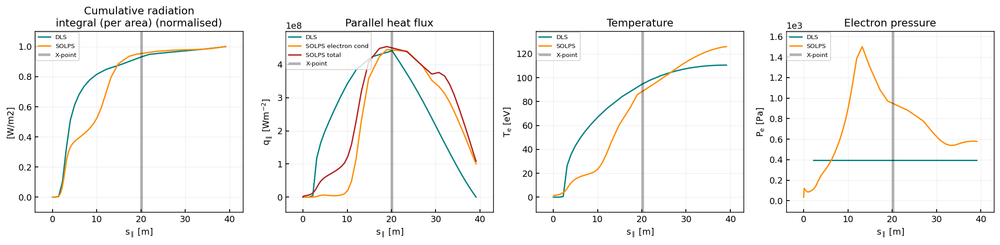

In [ ]:
case = "50MW"
sepadd = 2
slc = store_slc[case]

# d = eqb[case]["ol"][sepadd]
d = eqb_alt[case]["iu"][sepadd]
# d.scale_Lc(scale_factor=1.1)

# set switches
radios_default = {
    "upstreamGrid": True,  # SET TRUE if including domain above xpoint. if true, source of divertor heat flux comes from radial transport upstream, and Tu is at the midplane. If false, heat flux simply enters at the x point as qi, and Tu is located at the x point.
}

# set general run parameters
constants_default = {
    "gamma_sheath": 7,  # sheath transmittion coefficient for virtual target. Choice does not matter if Tt is low
    "Tt": 0.5,  # requested virtual target temp for calculating heat flux at detachment front. Aim for low (sub 1eV) Tt
    "qpllu0": 2.25e9 ,  # heat flux density at the x point
    "nu": 1e19,  # Upstream density (if constant)
    "nu0": 1e19,  # Upstream density (if constant)
    "cz0": 0.05,  # Impurity fraction (if constant)
    # "Lfunc": LfuncKallenbach("Ar"),  # impurity cooling function. More are available in AnalyticCoolingCurves.py
    "Lfunc" : slc.extract_cooling_curve("Ar", "outer_upper", sepadd = sepadd, plot = False)
}

#### Original average Cz and qpar
constants_default["cz0"] = 0.045
constants_default["qpllu0"] = 0.47e9 


SpolRange = np.linspace(0, d["Spol"][d["Xpoint"]], 10) # 
SparRange = [d["S"][np.argmin(np.abs(d["Spol"] - SpolRange[x]))] for x, _ in enumerate(SpolRange)]

try: 
        out = run_dls(
            constants = constants_default, 
            radios = radios_default, 
            d = d,
            SparRange = [2],
            control_variable = "density",
            verbosity = 0,
            Ctol = 1e-3,
            Ttol = 1e-3,
            dynamicGrid = False,
            dynamicGridRefinementRatio = 10,
            dynamicGridRefinementWidth = 2,
            dynamicGridDiagnosticPlot = False)
    
except KeyboardInterrupt:
    print("Stopped")
    sys.exit(0)
print(out["cvar"])


comp = compare_SOLPS_DLS(slc, out, region = "outer_upper", sepadd = sepadd)

comp.plot(["Cumrad", "qpar", "Te", "Pe"], normalise_radiation = True , radiation_per_area= True)
# comp.plot(["Te", "Ne", "Pe"], normalise_radiation = True , radiation_per_area= True)

# fig, ax =plt.subplots()
# ax.plot(out["Sprofiles"][0], out["Rprofiles"][0], marker = "o", ms = 3, lw = 1)
# ax.set_xlim(0,20)

## 50MW SOL ring 4 (sepadd 3)
- Whole lambda q

Solving...2.00...Complete in 1.6 seconds
[3.6928181561464504e+19]


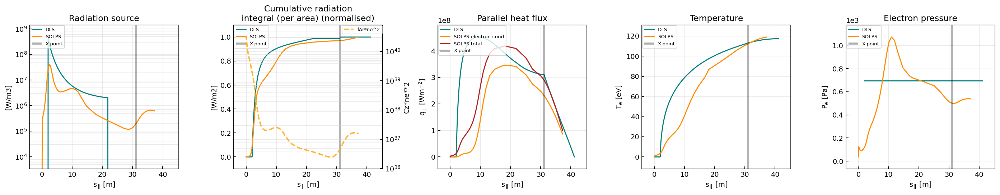

In [119]:
case = "50MW"
sepadd = 3
slc = store_slc[case]

# d = eqb[case]["ol"][sepadd]
d = eqb_alt[case]["iu"][sepadd]
# d.scale_Lc(scale_factor=1.1)

# set switches
radios_default = {
    "upstreamGrid": True,  # SET TRUE if including domain above xpoint. if true, source of divertor heat flux comes from radial transport upstream, and Tu is at the midplane. If false, heat flux simply enters at the x point as qi, and Tu is located at the x point.
}

# set general run parameters
constants_default = {
    "gamma_sheath": 7,  # sheath transmittion coefficient for virtual target. Choice does not matter if Tt is low
    "Tt": 0.5,  # requested virtual target temp for calculating heat flux at detachment front. Aim for low (sub 1eV) Tt
    "qpllu0": 2.25e9 ,  # heat flux density at the x point
    "nu": 1e19,  # Upstream density (if constant)
    "nu0": 1e19,  # Upstream density (if constant)
    "cz0": 0.05,  # Impurity fraction (if constant)
    # "Lfunc": LfuncKallenbach("Ar"),  # impurity cooling function. More are available in AnalyticCoolingCurves.py
    "Lfunc" : slc.extract_cooling_curve("Ar", "inner_upper", sepadd = sepadd, plot = False)
}

#### Original average Cz and qpar
constants_default["cz0"] = 0.045
constants_default["qpllu0"] = 0.31e9 


SpolRange = np.linspace(0, d["Spol"][d["Xpoint"]], 10) # 
SparRange = [d["S"][np.argmin(np.abs(d["Spol"] - SpolRange[x]))] for x, _ in enumerate(SpolRange)]

try: 
        out = run_dls(
            constants = constants_default, 
            radios = radios_default, 
            d = d,
            SparRange = [2],
            control_variable = "density",
            verbosity = 0,
            Ctol = 1e-3,
            Ttol = 1e-3,
            dynamicGrid = True,
            dynamicGridRefinementRatio = 5,
            dynamicGridRefinementWidth = 2,
            dynamicGridDiagnosticPlot = False)
    
except KeyboardInterrupt:
    print("Stopped")
    sys.exit(0)
print(out["cvar"])


comp = compare_SOLPS_DLS(slc, out, region = "outer_upper", sepadd = sepadd)

comp.plot(["Qrad", "Cumrad", "qpar", "Te", "Pe"], normalise_radiation = True , radiation_per_area= True, plot_cz = True)
# comp.plot(["Te", "Ne", "Pe"], normalise_radiation = True , radiation_per_area= True)

# fig, ax =plt.subplots()
# ax.plot(out["Sprofiles"][0], out["Rprofiles"][0], marker = "o", ms = 3, lw = 1)
# ax.set_xlim(0,20)

## 70MW

Solving...0.50...Complete in 1.5 seconds
[2.7197921714977944e+19]


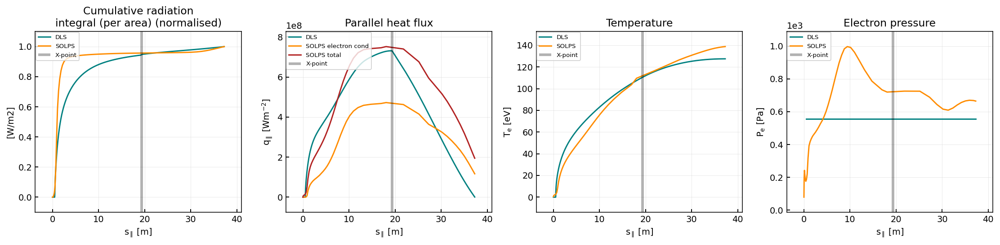

In [111]:
case = "70MW"
sepadd = 3
slc = store_slc[case]

# d = eqb[case]["ol"][sepadd]
d = eqb_alt[case]["ou"][sepadd]
# d.scale_Lc(scale_factor=1.1)

# set switches
radios_default = {
    "upstreamGrid": True,  # SET TRUE if including domain above xpoint. if true, source of divertor heat flux comes from radial transport upstream, and Tu is at the midplane. If false, heat flux simply enters at the x point as qi, and Tu is located at the x point.
}

# set general run parameters
constants_default = {
    "gamma_sheath": 7,  # sheath transmittion coefficient for virtual target. Choice does not matter if Tt is low
    "Tt": 0.5,  # requested virtual target temp for calculating heat flux at detachment front. Aim for low (sub 1eV) Tt
    "qpllu0": 2.25e9 ,  # heat flux density at the x point
    "nu": 1e19,  # Upstream density (if constant)
    "nu0": 1e19,  # Upstream density (if constant)
    "cz0": 0.05,  # Impurity fraction (if constant)
    # "Lfunc": LfuncKallenbach("Ar"),  # impurity cooling function. More are available in AnalyticCoolingCurves.py
    "Lfunc" : slc.extract_cooling_curve("Ar", "outer_upper", sepadd = sepadd, plot = False)
}

#### Original average Cz and qpar
constants_default["cz0"] = 0.045
constants_default["qpllu0"] = 0.77e9 


SpolRange = np.linspace(0, d["Spol"][d["Xpoint"]], 10) # 
SparRange = [d["S"][np.argmin(np.abs(d["Spol"] - SpolRange[x]))] for x, _ in enumerate(SpolRange)]

try: 
        out = run_dls(
            constants = constants_default, 
            radios = radios_default, 
            d = d,
            SparRange = [0.5],
            control_variable = "density",
            verbosity = 0,
            Ctol = 1e-3,
            Ttol = 1e-3,
            dynamicGrid = True,
            dynamicGridRefinementRatio = 5,
            dynamicGridRefinementWidth = 2,
            dynamicGridDiagnosticPlot = False)
    
except KeyboardInterrupt:
    print("Stopped")
    sys.exit(0)
print(out["cvar"])


comp = compare_SOLPS_DLS(slc, out, region = "outer_upper", sepadd = sepadd)

comp.plot(["Cumrad", "qpar", "Te", "Pe"], normalise_radiation = True , radiation_per_area= True, plot_cz = False)
# comp.plot(["Te", "Ne", "Pe"], normalise_radiation = True , radiation_per_area= True)

# fig, ax =plt.subplots()
# ax.plot(out["Sprofiles"][0], out["Rprofiles"][0], marker = "o", ms = 3, lw = 1)
# ax.set_xlim(0,20)

## Sepadd 7
Peak heat flux

Solving...0.50...Complete in 1.5 seconds
[2.4746892796913107e+19]


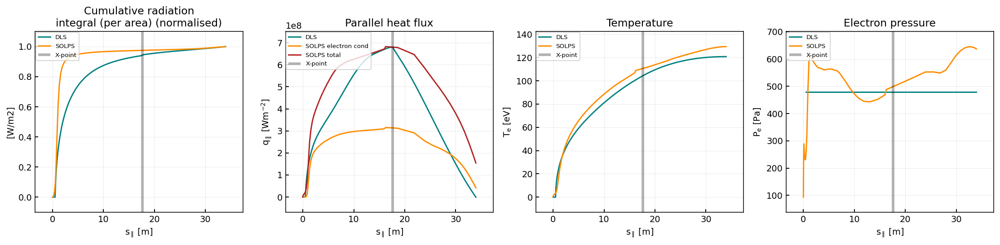

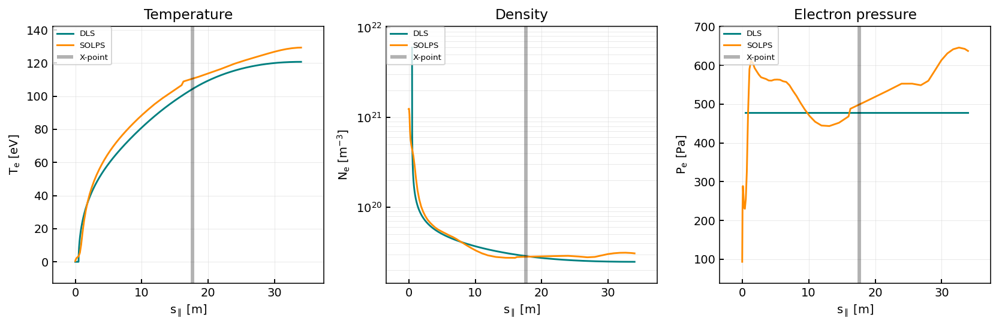

In [15]:
case = "100MW"
sepadd = 7
slc = store_slc[case]

# d = eqb[case]["ol"][sepadd]
d = eqb_alt[case]["ou"][sepadd]
# d.scale_Lc(scale_factor=1.1)

# set switches
radios_default = {
    "upstreamGrid": True,  # SET TRUE if including domain above xpoint. if true, source of divertor heat flux comes from radial transport upstream, and Tu is at the midplane. If false, heat flux simply enters at the x point as qi, and Tu is located at the x point.
}

# set general run parameters
constants_default = {
    "gamma_sheath": 7,  # sheath transmittion coefficient for virtual target. Choice does not matter if Tt is low
    "Tt": 0.5,  # requested virtual target temp for calculating heat flux at detachment front. Aim for low (sub 1eV) Tt
    "qpllu0": 2.25e9 ,  # heat flux density at the x point
    "nu": 1e19,  # Upstream density (if constant)
    "nu0": 1e19,  # Upstream density (if constant)
    "cz0": 0.05,  # Impurity fraction (if constant)
    # "Lfunc": LfuncKallenbach("Ar"),  # impurity cooling function. More are available in AnalyticCoolingCurves.py
    "Lfunc" : slc.extract_cooling_curve("Ar", "outer_upper", sepadd = sepadd, plot = False)
}

#### Original average Cz and qpar
constants_default["cz0"] = 0.045
constants_default["qpllu0"] = 0.72e9 


SpolRange = np.linspace(0, d["Spol"][d["Xpoint"]], 10) # 
SparRange = [d["S"][np.argmin(np.abs(d["Spol"] - SpolRange[x]))] for x, _ in enumerate(SpolRange)]

try: 
        out = run_dls(
            constants = constants_default, 
            radios = radios_default, 
            d = d,
            SparRange = [0.5],
            control_variable = "density",
            verbosity = 0,
            Ctol = 1e-3,
            Ttol = 1e-3,
            dynamicGrid = True,
            dynamicGridRefinementRatio = 5,
            dynamicGridRefinementWidth = 2,
            dynamicGridDiagnosticPlot = False)
    
except KeyboardInterrupt:
    print("Stopped")
    sys.exit(0)
print(out["cvar"])


comp = compare_SOLPS_DLS(slc, out, region = "outer_upper", sepadd = sepadd)

comp.plot(["Cumrad", "qpar", "Te", "Pe"], normalise_radiation = True , radiation_per_area= True)
comp.plot(["Te", "Ne", "Pe"], normalise_radiation = True , radiation_per_area= True)

# fig, ax =plt.subplots()
# ax.plot(out["Sprofiles"][0], out["Rprofiles"][0], marker = "o", ms = 3, lw = 1)
# ax.set_xlim(0,20)

## 100MW, SOL ring 4/sepadd 3


Solving...0.50...Complete in 0.5 seconds
[3.5652915495582364e+19]


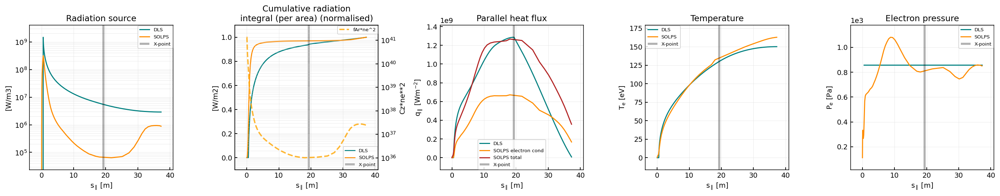

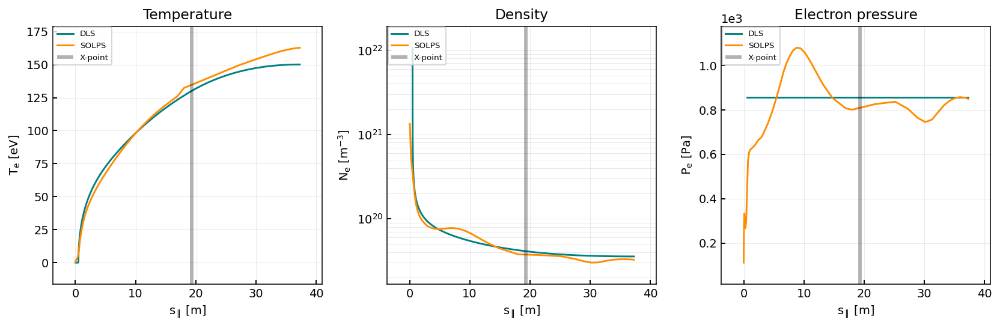

In [118]:
case = "100MW"
sepadd = 3
slc = store_slc[case]
d = eqb_alt[case]["ou"][sepadd]



# set switches
radios_default = {
    "upstreamGrid": True,  # SET TRUE if including domain above xpoint. if true, source of divertor heat flux comes from radial transport upstream, and Tu is at the midplane. If false, heat flux simply enters at the x point as qi, and Tu is located at the x point.
}

# set general run parameters
constants_default = {
    "gamma_sheath": 7,  # sheath transmittion coefficient for virtual target. Choice does not matter if Tt is low
    "Tt": 0.5,  # requested virtual target temp for calculating heat flux at detachment front. Aim for low (sub 1eV) Tt
    "qpllu0": 2.25e9 ,  # heat flux density at the x point
    "nu": 1e19,  # Upstream density (if constant)
    "nu0": 1e19,  # Upstream density (if constant)
    "cz0": 0.05,  # Impurity fraction (if constant)
    # "Lfunc": LfuncKallenbach("Ar"),  # impurity cooling function. More are available in AnalyticCoolingCurves.py
    "Lfunc" : slc.extract_cooling_curve("Ar", "outer_upper", sepadd = sepadd, plot = False)
}

#### Tune Cz / qpar
constants_default["cz0"] = 0.045
constants_default["qpllu0"] = 1.35e9 

#### Adjust kappa0
# constants_default["kappa0"] = 1000
# constants_default["qpllu0"] = 1.30e9 

#### Adjust kappa0 for BxBt/Lc to emulate uber narrow front
# constants_default["kappa0"] = 500
# constants_default["qpllu0"] = 1.30e9 

SpolRange = np.linspace(0, d["Spol"][d["Xpoint"]], 10) # 
SparRange = [d["S"][np.argmin(np.abs(d["Spol"] - SpolRange[x]))] for x, _ in enumerate(SpolRange)]

try: 
        out = run_dls(
            constants = constants_default, 
            radios = radios_default, 
            d = d,
            SparRange = [0.5],
            control_variable = "density",
            verbosity = 0,
            Ctol = 1e-3,
            Ttol = 1e-3,
            dynamicGrid = True,
            dynamicGridRefinementRatio = 5,
            dynamicGridRefinementWidth = 2,
            dynamicGridDiagnosticPlot = False)
    
except KeyboardInterrupt:
    print("Stopped")
    sys.exit(0)
print(out["cvar"])


comp = compare_SOLPS_DLS(slc, out, region = "outer_upper", sepadd = sepadd)

comp.plot(["Qrad", "Cumrad", "qpar", "Te", "Pe"], normalise_radiation = True , radiation_per_area= True, legend_loc = "best", plot_cz = True)
comp.plot(["Te", "Ne", "Pe"], normalise_radiation = True , radiation_per_area= True)

# fig, ax =plt.subplots()
# ax.plot(out["Sprofiles"][0], out["Rprofiles"][0], marker = "o", ms = 3, lw = 1)
# ax.set_xlim(0,20)

## 100MW inner Ar puff, PFR D puff, SOL ring 4/sepadd 3

In [125]:
store_slc.keys()

dict_keys(['50MW', '55MW', '60MW', '70MW', '80MW', '90MW', '100MW', '120MW', 'SPR45', '100MW_inner_arpuff', '100MW_innerar_midplanepuff'])

Solving...0.50...Complete in 1.3 seconds
[1.570202196187308e+19]


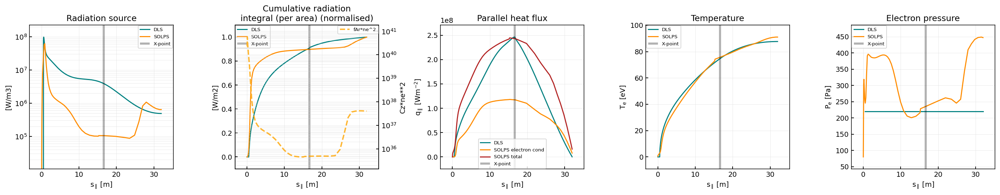

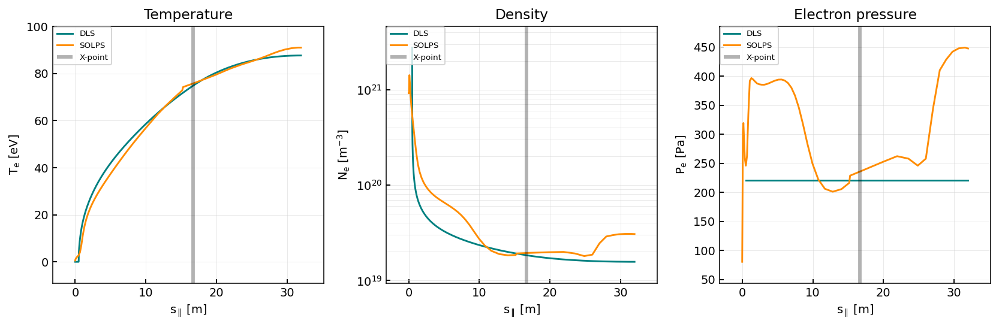

In [135]:
case = "100MW_inner_arpuff"
sepadd = 3
slc = store_slc[case]
d = eqb_alt[case]["ou"][sepadd]



# set switches
radios_default = {
    "upstreamGrid": True,  # SET TRUE if including domain above xpoint. if true, source of divertor heat flux comes from radial transport upstream, and Tu is at the midplane. If false, heat flux simply enters at the x point as qi, and Tu is located at the x point.
}

# set general run parameters
constants_default = {
    "gamma_sheath": 7,  # sheath transmittion coefficient for virtual target. Choice does not matter if Tt is low
    "Tt": 0.5,  # requested virtual target temp for calculating heat flux at detachment front. Aim for low (sub 1eV) Tt
    "qpllu0": 2.25e9 ,  # heat flux density at the x point
    "nu": 1e19,  # Upstream density (if constant)
    "nu0": 1e19,  # Upstream density (if constant)
    "cz0": 0.05,  # Impurity fraction (if constant)
    # "Lfunc": LfuncKallenbach("Ar"),  # impurity cooling function. More are available in AnalyticCoolingCurves.py
    "Lfunc" : slc.extract_cooling_curve("Ar", "outer_upper", sepadd = sepadd, plot = False)
}

#### Tune Cz / qpar
constants_default["cz0"] = 0.045
constants_default["qpllu0"] = 0.27e9 

#### Adjust kappa0
# constants_default["kappa0"] = 1000
# constants_default["qpllu0"] = 1.30e9 

#### Adjust kappa0 for BxBt/Lc to emulate uber narrow front
# constants_default["kappa0"] = 500
# constants_default["qpllu0"] = 1.30e9 

SpolRange = np.linspace(0, d["Spol"][d["Xpoint"]], 10) # 
SparRange = [d["S"][np.argmin(np.abs(d["Spol"] - SpolRange[x]))] for x, _ in enumerate(SpolRange)]

try: 
        out = run_dls(
            constants = constants_default, 
            radios = radios_default, 
            d = d,
            SparRange = [0.5],
            control_variable = "density",
            verbosity = 0,
            Ctol = 1e-3,
            Ttol = 1e-3,
            dynamicGrid = True,
            dynamicGridRefinementRatio = 5,
            dynamicGridRefinementWidth = 2,
            dynamicGridDiagnosticPlot = False)
    
except KeyboardInterrupt:
    print("Stopped")
    sys.exit(0)
print(out["cvar"])


comp = compare_SOLPS_DLS(slc, out, region = "outer_upper", sepadd = sepadd)

comp.plot(["Qrad", "Cumrad", "qpar", "Te", "Pe"], normalise_radiation = True , radiation_per_area= True, legend_loc = "best", plot_cz = True)
comp.plot(["Te", "Ne", "Pe"], normalise_radiation = True , radiation_per_area= True)

# fig, ax =plt.subplots()
# ax.plot(out["Sprofiles"][0], out["Rprofiles"][0], marker = "o", ms = 3, lw = 1)
# ax.set_xlim(0,20)

## 100MW inner Ar puff, MP D puff, SOL ring 6/sepadd 5

In [ ]:
store_slc.keys()

dict_keys(['50MW', '55MW', '60MW', '70MW', '80MW', '90MW', '100MW', '120MW', 'SPR45', '100MW_inner_arpuff', '100MW_innerar_midplanepuff'])

Solving...0.50...Complete in 1.3 seconds
qmax = 7.01e+07


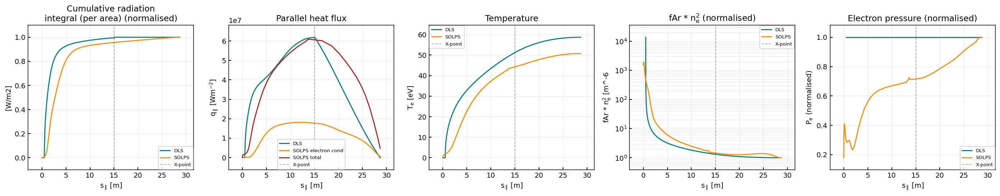

In [49]:
case = "100MW_innerar_midplanepuff"
sepadd = 5
slc = store_slc[case]
d = eqb_alt[case]["ou"][sepadd]



# set switches
radios_default = {
    "upstreamGrid": True,  # SET TRUE if including domain above xpoint. if true, source of divertor heat flux comes from radial transport upstream, and Tu is at the midplane. If false, heat flux simply enters at the x point as qi, and Tu is located at the x point.
}

# set general run parameters
constants_default = {
    "gamma_sheath": 7,  # sheath transmittion coefficient for virtual target. Choice does not matter if Tt is low
    "Tt": 0.5,  # requested virtual target temp for calculating heat flux at detachment front. Aim for low (sub 1eV) Tt
    "qpllu0": 2.25e9 ,  # heat flux density at the x point
    "nu": 1e19,  # Upstream density (if constant)
    "nu0": 1e19,  # Upstream density (if constant)
    "cz0": 0.05,  # Impurity fraction (if constant)
    # "Lfunc": LfuncKallenbach("Ar"),  # impurity cooling function. More are available in AnalyticCoolingCurves.py
    "Lfunc" : slc.extract_cooling_curve("Ar", "outer_upper", sepadd = sepadd, order = 10, plot = False)
}

#### Tune Cz / qpar
constants_default["cz0"] = 0.06
constants_default["qpllu0"] = 6.2e7

#### Adjust kappa0
# constants_default["kappa0"] = 1000
# constants_default["qpllu0"] = 1.30e9 

#### Adjust kappa0 for BxBt/Lc to emulate uber narrow front
# constants_default["kappa0"] = 500
# constants_default["qpllu0"] = 1.30e9 

SpolRange = np.linspace(0, d["Spol"][d["Xpoint"]], 10) # 
SparRange = [d["S"][np.argmin(np.abs(d["Spol"] - SpolRange[x]))] for x, _ in enumerate(SpolRange)]

try: 
        out = run_dls(
            constants = constants_default, 
            radios = radios_default, 
            d = d,
            SparRange = [0.5],
            control_variable = "density",
            verbosity = 0,
            Ctol = 1e-3,
            Ttol = 1e-3,
            dynamicGrid = True,
            dynamicGridRefinementRatio = 5,
            dynamicGridRefinementWidth = 2,
            dynamicGridDiagnosticPlot = False)
    
except KeyboardInterrupt:
    print("Stopped")
    sys.exit(0)

comp = compare_SOLPS_DLS(slc, out, region = "outer_upper", sepadd = sepadd)
qmax = abs(comp.solps["fhx_total"]).max() * 1.15
print(f"qmax = {qmax:.2e}")

comp.plot(["Cumrad", "qpar", "Te", "cz", "Pe"], normalise_radiation = True , radiation_per_area= True, legend_loc = "best", plot_cz = False)
# comp.plot(["Te", "Ne", "Pe"], normalise_radiation = True , radiation_per_area= True)

## 100MW inner Ar puff, MP D puff, SOL ring 4/sepadd 3

In [134]:
store_slc.keys()

dict_keys(['50MW', '55MW', '60MW', '70MW', '80MW', '90MW', '100MW', '120MW', 'SPR45', '100MW_inner_arpuff', '100MW_innerar_midplanepuff'])

Solving...0.50...Complete in 0.5 seconds
[1.4141052482237075e+19]
qmax = 2.04e+08


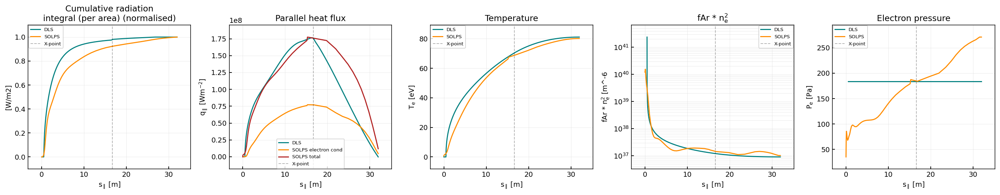

In [38]:
case = "100MW_innerar_midplanepuff"
sepadd = 3
slc = store_slc[case]
d = eqb_alt[case]["ou"][sepadd]



# set switches
radios_default = {
    "upstreamGrid": True,  # SET TRUE if including domain above xpoint. if true, source of divertor heat flux comes from radial transport upstream, and Tu is at the midplane. If false, heat flux simply enters at the x point as qi, and Tu is located at the x point.
}

# set general run parameters
constants_default = {
    "gamma_sheath": 7,  # sheath transmittion coefficient for virtual target. Choice does not matter if Tt is low
    "Tt": 0.5,  # requested virtual target temp for calculating heat flux at detachment front. Aim for low (sub 1eV) Tt
    "qpllu0": 2.25e9 ,  # heat flux density at the x point
    "nu": 1e19,  # Upstream density (if constant)
    "nu0": 1e19,  # Upstream density (if constant)
    "cz0": 0.05,  # Impurity fraction (if constant)
    # "Lfunc": LfuncKallenbach("Ar"),  # impurity cooling function. More are available in AnalyticCoolingCurves.py
    "Lfunc" : slc.extract_cooling_curve("Ar", "outer_upper", sepadd = sepadd, order = 10, plot = False)
}

#### Tune Cz / qpar
constants_default["cz0"] = 0.045
constants_default["qpllu0"] = 0.18e9 

#### Adjust kappa0
# constants_default["kappa0"] = 1000
# constants_default["qpllu0"] = 1.30e9 

#### Adjust kappa0 for BxBt/Lc to emulate uber narrow front
# constants_default["kappa0"] = 500
# constants_default["qpllu0"] = 1.30e9 

SpolRange = np.linspace(0, d["Spol"][d["Xpoint"]], 10) # 
SparRange = [d["S"][np.argmin(np.abs(d["Spol"] - SpolRange[x]))] for x, _ in enumerate(SpolRange)]

try: 
        out = run_dls(
            constants = constants_default, 
            radios = radios_default, 
            d = d,
            SparRange = [0.5],
            control_variable = "density",
            verbosity = 0,
            Ctol = 1e-3,
            Ttol = 1e-3,
            dynamicGrid = True,
            dynamicGridRefinementRatio = 5,
            dynamicGridRefinementWidth = 2,
            dynamicGridDiagnosticPlot = False)
    
except KeyboardInterrupt:
    print("Stopped")
    sys.exit(0)
print(out["cvar"])


comp = compare_SOLPS_DLS(slc, out, region = "outer_upper", sepadd = sepadd)
qmax = abs(comp.solps["fhx_total"]).max() * 1.15
print(f"qmax = {qmax:.2e}")

comp.plot(["Cumrad", "qpar", "Te", "cz", "Pe"], normalise_radiation = True , radiation_per_area= True, legend_loc = "best", plot_cz = False)
# comp.plot(["Te", "Ne", "Pe"], normalise_radiation = True , radiation_per_area= True)

## 100MW inner Ar puff, MP D puff, SOL ring 3/sepadd 2

In [ ]:
store_slc.keys()

dict_keys(['50MW', '55MW', '60MW', '70MW', '80MW', '90MW', '100MW', '120MW', 'SPR45', '100MW_inner_arpuff', '100MW_innerar_midplanepuff'])

Solving...0.50...Complete in 1.2 seconds
qmax = 3.48e+08


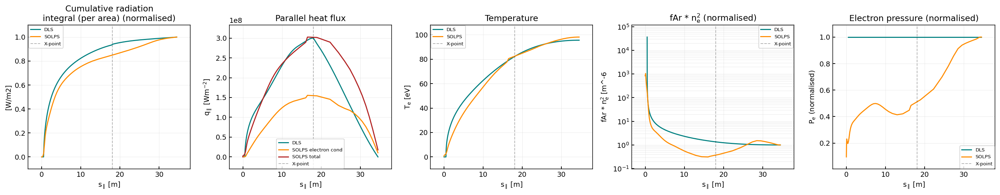

In [50]:
case = "100MW_innerar_midplanepuff"
sepadd = 2
slc = store_slc[case]
d = eqb_alt[case]["ou"][sepadd]



# set switches
radios_default = {
    "upstreamGrid": True,  # SET TRUE if including domain above xpoint. if true, source of divertor heat flux comes from radial transport upstream, and Tu is at the midplane. If false, heat flux simply enters at the x point as qi, and Tu is located at the x point.
}

# set general run parameters
constants_default = {
    "gamma_sheath": 7,  # sheath transmittion coefficient for virtual target. Choice does not matter if Tt is low
    "Tt": 0.5,  # requested virtual target temp for calculating heat flux at detachment front. Aim for low (sub 1eV) Tt
    "qpllu0": 2.25e9 ,  # heat flux density at the x point
    "nu": 1e19,  # Upstream density (if constant)
    "nu0": 1e19,  # Upstream density (if constant)
    "cz0": 0.05,  # Impurity fraction (if constant)
    # "Lfunc": LfuncKallenbach("Ar"),  # impurity cooling function. More are available in AnalyticCoolingCurves.py
    "Lfunc" : slc.extract_cooling_curve("Ar", "outer_upper", sepadd = sepadd, order = 10, plot = False)
}

#### Tune Cz / qpar
constants_default["cz0"] = 0.045
constants_default["qpllu0"] = 3.2e8

#### Adjust kappa0
# constants_default["kappa0"] = 1000
# constants_default["qpllu0"] = 1.30e9 

#### Adjust kappa0 for BxBt/Lc to emulate uber narrow front
# constants_default["kappa0"] = 500
# constants_default["qpllu0"] = 1.30e9 

SpolRange = np.linspace(0, d["Spol"][d["Xpoint"]], 10) # 
SparRange = [d["S"][np.argmin(np.abs(d["Spol"] - SpolRange[x]))] for x, _ in enumerate(SpolRange)]

try: 
        out = run_dls(
            constants = constants_default, 
            radios = radios_default, 
            d = d,
            SparRange = [0.5],
            control_variable = "density",
            verbosity = 0,
            Ctol = 1e-3,
            Ttol = 1e-3,
            dynamicGrid = True,
            dynamicGridRefinementRatio = 5,
            dynamicGridRefinementWidth = 2,
            dynamicGridDiagnosticPlot = False)
    
except KeyboardInterrupt:
    print("Stopped")
    sys.exit(0)


comp = compare_SOLPS_DLS(slc, out, region = "outer_upper", sepadd = sepadd)
qmax = abs(comp.solps["fhx_total"]).max() * 1.15
print(f"qmax = {qmax:.2e}")

comp.plot(["Cumrad", "qpar", "Te", "cz", "Pe"], normalise_radiation = True , radiation_per_area= True, legend_loc = "best", plot_cz = False)
# comp.plot(["Te", "Ne", "Pe"], normalise_radiation = True , radiation_per_area= True)

# fig, ax =plt.subplots()
# ax.plot(out["Sprofiles"][0], out["Rprofiles"][0], marker = "o", ms = 3, lw = 1)
# ax.set_xlim(0,20)

## 100MW inner Ar puff, MP D puff, SOL ring 2/sepadd 1

In [ ]:
store_slc.keys()

dict_keys(['50MW', '55MW', '60MW', '70MW', '80MW', '90MW', '100MW', '120MW', 'SPR45', '100MW_inner_arpuff', '100MW_innerar_midplanepuff'])

Solving...0.50...Complete in 1.0 seconds
qmax = 4.36e+08


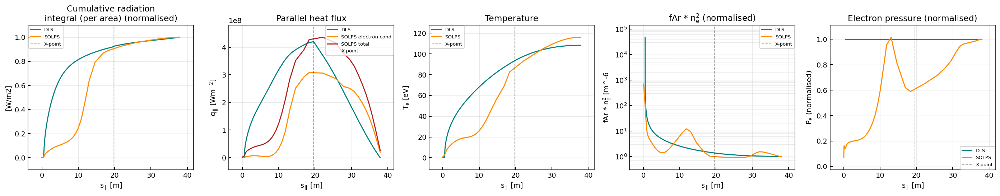

In [51]:
case = "100MW_innerar_midplanepuff"
sepadd = 1
slc = store_slc[case]
d = eqb_alt[case]["ou"][sepadd]



# set switches
radios_default = {
    "upstreamGrid": True,  # SET TRUE if including domain above xpoint. if true, source of divertor heat flux comes from radial transport upstream, and Tu is at the midplane. If false, heat flux simply enters at the x point as qi, and Tu is located at the x point.
}

# set general run parameters
constants_default = {
    "gamma_sheath": 7,  # sheath transmittion coefficient for virtual target. Choice does not matter if Tt is low
    "Tt": 0.5,  # requested virtual target temp for calculating heat flux at detachment front. Aim for low (sub 1eV) Tt
    "qpllu0": 2.25e9 ,  # heat flux density at the x point
    "nu": 1e19,  # Upstream density (if constant)
    "nu0": 1e19,  # Upstream density (if constant)
    "cz0": 0.05,  # Impurity fraction (if constant)
    # "Lfunc": LfuncKallenbach("Ar"),  # impurity cooling function. More are available in AnalyticCoolingCurves.py
    "Lfunc" : slc.extract_cooling_curve("Ar", "outer_upper", sepadd = sepadd, order = 10, plot = False)
}

#### Tune Cz / qpar
constants_default["cz0"] = 0.045
constants_default["qpllu0"] = 4.55e8

#### Adjust kappa0
# constants_default["kappa0"] = 1000
# constants_default["qpllu0"] = 1.30e9 

#### Adjust kappa0 for BxBt/Lc to emulate uber narrow front
# constants_default["kappa0"] = 500
# constants_default["qpllu0"] = 1.30e9 

SpolRange = np.linspace(0, d["Spol"][d["Xpoint"]], 10) # 
SparRange = [d["S"][np.argmin(np.abs(d["Spol"] - SpolRange[x]))] for x, _ in enumerate(SpolRange)]

try: 
        out = run_dls(
            constants = constants_default, 
            radios = radios_default, 
            d = d,
            SparRange = [0.5],
            control_variable = "density",
            verbosity = 0,
            Ctol = 1e-3,
            Ttol = 1e-3,
            dynamicGrid = True,
            dynamicGridRefinementRatio = 5,
            dynamicGridRefinementWidth = 2,
            dynamicGridDiagnosticPlot = False)
    
except KeyboardInterrupt:
    print("Stopped")
    sys.exit(0)


comp = compare_SOLPS_DLS(slc, out, region = "outer_upper", sepadd = sepadd)
qmax = abs(comp.solps["fhx_total"]).max()
print(f"qmax = {qmax:.2e}")

comp.plot(["Cumrad", "qpar", "Te", "cz", "Pe"], normalise_radiation = True , radiation_per_area= True, legend_loc = "best", plot_cz = False)
# comp.plot(["Te", "Ne", "Pe"], normalise_radiation = True , radiation_per_area= True)

# fig, ax =plt.subplots()
# ax.plot(out["Sprofiles"][0], out["Rprofiles"][0], marker = "o", ms = 3, lw = 1)
# ax.set_xlim(0,20)

## Puff scan cases
- All on 100MW, inner Ar puff, MP D puff

### D 1e24, Ar 5e21

In [8]:
store_slc.keys()

dict_keys(['50MW', '55MW', '60MW', '70MW', '80MW', '90MW', '100MW', '120MW', 'SPR45', '100MW_inner_arpuff', '100MW_innerar_midplanepuff', '100MW_inar_mp_Ar_2.0e21_D_1.0e24', '100MW_inar_mp_Ar_2.5e21_D_1.0e24', '100MW_inar_mp_Ar_5.0e21_D_1.0e24', '100MW_inar_mp_Ar_6.0e21_D_0.8e24', '100MW_inar_mp_Ar_7.0e21_D_0.8e24', '100MW_inar_mp_Ar_7.0e21_D_0.6e24'])

Solving...0.50...Complete in 1.2 seconds
[2.3264602440522277e+19]
qmax = 2.92e+08


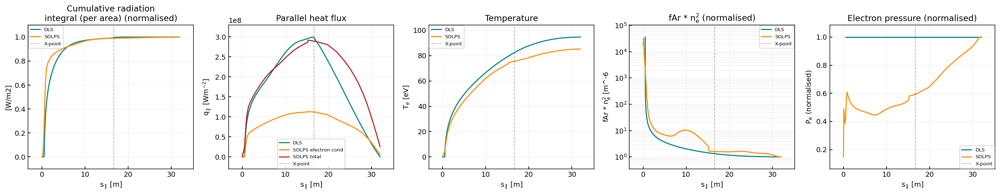

In [75]:
case = "100MW_inar_mp_Ar_5.0e21_D_1.0e24"
sepadd = 3
slc = store_slc[case]
d = eqb_alt[case]["ou"][sepadd]



# set switches
radios_default = {
    "upstreamGrid": True,  # SET TRUE if including domain above xpoint. if true, source of divertor heat flux comes from radial transport upstream, and Tu is at the midplane. If false, heat flux simply enters at the x point as qi, and Tu is located at the x point.
}

# set general run parameters
constants_default = {
    "gamma_sheath": 7,  # sheath transmittion coefficient for virtual target. Choice does not matter if Tt is low
    "Tt": 0.5,  # requested virtual target temp for calculating heat flux at detachment front. Aim for low (sub 1eV) Tt
    "qpllu0": 2.25e9 ,  # heat flux density at the x point
    "nu": 1e19,  # Upstream density (if constant)
    "nu0": 1e19,  # Upstream density (if constant)
    "cz0": 0.05,  # Impurity fraction (if constant)
    # "Lfunc": LfuncKallenbach("Ar"),  # impurity cooling function. More are available in AnalyticCoolingCurves.py
    "Lfunc" : slc.extract_cooling_curve("Ar", "outer_upper", sepadd = sepadd, order = 10, plot = False)
}

#### Tune Cz / qpar
constants_default["cz0"] = 0.045
constants_default["qpllu0"] = 0.30e9 


SpolRange = np.linspace(0, d["Spol"][d["Xpoint"]], 10) # 
SparRange = [d["S"][np.argmin(np.abs(d["Spol"] - SpolRange[x]))] for x, _ in enumerate(SpolRange)]

try: 
        out = run_dls(
            constants = constants_default, 
            radios = radios_default, 
            d = d,
            SparRange = [0.5],
            control_variable = "density",
            verbosity = 0,
            Ctol = 1e-3,
            Ttol = 1e-3,
            dynamicGrid = True,
            dynamicGridRefinementRatio = 5,
            dynamicGridRefinementWidth = 2,
            dynamicGridDiagnosticPlot = False)
    
except KeyboardInterrupt:
    print("Stopped")
    sys.exit(0)
print(out["cvar"])


comp = compare_SOLPS_DLS(slc, out, region = "outer_upper", sepadd = sepadd)
qmax = abs(comp.solps["fhx_total"]).max() 
print(f"qmax = {qmax:.2e}")

comp.plot(["Cumrad", "qpar", "Te", "cz", "Pe"], normalise_radiation = True , radiation_per_area= True, legend_loc = "best", plot_cz = False)
# comp.plot(["Te", "Ne", "Pe"], normalise_radiation = True , radiation_per_area= True)

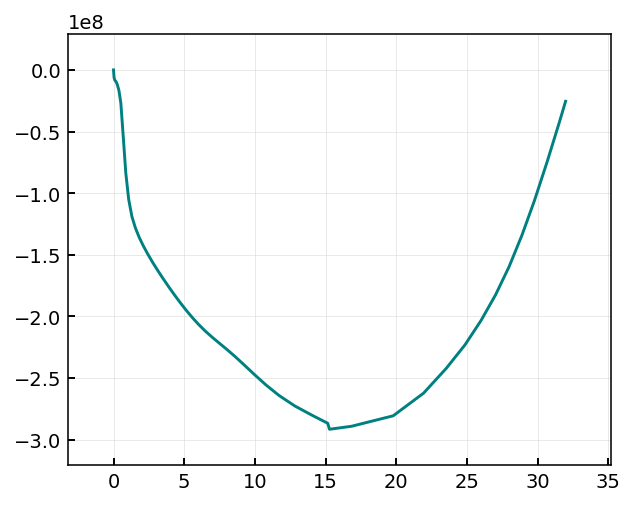

In [11]:
df = comp.solps
fig, ax = plt.subplots()
ax.plot(df["Spar"], df["fhx_total"])

In [15]:
print("{%:.2e}".format(comp.solps["fhx_total"].min()))

KeyError: '%'

# Outer fR/Lc

In [148]:
profiles = {}

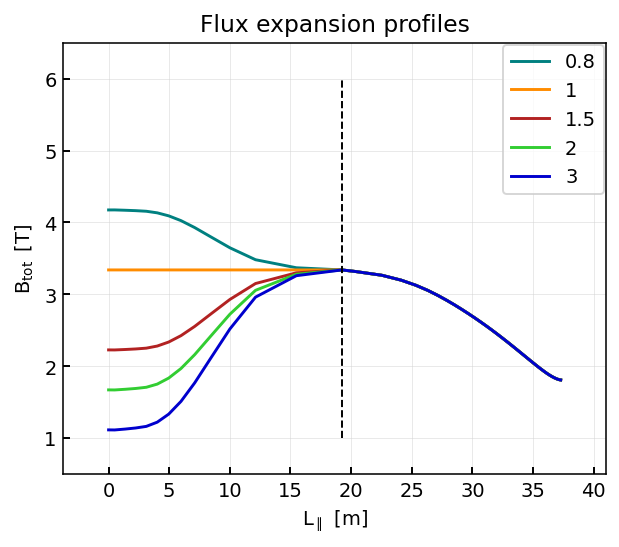

In [149]:
from fusiondls.Profile import Profile

case = "100MW"
region = "ou"
sepadd = 3

p = eqb_alt[case][region][sepadd]

newp = Profile(p["R"], p["Z"], p["Xpoint"], p["Btot"], p["Bpol"], p["S"], p["Spol"], name = "base")

list_bxbt = [0.8, 1, 1.5, 2, 3]
profiles_bxbt = {}

fig, ax = plt.subplots()

for bxbt in list_bxbt:
    profiles_bxbt[bxbt] = copy.deepcopy(newp)
    profiles_bxbt[bxbt].scale_BxBt(BxBt = bxbt)
    
    ax.plot(profiles_bxbt[bxbt]["S"], profiles_bxbt[bxbt]["Btot"], label = bxbt)
    
ax.vlines(newp["S"][newp["Xpoint"]], 1, 6, color = "k", lw = 1.0, linestyle = "--")
ax.legend()
ax.set_xlabel("$L_{\parallel}\ \ [m]$")
ax.set_ylabel("$B_{tot}\ \ [T]$")
ax.set_title("Flux expansion profiles")

profiles["BxBt"] = profiles_bxbt

In [150]:
slc = store_slc[case]
d = eqb_alt[case][region][sepadd]

#### USE SAME CONSTANTS AS ABOVE

store_bxbt = dict()

for bxbt in list_bxbt:
    print(bxbt)
    d = profiles_bxbt[bxbt]

    try: 
            out = run_dls(
                constants = constants_default, 
                radios = radios_default, 
                d = d,
                SparRange = [0],
                control_variable = "density",
                verbosity = 0,
                Ctol = 1e-3,
                Ttol = 1e-3,
                dynamicGrid = True)
            
            store_bxbt[bxbt] = copy.deepcopy(out)
        
    except KeyboardInterrupt:
        print("Stopped")
        sys.exit(0)
    print(out["cvar"])

0.8
Solving...0.00...Complete in 1.4 seconds
[1.2469115305853315e+20]
1
Solving...0.00...Complete in 2.3 seconds
[1.0211246982843675e+20]
1.5
Solving...0.00...Complete in 1.3 seconds
[7.052278229948578e+19]
2
Solving...0.00...Complete in 1.9 seconds
[5.427208314163588e+19]
3
Solving...0.00...Complete in 1.7 seconds
[3.796920631313157e+19]


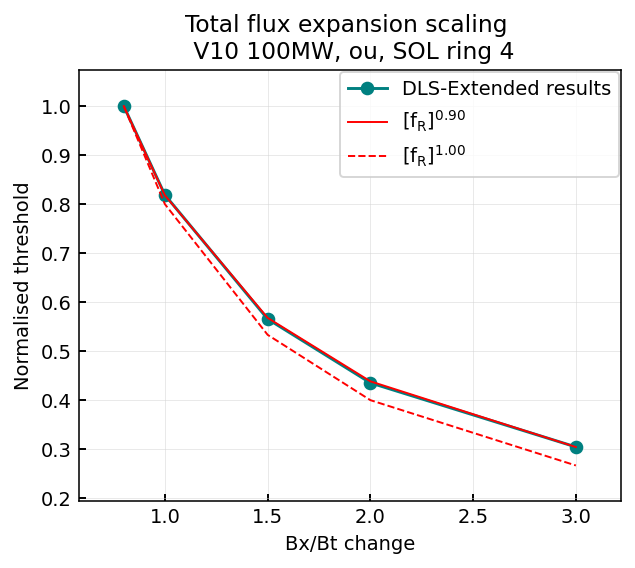

In [154]:
profiles = profiles_bxbt.copy()
stores = store_bxbt.copy()

df = pd.DataFrame()
df["BxBt"] = np.array([profiles[x].get_total_flux_expansion() for x in profiles])
df["thresholds"] = np.array([stores[x]["threshold"] for x in profiles])
df["improvement"] = df["thresholds"] / df["thresholds"].iloc[0]
df["scaling"] = df["BxBt"].iloc[0] / df["BxBt"]
df["scaling_custom"] = (df["BxBt"].iloc[0] / df["BxBt"])**0.9

fig, ax = plt.subplots()
style = dict(marker = "o")
ax.plot(df["BxBt"], df["improvement"], label = "DLS-Extended results", **style)
ax.plot(df["BxBt"], df["scaling_custom"], label = "$[f_R]^{0.90}$", lw = 1, c = "r")
ax.plot(df["BxBt"], df["scaling"], label = "$[f_R]^{1.00}$", lw = 1, c = "r", ls = "--")

ax.set_xlabel("Bx/Bt change")
ax.set_ylabel("Normalised threshold")
ax.set_title(f"Total flux expansion scaling \n V10 {case}, {region}, SOL ring {sepadd+1}")
ax.legend()

## Lc

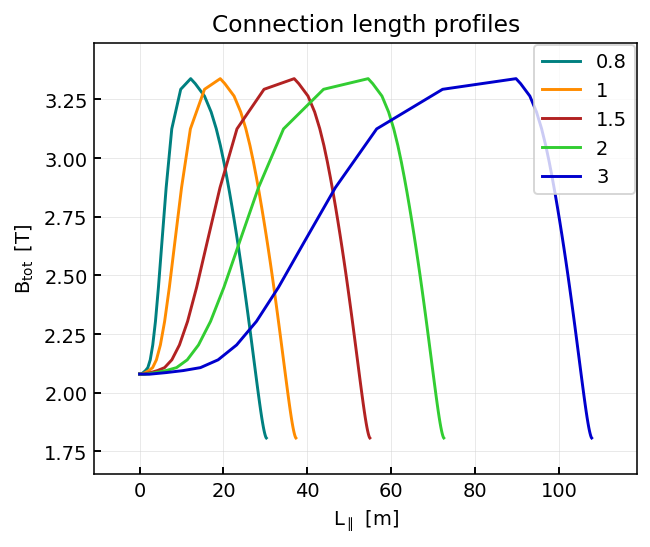

In [155]:
case = "100MW"
region = "ou"
sepadd = 3

p = eqb_alt[case][region][sepadd]

newp = Profile(p["R"], p["Z"], p["Xpoint"], p["Btot"], p["Bpol"], p["S"], p["Spol"], name = "base")

list_Lc = [0.8, 1, 1.5, 2, 3]
profiles_Lc = {}

fig, ax = plt.subplots()

for Lc in list_Lc:
    profiles_Lc[Lc] = copy.deepcopy(newp)
    profiles_Lc[Lc].scale_Lc(scale_factor = Lc)
    
    p = profiles_Lc[Lc]
    ax.plot(profiles_Lc[Lc]["S"], profiles_Lc[Lc]["Btot"], label = Lc)
    # ax.plot(p["S"][p["Xpoint"]], p["Btot"][p["Xpoint"]], marker = "x", ms = 5, c = "k")
    
# ax.vlines(newp["S"][newp["Xpoint"]], 1, 6, color = "k", lw = 1.0, linestyle = "--")
ax.legend()
ax.set_xlabel("$L_{\parallel}\ \ [m]$")
ax.set_ylabel("$B_{tot}\ \ [T]$")
ax.set_title("Connection length profiles")

profiles["Lc"] = profiles_Lc

In [156]:
slc = store_slc[case]
d = eqb_alt[case][region][sepadd]

#### USE SAME CONSTANTS AS ABOVE

store_Lc = dict()

for Lc in list_Lc:
    print(Lc)
    d = profiles_Lc[Lc]

    try: 
            out = run_dls(
                constants = constants_default, 
                radios = radios_default, 
                d = d,
                SparRange = [0],
                control_variable = "density",
                verbosity = 0,
                Ctol = 1e-3,
                Ttol = 1e-3,
                dynamicGrid = True)
            
            store_Lc[Lc] = copy.deepcopy(out)
        
    except KeyboardInterrupt:
        print("Stopped")
        sys.exit(0)
    print(out["cvar"])

0.8
Solving...0.00...Complete in 1.5 seconds
[7.22362792505867e+19]
1
Solving...0.00...Complete in 1.3 seconds
[6.613505942621282e+19]
1.5
Solving...0.00...Complete in 1.4 seconds
[5.78050037368711e+19]
2
Solving...0.00...Complete in 1.8 seconds
[5.267461212605902e+19]
3
Solving...0.00...Complete in 1.7 seconds
[4.661615447197942e+19]


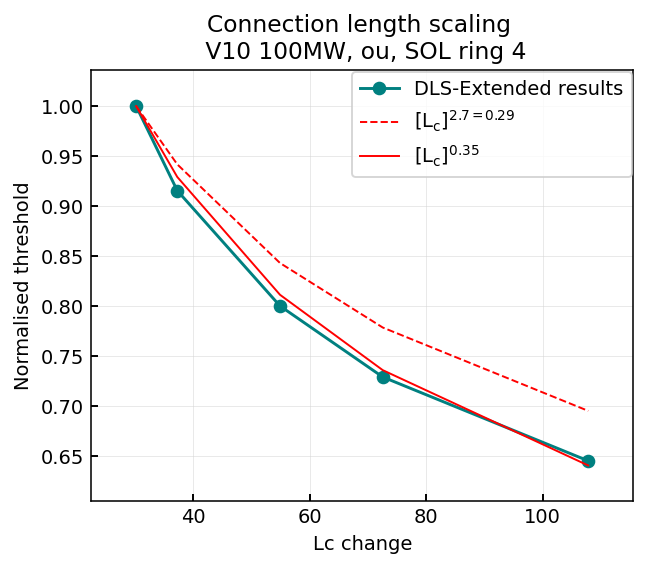

In [159]:
profiles = profiles_Lc.copy()
stores = store_Lc.copy()

df = pd.DataFrame()
df["Lc"] = np.array([profiles[x].get_connection_length() for x in profiles])
df["thresholds"] = np.array([stores[x]["threshold"] for x in profiles])
df["improvement"] = df["thresholds"] / df["thresholds"].iloc[0]
df["scaling"] = (df["Lc"].iloc[0] / df["Lc"])**(2/7)
df["scaling_custom"] = (df["Lc"].iloc[0] / df["Lc"])**(0.35)

fig, ax = plt.subplots()
style = dict(marker = "o")
ax.plot(df["Lc"], df["improvement"], label = "DLS-Extended results", **style)
ax.plot(df["Lc"], df["scaling"], label = "$[L_c]^{2.7=0.29}$", lw = 1, c = "r", ls = "--")
ax.plot(df["Lc"], df["scaling_custom"], label = "$[L_c]^{0.35}$", lw = 1, c = "r")


ax.set_xlabel("Lc change")
ax.set_ylabel("Normalised threshold")
ax.set_title(f"Connection length scaling \n V10 {case}, {region}, SOL ring {sepadd+1}")
ax.legend()

# Inner divertor

## 50MW, SOL ring 4 / sepadd 3

Solving...1.50...Complete in 1.6 seconds
[3.5964426624175604e+19]


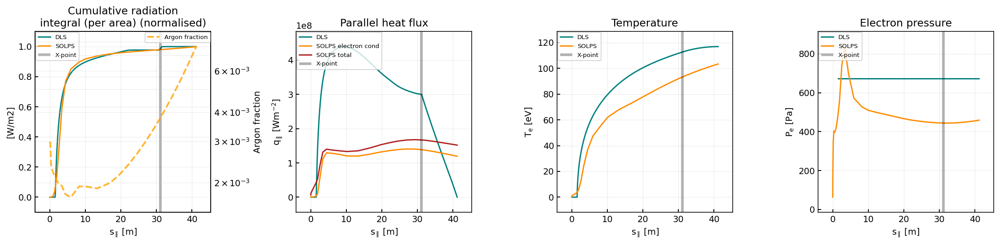

In [90]:
case = "50MW"
sepadd = 3
slc = store_slc[case]

d = eqb_alt[case]["iu"][sepadd]

# set switches
radios_default = {
    "upstreamGrid": True,  # SET TRUE if including domain above xpoint. if true, source of divertor heat flux comes from radial transport upstream, and Tu is at the midplane. If false, heat flux simply enters at the x point as qi, and Tu is located at the x point.
}

# set general run parameters
constants_default = {
    "gamma_sheath": 7,  # sheath transmittion coefficient for virtual target. Choice does not matter if Tt is low
    "Tt": 0.5,  # requested virtual target temp for calculating heat flux at detachment front. Aim for low (sub 1eV) Tt
    "qpllu0": 2.25e9 ,  # heat flux density at the x point
    "nu": 1e19,  # Upstream density (if constant)
    "nu0": 1e19,  # Upstream density (if constant)
    "cz0": 0.05,  # Impurity fraction (if constant)
    # "Lfunc": LfuncKallenbach("Ar"),  # impurity cooling function. More are available in AnalyticCoolingCurves.py
    "Lfunc" : slc.extract_cooling_curve("Ar", "inner_upper", sepadd = sepadd, plot = False)
}

#### Original average Cz and qpar
constants_default["cz0"] = 0.045
constants_default["qpllu0"] = 0.3e9 


SpolRange = np.linspace(0, d["Spol"][d["Xpoint"]], 10) # 
SparRange = [d["S"][np.argmin(np.abs(d["Spol"] - SpolRange[x]))] for x, _ in enumerate(SpolRange)]

try: 
        out = run_dls(
            constants = constants_default, 
            radios = radios_default, 
            d = d,
            SparRange = [1.5],
            control_variable = "density",
            verbosity = 0,
            Ctol = 1e-3,
            Ttol = 1e-3,
            dynamicGrid = True,
            dynamicGridRefinementRatio = 10,
            dynamicGridRefinementWidth = 2,
            dynamicGridDiagnosticPlot = False)
    
except KeyboardInterrupt:
    print("Stopped")
    sys.exit(0)
print(out["cvar"])


comp = compare_SOLPS_DLS(slc, out, region = "inner_upper", sepadd = sepadd)

comp.plot(["Cumrad", "qpar", "Te", "Pe"], normalise_radiation = True , radiation_per_area= True)


# fig, ax =plt.subplots()
# ax.plot(out["Sprofiles"][0], out["Rprofiles"][0], marker = "o", ms = 3, lw = 1)
# ax.set_xlim(0,20)

In [93]:
out["Xpoints"][0]

476

In [94]:
out["Sprofiles"][0][476]

31.14761936259918

In [92]:
comp.dls[comp.dls["Xpoint"]==1]

,Qrad,Spar,Spol,Te,qpar,Btot,Ne,Xpoint,qradial,Prad_per_area,Prad_per_area_cum,Prad_per_area_cum_norm,Prad_cum,Prad_cum_norm,Pe
476,0.0,31.147619,4.479506,112.655786,3.000971e+08,3.641289,3.730483e+19,1.0,3.207915e+07,4.406314e+06,8.339976e+07,0.988355,8.165871e+07,1.0,673.331588


In [95]:
d["S"][d["Xpoint"]]

31.07169902134448

## 100MW, SOL ring 4 / sepadd 3

Solving...0.50...Complete in 1.2 seconds
[5.248524974414385e+19]


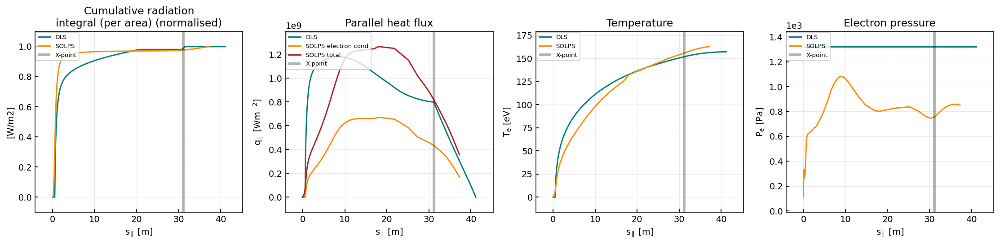

In [84]:
case = "100MW"
sepadd = 3
slc = store_slc[case]

d = eqb_alt[case]["iu"][sepadd]

# set switches
radios_default = {
    "upstreamGrid": True,  # SET TRUE if including domain above xpoint. if true, source of divertor heat flux comes from radial transport upstream, and Tu is at the midplane. If false, heat flux simply enters at the x point as qi, and Tu is located at the x point.
}

# set general run parameters
constants_default = {
    "gamma_sheath": 7,  # sheath transmittion coefficient for virtual target. Choice does not matter if Tt is low
    "Tt": 0.5,  # requested virtual target temp for calculating heat flux at detachment front. Aim for low (sub 1eV) Tt
    "qpllu0": 2.25e9 ,  # heat flux density at the x point
    "nu": 1e19,  # Upstream density (if constant)
    "nu0": 1e19,  # Upstream density (if constant)
    "cz0": 0.05,  # Impurity fraction (if constant)
    # "Lfunc": LfuncKallenbach("Ar"),  # impurity cooling function. More are available in AnalyticCoolingCurves.py
    "Lfunc" : slc.extract_cooling_curve("Ar", "inner_upper", sepadd = sepadd, plot = False)
}

#### Original average Cz and qpar
constants_default["cz0"] = 0.09
constants_default["qpllu0"] = 0.8e9 


SpolRange = np.linspace(0, d["Spol"][d["Xpoint"]], 10) # 
SparRange = [d["S"][np.argmin(np.abs(d["Spol"] - SpolRange[x]))] for x, _ in enumerate(SpolRange)]

try: 
        out = run_dls(
            constants = constants_default, 
            radios = radios_default, 
            d = d,
            SparRange = [0.5],
            control_variable = "density",
            verbosity = 0,
            Ctol = 1e-3,
            Ttol = 1e-3,
            dynamicGrid = True,
            dynamicGridRefinementRatio = 10,
            dynamicGridRefinementWidth = 2,
            dynamicGridDiagnosticPlot = False)
    
except KeyboardInterrupt:
    print("Stopped")
    sys.exit(0)
print(out["cvar"])


comp = compare_SOLPS_DLS(slc, out, region = "outer_upper", sepadd = sepadd)

comp.plot(["Cumrad", "qpar", "Te", "Pe"], normalise_radiation = True , radiation_per_area= True)


# fig, ax =plt.subplots()
# ax.plot(out["Sprofiles"][0], out["Rprofiles"][0], marker = "o", ms = 3, lw = 1)
# ax.set_xlim(0,20)

## 100MW innerAr, MPD, SOL ring 4/sepadd 3

Solving...0.50...Complete in 1.4 seconds
[1.9818962531152503e+19]
qmax = 1.59e+08


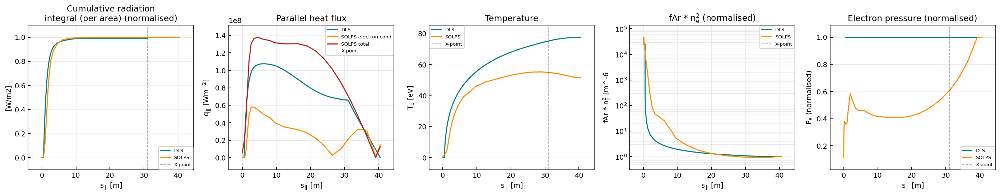

In [314]:
case = "100MW_innerar_midplanepuff"
sepadd = 3
slc = store_slc[case]
d = eqb_alt[case]["iu"][sepadd]

# set switches
radios_default = {
    "upstreamGrid": True,  # SET TRUE if including domain above xpoint. if true, source of divertor heat flux comes from radial transport upstream, and Tu is at the midplane. If false, heat flux simply enters at the x point as qi, and Tu is located at the x point.
}

# set general run parameters
constants_default = {
    "gamma_sheath": 7,  # sheath transmittion coefficient for virtual target. Choice does not matter if Tt is low
    "Tt": 0.5,  # requested virtual target temp for calculating heat flux at detachment front. Aim for low (sub 1eV) Tt
    "qpllu0": 2.25e9 ,  # heat flux density at the x point
    "nu": 1e19,  # Upstream density (if constant)
    "nu0": 1e19,  # Upstream density (if constant)
    "cz0": 0.05,  # Impurity fraction (if constant)
    # "Lfunc": LfuncKallenbach("Ar"),  # impurity cooling function. More are available in AnalyticCoolingCurves.py
    "Lfunc" : slc.extract_cooling_curve("Ar", "inner_upper", sepadd = sepadd, order = 10, plot = False)
}

#### Tune Cz / qpar
constants_default["cz0"] = 0.045
constants_default["qpllu0"] = 0.66e8

#### Adjust kappa0
# constants_default["kappa0"] = 1000
# constants_default["qpllu0"] = 1.30e9 

#### Adjust kappa0 for BxBt/Lc to emulate uber narrow front
# constants_default["kappa0"] = 500
# constants_default["qpllu0"] = 1.30e9 

SpolRange = np.linspace(0, d["Spol"][d["Xpoint"]], 10) # 
SparRange = [d["S"][np.argmin(np.abs(d["Spol"] - SpolRange[x]))] for x, _ in enumerate(SpolRange)]

try: 
        out = run_dls(
            constants = constants_default, 
            radios = radios_default, 
            d = d,
            SparRange = [0.5],
            control_variable = "density",
            verbosity = 0,
            Ctol = 1e-3,
            Ttol = 1e-3,
            dynamicGrid = True,
            dynamicGridRefinementRatio = 5,
            dynamicGridRefinementWidth = 2,
            dynamicGridDiagnosticPlot = False)
    
except KeyboardInterrupt:
    print("Stopped")
    sys.exit(0)
print(out["cvar"])


comp = compare_SOLPS_DLS(slc, out, region = "inner_upper", sepadd = sepadd)
qmax = abs(comp.solps["fhx_total"]).max() * 1.15
print(f"qmax = {qmax:.2e}")

comp.plot(["Cumrad", "qpar", "Te", "cz", "Pe"], normalise_radiation = True , radiation_per_area= True, legend_loc = "best", plot_cz = False)
# comp.plot(["Te", "Ne", "Pe"], normalise_radiation = True , radiation_per_area= True)

## 100MW innerAr, PFR, SOL ring 4/sepadd 3

In [319]:
store_slc.keys()

dict_keys(['50MW', '55MW', '60MW', '70MW', '80MW', '90MW', '100MW', '120MW', 'SPR45', '100MW_inner_arpuff', '100MW_innerar_midplanepuff', '100MW_inar_mp_Ar_2.0e21_D_1.0e24', '100MW_inar_mp_Ar_2.5e21_D_1.0e24', '100MW_inar_mp_Ar_5.0e21_D_1.0e24', '100MW_inar_mp_Ar_6.0e21_D_0.8e24', '100MW_inar_mp_Ar_7.0e21_D_0.8e24', '100MW_inar_mp_Ar_7.0e21_D_0.6e24'])

Solving...0.50...Complete in 1.4 seconds
[1.0320817924716575e+19]
qmax = 1.67e+08


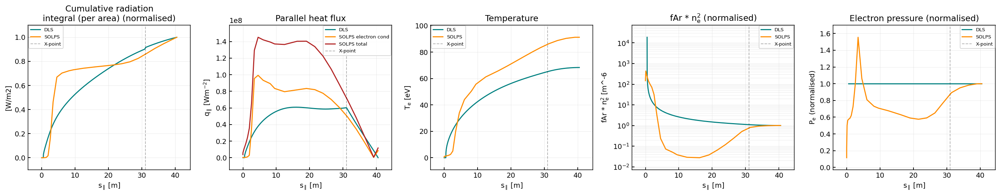

In [320]:
case = '100MW_inner_arpuff'
sepadd = 3
slc = store_slc[case]
d = eqb_alt[case]["iu"][sepadd]

# set switches
radios_default = {
    "upstreamGrid": True,  # SET TRUE if including domain above xpoint. if true, source of divertor heat flux comes from radial transport upstream, and Tu is at the midplane. If false, heat flux simply enters at the x point as qi, and Tu is located at the x point.
}

# set general run parameters
constants_default = {
    "gamma_sheath": 7,  # sheath transmittion coefficient for virtual target. Choice does not matter if Tt is low
    "Tt": 0.5,  # requested virtual target temp for calculating heat flux at detachment front. Aim for low (sub 1eV) Tt
    "qpllu0": 2.25e9 ,  # heat flux density at the x point
    "nu": 1e19,  # Upstream density (if constant)
    "nu0": 1e19,  # Upstream density (if constant)
    "cz0": 0.05,  # Impurity fraction (if constant)
    # "Lfunc": LfuncKallenbach("Ar"),  # impurity cooling function. More are available in AnalyticCoolingCurves.py
    "Lfunc" : slc.extract_cooling_curve("Ar", "inner_upper", sepadd = sepadd, order = 10, plot = False)
}

#### Tune Cz / qpar
constants_default["cz0"] = 0.045
constants_default["qpllu0"] = 0.66e8

#### Adjust kappa0
# constants_default["kappa0"] = 1000
# constants_default["qpllu0"] = 1.30e9 

#### Adjust kappa0 for BxBt/Lc to emulate uber narrow front
# constants_default["kappa0"] = 500
# constants_default["qpllu0"] = 1.30e9 

SpolRange = np.linspace(0, d["Spol"][d["Xpoint"]], 10) # 
SparRange = [d["S"][np.argmin(np.abs(d["Spol"] - SpolRange[x]))] for x, _ in enumerate(SpolRange)]

try: 
        out = run_dls(
            constants = constants_default, 
            radios = radios_default, 
            d = d,
            SparRange = [0.5],
            control_variable = "density",
            verbosity = 0,
            Ctol = 1e-3,
            Ttol = 1e-3,
            dynamicGrid = True,
            dynamicGridRefinementRatio = 5,
            dynamicGridRefinementWidth = 2,
            dynamicGridDiagnosticPlot = False)
    
except KeyboardInterrupt:
    print("Stopped")
    sys.exit(0)
print(out["cvar"])


comp = compare_SOLPS_DLS(slc, out, region = "inner_upper", sepadd = sepadd)
qmax = abs(comp.solps["fhx_total"]).max() * 1.15
print(f"qmax = {qmax:.2e}")

comp.plot(["Cumrad", "qpar", "Te", "cz", "Pe"], normalise_radiation = True , radiation_per_area= True, legend_loc = "best", plot_cz = False)
# comp.plot(["Te", "Ne", "Pe"], normalise_radiation = True , radiation_per_area= True)

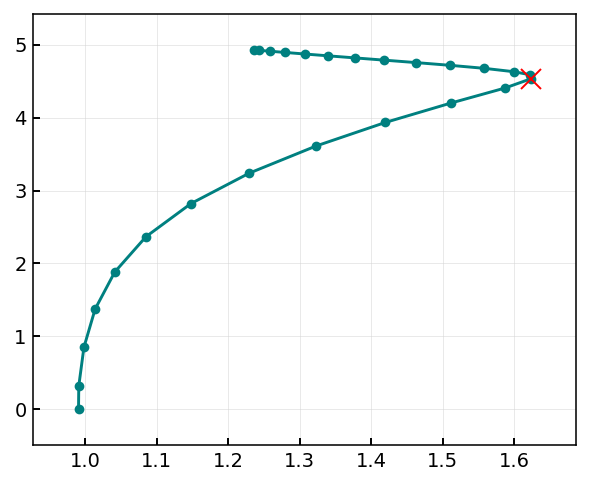

In [230]:

df = store_slc["60MW"].get_1d_poloidal_data(["R", "Z", "Btot", "Bpol", "Te", "Ne"], 
                                                      region = "inner_upper", sepadd = 5, target_first = True)

fig, ax = plt.subplots()
ax.plot(df["R"], df["Z"], marker = "o", ms = 4)
dfx = df[df["Xpoint"]==1]
ax.plot(dfx["R"], dfx["Z"], marker = "x", ms = 10, color = "red")

# fig, ax = plt.subplots()
# ax.plot(df["Spar"], df["Btot"], marker = "o")

## Back-calculate conduction

In [428]:
%matplotlib inline

Text(0.5, 1.0, 'Electron conductivity: SOL ring 4')

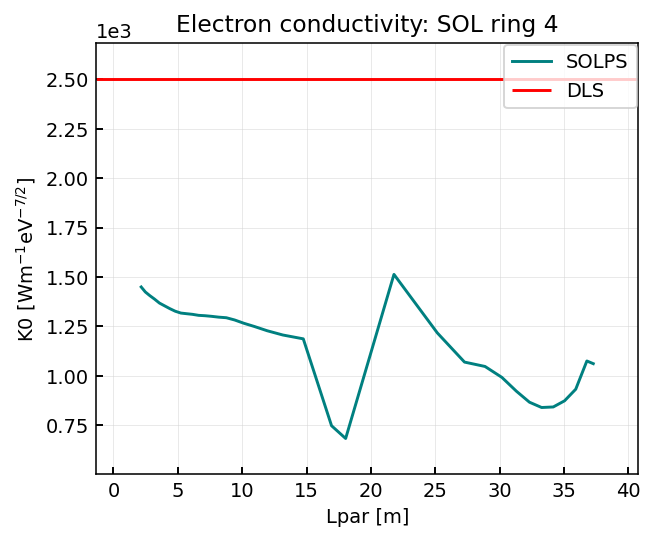

In [30]:
slc = store_slc["100MW"]
sepadd = 3

df = slc.get_1d_poloidal_data(["hx", "vol", "R", "Te", "RAr", "ne", "fhex_cond", "fhx_total"], 
                                  sepadd = sepadd, region = "outer_upper", target_first = True)

qpar = df["fhex_cond"] / df["apar"]
gradT = np.gradient(df["Te"], df["Spar"])
df["kappa0"] = qpar / (df["Te"]**(5/2) * gradT) * -1

fig, ax = plt.subplots()
# ax.plot(df["Spar"], gradT)
# ax2 = ax.twinx()
# ax2.plot(df["Spar"], df["Te"])

dfx = df[df["Xpoint"]==1]
dfsol = df[df["Spar"] > 2]
ax.plot(dfsol["Spar"], dfsol["kappa0"], label = "SOLPS")

slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(dfsol["Spar"], dfsol["kappa0"])
kappa_interp = df["Spar"] * slope + intercept

# ax2 = ax.twinx()
# ax2.plot(df["Spar"], df["Te"], color = "darkorange")
# ax.plot(df["Spar"], kappa_interp, label = f"{slope:.2f} $s_{{\parallel}}$  + {intercept:.2f}")

xlim = ax.get_xlim()
ax.hlines(2500, *xlim, color = "r", label = "DLS")
ax.set_xlim(xlim)
ax.legend()
ax.set_xlabel("Lpar [m]")
ax.set_ylabel("K0 [$W m^{-1} eV^{-7/2}]$")
ax.set_title(f"Electron conductivity: SOL ring {sepadd+1}")
# ax.set_xlim(0, xlim[1])
# ax.set_yscale("log")

C:\Users\mikek\AppData\Local\Temp\ipykernel_3892\77739923.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  dfsol = df[df["Spar"] > 20][df["Spar"] < 55]


Text(0.5, 1.0, 'Electron conductivity: 10th SOL ring')

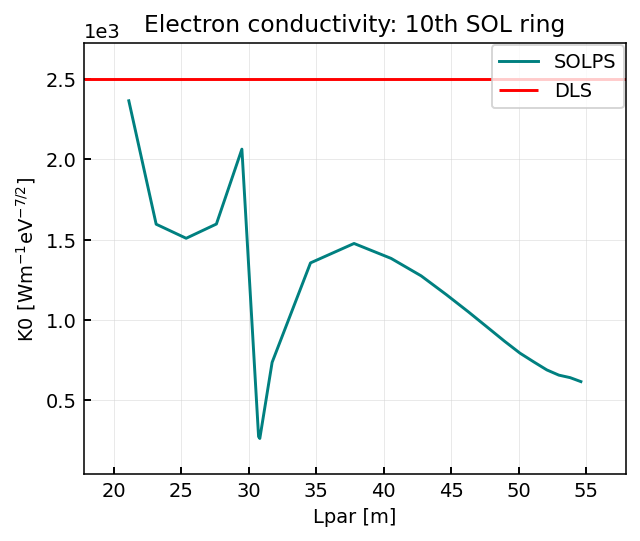

In [143]:
df = slc.get_1d_poloidal_data(["hx", "vol", "R", "Te", "RAr", "ne", "fhex_cond", "fhx_total"], 
                                  sepadd = 9, region = "outer_lower", target_first = True)

qpar = df["fhex_cond"] / df["apar"]
gradT = np.gradient(df["Te"], df["Spar"])
df["kappa0"] = qpar / (df["Te"]**(5/2) * gradT)

fig, ax = plt.subplots()
# ax.plot(df["Spar"], gradT)
# ax2 = ax.twinx()
# ax2.plot(df["Spar"], df["Te"])

dfx = df[df["Xpoint"]==1]
dfsol = df[df["Spar"] > 20][df["Spar"] < 55]
ax.plot(dfsol["Spar"], dfsol["kappa0"], label = "SOLPS")

xlim = ax.get_xlim()
ax.hlines(2500, *xlim, color = "r", label = "DLS")
ax.set_xlim(xlim)
ax.legend()
ax.set_xlabel("Lpar [m]")
ax.set_ylabel("K0 [$W m^{-1} eV^{-7/2}]$")
ax.set_title("Electron conductivity: 10th SOL ring")
# ax.set_xlim(0, xlim[1])
# ax.set_yscale("log")

## Further sepadd

Solving...18.00...Complete in 1.0 seconds
[1.45213746814609e+19]


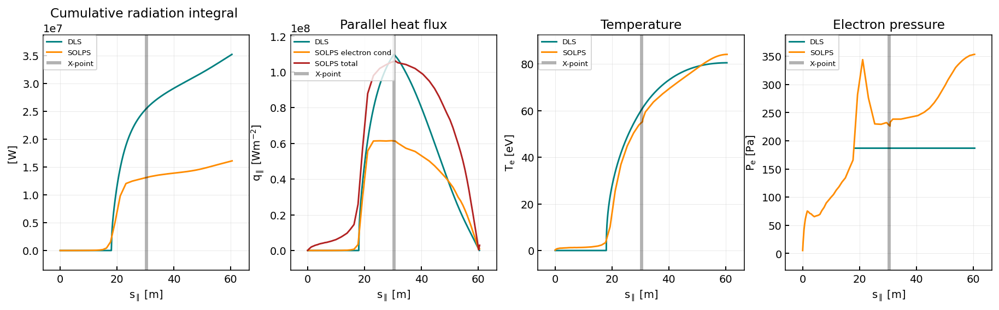

In [185]:
case = "SPR45"
sepadd = 9
slc = store_slc[case]

d = eqb[case]["ol"][sepadd]

# set switches
radios_default = {
    "upstreamGrid": True,  # SET TRUE if including domain above xpoint. if true, source of divertor heat flux comes from radial transport upstream, and Tu is at the midplane. If false, heat flux simply enters at the x point as qi, and Tu is located at the x point.
}

# set general run parameters
constants_default = {
    "gamma_sheath": 7,  # sheath transmittion coefficient for virtual target. Choice does not matter if Tt is low
    "Tt": 0.5,  # requested virtual target temp for calculating heat flux at detachment front. Aim for low (sub 1eV) Tt
    "qpllu0": 2.25e9 ,  # heat flux density at the x point
    "nu": 1e19,  # Upstream density (if constant)
    "nu0": 1e19,  # Upstream density (if constant)
    "cz0": 0.05,  # Impurity fraction (if constant)
    # "Lfunc": LfuncKallenbach("Ar"),  # impurity cooling function. More are available in AnalyticCoolingCurves.py
    "Lfunc": lambda x: LfuncSPR45(1, x),  # impurity cooling function. More are available in AnalyticCoolingCurves.py
}

# Original average Cz and qpar
# constants_default["cz0"] = 0.045
# constants_default["qpllu0"] = 3.325e9 

# Tune peak qpar
constants_default["cz0"] = 0.045
# constants_default["qpllu0"] = 0.115e9  # Total heat flux
# constants_default["qpllu0"] = 0.067e9  # Total heat flux


# Correct cooling curve, peak qpar
# constants_default["qpllu0"] = 0.15e9  # Total heat flux

# Correct cooling curve, lower kappa, peak qpar
constants_default["qpllu0"] = 0.15e9  # Total heat flux
constants_default["kappa0"] = 2000

SpolRange = np.linspace(0, d["Spol"][d["Xpoint"]], 10) # 
SparRange = [d["S"][np.argmin(np.abs(d["Spol"] - SpolRange[x]))] for x, _ in enumerate(SpolRange)]

try: 
        out = run_dls(
            constants = constants_default, 
            radios = radios_default, 
            d = d,
            SparRange = [18],
            control_variable = "density",
            verbosity = 0,
            Ctol = 1e-3,
            Ttol = 1e-3,
            dynamicGrid = True)
    
except KeyboardInterrupt:
    print("Stopped")
    sys.exit(0)
print(out["cvar"])

comp = compare_SOLPS_DLS(slc, out, region = "outer_lower", sepadd = sepadd)
comp.plot(["Cumrad", "qpar", "Te", "Pe"], normalise_radiation = False)



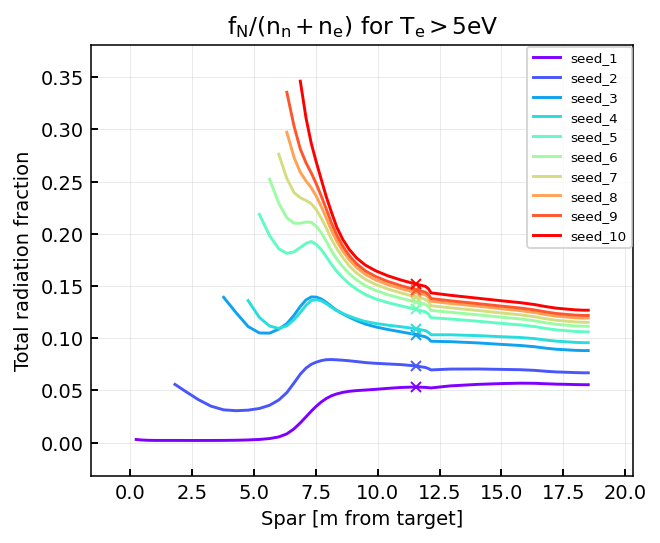

In [ ]:
num_cases = len(store_slc)
colors = [plt.get_cmap("rainbow")(i) for i in np.linspace(0, 1, num_cases)]

fig, ax = plt.subplots()
for i, case in enumerate(store_slc):
    slc = store_slc[case]
    df = slc.get_1d_poloidal_data(params = ["Ne", "Nn", "Te", "fN", "fNtot", "RN", "Btot"], sepadd = 4, region = "outer_lower", target_first = True)
    df = df[df["Te"]>5]
    
    dfx = df[df["Xpoint"]==1]
    
    ax.plot(df["Spar"], df["fN"], color = colors[i], label = case)
    ax.plot(dfx["Spar"], dfx["fN"], color = colors[i], marker = "x", ms = 5) 
    
ax.set_title("$f_N / (n_n+n_e)$ for $T_e>5eV$")
ax.set_xlabel("Spar [m from target]")
ax.set_ylabel("Total radiation fraction")
ax.legend(fontsize = "x-small")


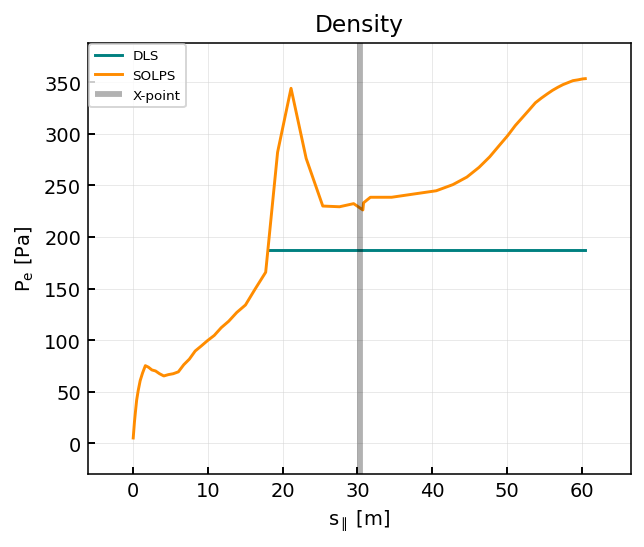

In [181]:
fig, ax = plt.subplots()
comp.plot_Pe(ax = ax)

Text(0, 0.5, 'R')

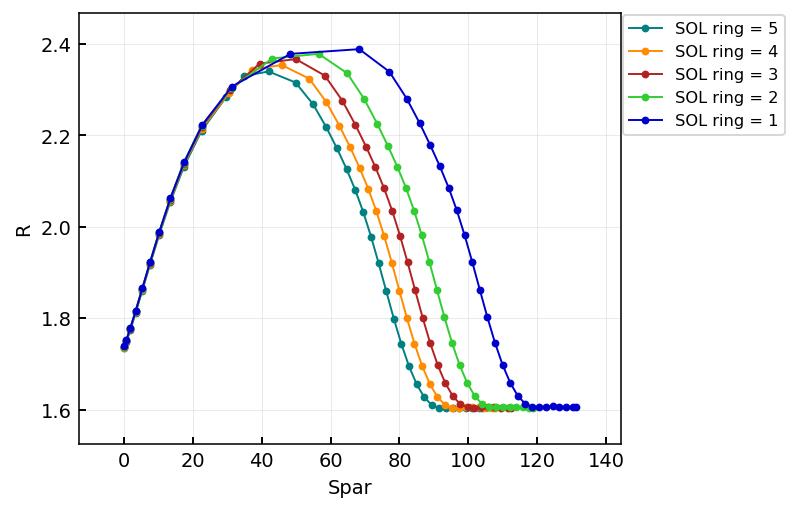

In [45]:
fig, ax = plt.subplots()

for i in range(5)[::-1]:
    df = store_slc["SPR45"].get_1d_poloidal_data(["RAr", "Te", "Btot", "R"], sepadd = i+1, region = "inner_lower", target_first = True)  
    ax.plot(df["Spar"], df["R"], marker = "o", lw = 1, ms = 3,  alpha = 1, label = f"SOL ring = {i+1}")
    
ax.legend(fontsize = "small", bbox_to_anchor = (1,1), loc = "upper left")
ax.set_xlabel("Spar")
ax.set_ylabel("R")

# Run DLS for SPR45 inner, sepadd = 4


Solving...10.00...Complete in 1.8 seconds
[2.585708329986037e+19]


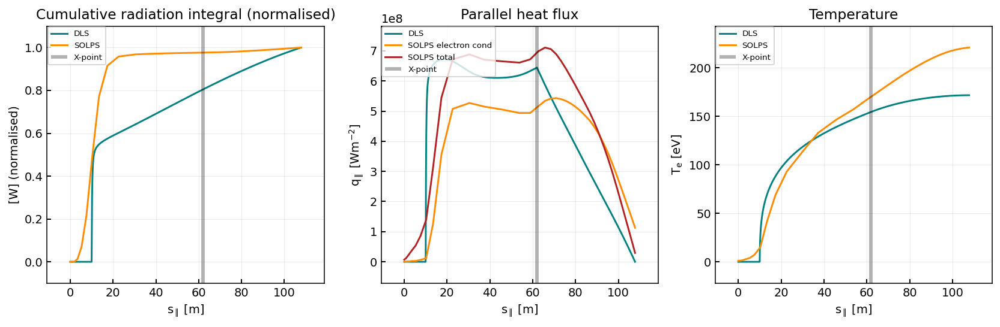

In [122]:
case = "SPR45"
sepadd = 4
slc = store_slc[case]

# d = eqb[case]["il"][sepadd]
d = eqb_alt[case]["il"][sepadd]

# set switches
radios_default = {
    "upstreamGrid": True,  # SET TRUE if including domain above xpoint. if true, source of divertor heat flux comes from radial transport upstream, and Tu is at the midplane. If false, heat flux simply enters at the x point as qi, and Tu is located at the x point.
}

# set general run parameters
constants_default = {
    "gamma_sheath": 7,  # sheath transmittion coefficient for virtual target. Choice does not matter if Tt is low
    "Tt": 0.5,  # requested virtual target temp for calculating heat flux at detachment front. Aim for low (sub 1eV) Tt
    "qpllu0": 2.25e9 ,  # heat flux density at the x point
    "nu": 1e19,  # Upstream density (if constant)
    "nu0": 1e19,  # Upstream density (if constant)
    "cz0": 0.05,  # Impurity fraction (if constant)
    "Lfunc": LfuncKallenbach("Ar"),  # impurity cooling function. More are available in AnalyticCoolingCurves.py
}

# Tune qpar
# constants_default["qpllu0"] = 2.6e9

# Tune qpar, cz
constants_default["qpllu0"] = 0.8e9
constants_default["cz0"] = 0.15

# Tune qpar to same Tu
# constants_default["cz0"] = 0.045
# constants_default["qpllu0"] = 3.325e9 * 1.6

# Correct average Cz and tune qpar to same radiation
# constants_default["cz0"] = 0.045
# constants_default["qpllu0"] = 4e8

# Tune qpar to same q as solps
# constants_default["cz0"] = 0.045
# constants_default["qpllu0"] = 3.325e9 * 0.1


SpolRange = np.linspace(0, d["Spol"][d["Xpoint"]], 10) # 
SparRange = [d["S"][np.argmin(np.abs(d["Spol"] - SpolRange[x]))] for x, _ in enumerate(SpolRange)]

try: 
        out = run_dls(
            constants = constants_default, 
            radios = radios_default, 
            d = d,
            SparRange = [10],
            control_variable = "density",
            verbosity = 0,
            Ctol = 1e-3,
            Ttol = 1e-3,
            dynamicGridRefinementRatio = 5,
            dynamicGridRefinementWidth = 2,
            dynamicGridResolution = 1000,
            dynamicGrid = True)
    
except KeyboardInterrupt:
    print("Stopped")
    sys.exit(0)
print(out["cvar"])

comp = compare_SOLPS_DLS(slc, out, region = "inner_lower", sepadd = sepadd)
# comp.plot(["Qrad", "Cumrad", "qpar", "Te", "Pe"], normalise_radiation = True)
comp.plot(["Cumrad", "qpar", "Te"], normalise_radiation = True)

# comp.plot(["Ne", "Te", "Pe"], normalise_radiation = True)


# fig, ax =plt.subplots()
# ax.plot(out["Sprofiles"][0], out["Rprofiles"][0], marker = "o", ms = 3, lw = 1)
# ax.set_xlim(27,32)


## Cooling curve impact, sepadd = 4

In [ ]:
scipy.integrate.solve_ivp?

Solving...10.00...Complete in 1.7 seconds
[1.8391024696942612e+19]


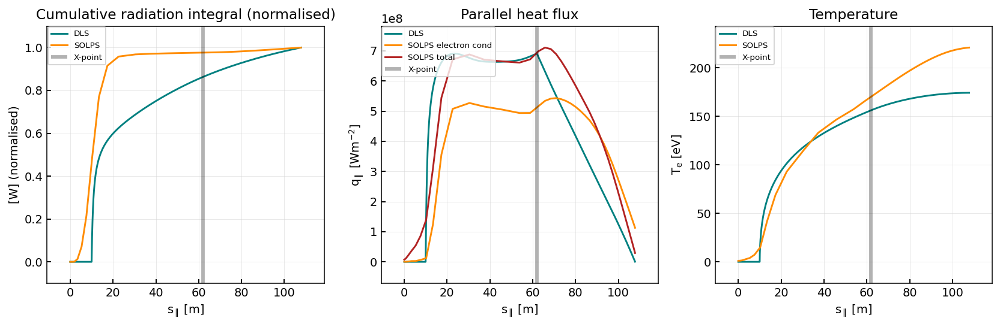

In [121]:
case = "SPR45"
sepadd = 4
slc = store_slc[case]

# d = eqb[case]["il"][sepadd]
d = eqb_alt[case]["il"][sepadd]

# set switches
radios_default = {
    "upstreamGrid": True,  # SET TRUE if including domain above xpoint. if true, source of divertor heat flux comes from radial transport upstream, and Tu is at the midplane. If false, heat flux simply enters at the x point as qi, and Tu is located at the x point.
}

# set general run parameters
constants_default = {
    "gamma_sheath": 7,  # sheath transmittion coefficient for virtual target. Choice does not matter if Tt is low
    "Tt": 0.5,  # requested virtual target temp for calculating heat flux at detachment front. Aim for low (sub 1eV) Tt
    "qpllu0": 2.25e9 ,  # heat flux density at the x point
    "nu": 1e19,  # Upstream density (if constant)
    "nu0": 1e19,  # Upstream density (if constant)
    "cz0": 0.05,  # Impurity fraction (if constant)
    "Lfunc": lambda x: LfuncSPR45(4, "inner", x),  # impurity cooling function. More are available in AnalyticCoolingCurves.py
}

# Tune qpar
# constants_default["qpllu0"] = 2.6e9

# Tune qpar, cz
constants_default["qpllu0"] = 0.8e9
constants_default["cz0"] = 0.15

# Tune qpar to same Tu
# constants_default["cz0"] = 0.045
# constants_default["qpllu0"] = 3.325e9 * 1.6

# Correct average Cz and tune qpar to same radiation
# constants_default["cz0"] = 0.045
# constants_default["qpllu0"] = 4e8

# Tune qpar to same q as solps
# constants_default["cz0"] = 0.045
# constants_default["qpllu0"] = 3.325e9 * 0.1


SpolRange = np.linspace(0, d["Spol"][d["Xpoint"]], 10) # 
SparRange = [d["S"][np.argmin(np.abs(d["Spol"] - SpolRange[x]))] for x, _ in enumerate(SpolRange)]

try: 
        out = run_dls(
            constants = constants_default, 
            radios = radios_default, 
            d = d,
            SparRange = [10],
            control_variable = "density",
            verbosity = 0,
            Ctol = 1e-3,
            Ttol = 1e-3,
            dynamicGridRefinementRatio = 5,
            dynamicGridRefinementWidth = 2,
            dynamicGridResolution = 1000,
            dynamicGrid = True)
    
except KeyboardInterrupt:
    print("Stopped")
    sys.exit(0)
print(out["cvar"])

comp = compare_SOLPS_DLS(slc, out, region = "inner_lower", sepadd = sepadd)
comp.plot(["Cumrad", "qpar", "Te"], normalise_radiation = True)

# comp.plot(["Ne", "Te", "Pe"], normalise_radiation = True)


# fig, ax =plt.subplots()
# ax.plot(out["Sprofiles"][0], out["Rprofiles"][0], marker = "o", ms = 3, lw = 1)
# ax.set_xlim(27,32)


## Higher sepadd

Solving...2.00...Complete in 1.4 seconds
[1.2372775930891235e+19]


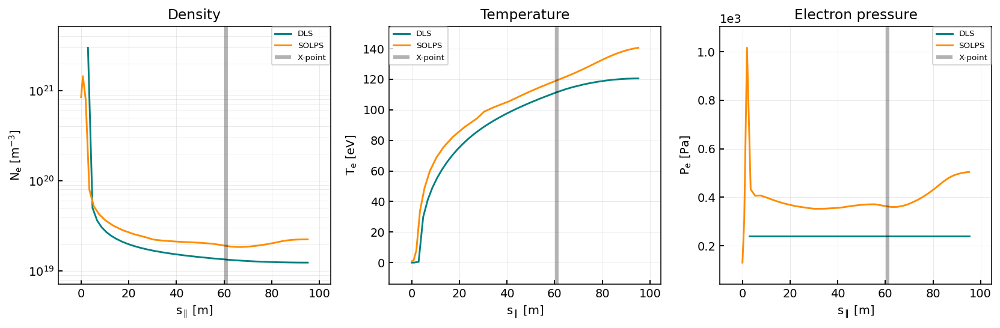

In [146]:
case = "SPR45"
sepadd = 8
slc = store_slc[case]

# d = eqb[case]["il"][sepadd]
d = eqb_alt[case]["il"][sepadd]

# set switches
radios_default = {
    "upstreamGrid": True,  # SET TRUE if including domain above xpoint. if true, source of divertor heat flux comes from radial transport upstream, and Tu is at the midplane. If false, heat flux simply enters at the x point as qi, and Tu is located at the x point.
}

# set general run parameters
constants_default = {
    "gamma_sheath": 7,  # sheath transmittion coefficient for virtual target. Choice does not matter if Tt is low
    "Tt": 0.5,  # requested virtual target temp for calculating heat flux at detachment front. Aim for low (sub 1eV) Tt
    "qpllu0": 2.25e9 ,  # heat flux density at the x point
    "nu": 1e19,  # Upstream density (if constant)
    "nu0": 1e19,  # Upstream density (if constant)
    "cz0": 0.05,  # Impurity fraction (if constant)
    "Lfunc": lambda x: LfuncSPR45(8, "inner", x),  # impurity cooling function. More are available in AnalyticCoolingCurves.py
}

# Tune qpar
constants_default["qpllu0"] = 0.2e9

# Tune qpar, cz
# constants_default["qpllu0"] = 2.6e9
# constants_default["cz0"] = 0.15

SpolRange = np.linspace(0, d["Spol"][d["Xpoint"]], 10) # 
SparRange = [d["S"][np.argmin(np.abs(d["Spol"] - SpolRange[x]))] for x, _ in enumerate(SpolRange)]

try: 
        out = run_dls(
            constants = constants_default, 
            radios = radios_default, 
            d = d,
            SparRange = [2],
            control_variable = "density",
            verbosity = 0,
            Ctol = 1e-3,
            Ttol = 1e-3,
            dynamicGridRefinementRatio = 5,
            dynamicGridRefinementWidth = 2,
            dynamicGridResolution = 1000,
            dynamicGrid = False)
    
except KeyboardInterrupt:
    print("Stopped")
    sys.exit(0)
print(out["cvar"])

comp = compare_SOLPS_DLS(slc, out, region = "inner_lower", sepadd = sepadd)
# comp.plot(["Cumrad", "qpar", "qpar_over_B", "Te"], normalise_radiation = True, legend_loc = "best")

comp.plot(["Ne", "Te", "Pe"], normalise_radiation = True, legend_loc = "best")

# fig, ax =plt.subplots()
# ax.plot(out["Sprofiles"][0], out["Rprofiles"][0], marker = "o", ms = 3, lw = 1)
# ax.set_xlim(27,32)


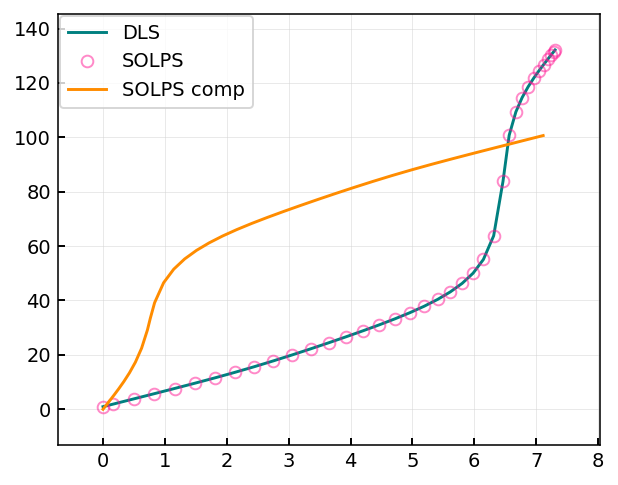

In [397]:
sepadd = 6

dls = pd.DataFrame()
dls["Spar"] = out["Sprofiles"][0]
dls["Spol"] = out["Spolprofiles"][0]
dls["Btot"] = out["Btotprofiles"][0]
Xpoint = out["Xpoints"][0]
dls.loc[Xpoint, "Xpoint"] = 1

solps = pd.DataFrame()
s = eqb_alt[case]["il"][sepadd]

solps["Spar"] = s["S"]
solps["Spol"] = s["Spol"]
solps["R"] = s["R"]
solps["Z"] = s["Z"]
solps["Btot"] = s["Btot"]
solps["Bpol"] = s["Bpol"]

solps_comp = slc.get_1d_poloidal_data(["Btot", "hx", "vol", "R", "Te", "RAr", "ne", "fhex_cond", "fhx_total"], 
                                  sepadd = sepadd, region = "inner_lower", target_first = True)


for param in ["Spar"]:
    fig, ax = plt.subplots()
    ax.plot(dls["Spol"], dls[param], label = "DLS")
    ax.plot(solps["Spol"], solps[param], label = "SOLPS", marker = "o", markerfacecolor = "None", alpha = 0.5, lw = 0, c = "deeppink")
    ax.plot(solps_comp["Spol"], solps_comp[param], label = "SOLPS comp")
    ax.legend()


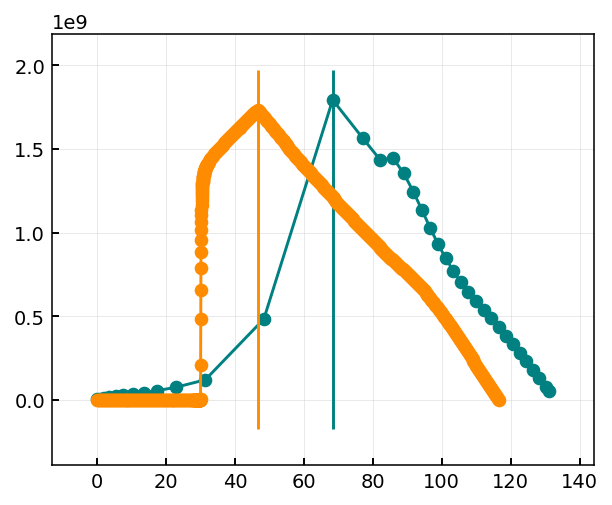

In [151]:
df = comp.solps
dls = comp.dls
dfx = df[df["Xpoint"]==1]
dlsx = dls[dls["Xpoint"]==1]

fig, ax = plt.subplots()

ax.plot(df["Spar"], df["fhx_total"]*-1, marker = "o")
ylim = ax.get_ylim()
ax.vlines(dfx["Spar"], *ylim)

ax.plot(dls["Spar"], dls["qpar"], marker = "o", c = "darkorange")
ax.vlines(dlsx[dlsx["Xpoint"]==1]["Spar"], *ylim, colors = "darkorange")

# ax.set_ylim(*ylim)

## Last sepadd

Solving...3.00...Complete in 0.7 seconds
[1.8634504463136117e+19]


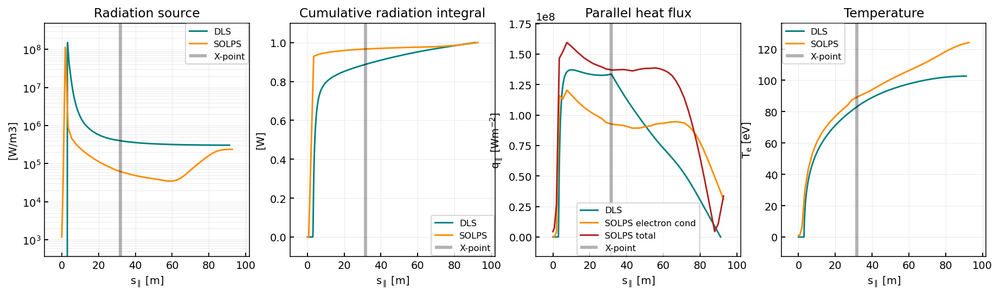

In [119]:
case = "SPR45"
sepadd = 9
slc = store_slc[case]

d = eqb[case]["il"][sepadd]

# set switches
radios_default = {
    "upstreamGrid": True,  # SET TRUE if including domain above xpoint. if true, source of divertor heat flux comes from radial transport upstream, and Tu is at the midplane. If false, heat flux simply enters at the x point as qi, and Tu is located at the x point.
}

# set general run parameters
constants_default = {
    "gamma_sheath": 7,  # sheath transmittion coefficient for virtual target. Choice does not matter if Tt is low
    "Tt": 0.5,  # requested virtual target temp for calculating heat flux at detachment front. Aim for low (sub 1eV) Tt
    "qpllu0": 2.25e9 ,  # heat flux density at the x point
    "nu": 1e19,  # Upstream density (if constant)
    "nu0": 1e19,  # Upstream density (if constant)
    "cz0": 0.05,  # Impurity fraction (if constant)
    "Lfunc": LfuncKallenbach("Ar"),  # impurity cooling function. More are available in AnalyticCoolingCurves.py
}

# Correct average Cz and qpar
constants_default["cz0"] = 0.045
constants_default["qpllu0"] = 0.15e9

# Tune qpar to same Tu
# constants_default["cz0"] = 0.045
# constants_default["qpllu0"] = 3.325e9 * 1.6

# Correct average Cz and tune qpar to same radiation
# constants_default["cz0"] = 0.045
# constants_default["qpllu0"] = 4e8

# Tune qpar to same q as solps
# constants_default["cz0"] = 0.045
# constants_default["qpllu0"] = 3.325e9 * 0.1


SpolRange = np.linspace(0, d["Spol"][d["Xpoint"]], 10) # 
SparRange = [d["S"][np.argmin(np.abs(d["Spol"] - SpolRange[x]))] for x, _ in enumerate(SpolRange)]

try: 
        out = run_dls(
            constants = constants_default, 
            radios = radios_default, 
            d = d,
            SparRange = [3],
            control_variable = "density",
            verbosity = 0,
            Ctol = 1e-3,
            Ttol = 1e-3,
            dynamicGrid = True)
    
except KeyboardInterrupt:
    print("Stopped")
    sys.exit(0)
print(out["cvar"])

comp = compare_SOLPS_DLS(slc, out, region = "inner_lower", sepadd = sepadd)
comp.plot(mode = "extended")


# Pressure and flow analysis

Text(0.5, 1.0, 'Ion/electron pressure breakdown')

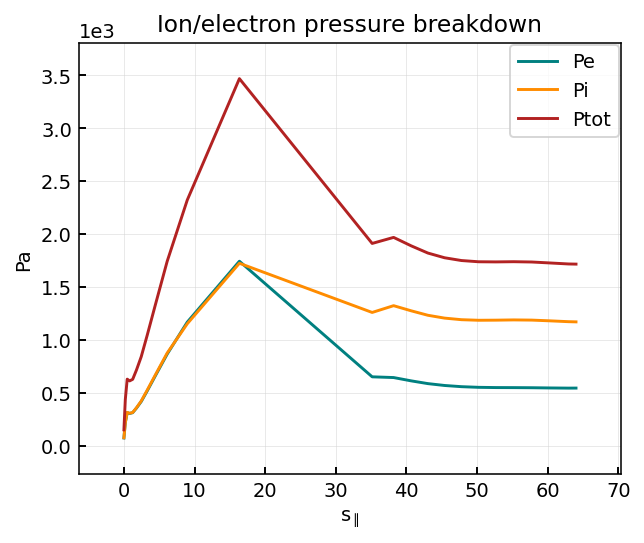

In [15]:
slc = store_slc["100MW"]

df = slc.get_1d_poloidal_data(["Btot", "hx", "vol", "R", 
                                               "Te", "Td+", "RAr", "ne", "fhex_cond", "fhx_total",
                                               ], 
                                  sepadd = 8, region = "inner_lower", target_first = True)

df["Pe"] = df["ne"] * df["Te"] * 1.602e-19
df["Pi"] = df["ne"] * df["Td+"] * 1.602e-19
df["Ptot"] = df["Pe"] + df["Pi"]
dfx = df[df["Xpoint"]==1]

fig, ax = plt.subplots()

ax.plot(df["Spar"], df["Pe"], label = "Pe")
ax.plot(df["Spar"], df["Pi"], label = "Pi")
ax.plot(df["Spar"], df["Ptot"], label = "Ptot")
ylim = ax.get_ylim()
# ax.vlines(dfx["Spar"], *ylim, ls = ":", color = "darkslategrey", label = "X-point")
ax.set_ylim(*ylim)
ax.legend()
ax.set_xlabel("$s_{\parallel}$")
ax.set_ylabel("Pa")
ax.set_title("Ion/electron pressure breakdown")

In [161]:
len(colors)

9

Text(0.5, 1.0, 'Mach number (solid), Ptot (dashed)')

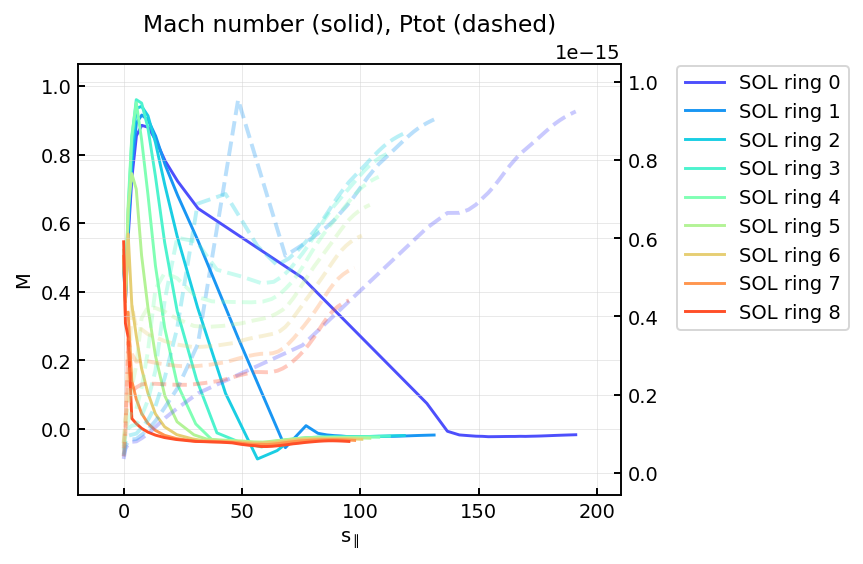

In [171]:
fig, ax = plt.subplots()
ax2 = ax.twinx()
for i in range(9):

    df = slc.get_1d_poloidal_data(["M", "Pe", "Pd+",
                                                ], 
                                    sepadd = i, region = "inner_lower", target_first = True)

    df["M"] *= -1
    df["Ptot"] = df["Pe"] + df["Pd+"]
    dfx = df[df["Xpoint"]==1]

    

    ax.plot(df["Spar"], df["M"], color = colors[i], label = f"SOL ring {i}")
    
    
    ax2.plot(df["Spar"], df["Ptot"], color = colors[i],  lw = 2, alpha = 0.3, ls = "--")
    
    
# ylim = ax.get_ylim()

# ax.set_ylim(*ylim)
ax.legend(loc="upper left", bbox_to_anchor=(1.1,1))
ax.set_xlabel("$s_{\parallel}$")
ax.set_ylabel("M")
ax.set_title("Mach number (solid), Ptot (dashed)")

Text(0.5, 1.0, '-1*$\\nabla_{\\parallel}M$ (solid), Ptot (dashed)')

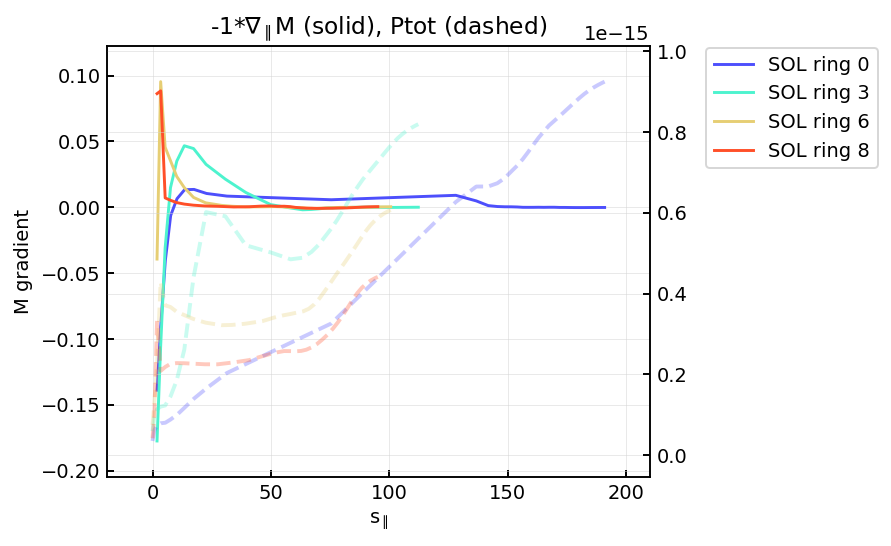

In [184]:
fig, ax = plt.subplots()
ax2 = ax.twinx()
for i in [0, 3, 6, 8]:

    df = slc.get_1d_poloidal_data(["M", "Pe", "Pd+",
                                                ], 
                                    sepadd = i, region = "inner_lower", target_first = True)

    df["M"] *= -1
    df["gradM"] = np.gradient(df["M"], df["Spar"]) * -1
    df["Ptot"] = df["Pe"] + df["Pd+"]
    dfx = df[df["Xpoint"]==1]

    
    skip = 2
    ax.plot(df["Spar"][skip:], df["gradM"][skip:], color = colors[i], label = f"SOL ring {i}")
    
    ax2.plot(df["Spar"], df["Ptot"], color = colors[i],  lw = 2, alpha = 0.3, ls = "--")
    
    
# ylim = ax.get_ylim()

# ax.set_ylim(*ylim)
ax.legend(loc="upper left", bbox_to_anchor=(1.1,1))
ax.set_xlabel("$s_{\parallel}$")
ax.set_ylabel("M gradient")
ax.set_title(r"-1*$\nabla_{\parallel}M$ (solid), Ptot (dashed)")

# Extract effective Lz curves

C:\Users\mikek\AppData\Local\Temp\ipykernel_3892\2001939534.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = mpl.cm.get_cmap('plasma', 5)


Text(0.5, 1.0, 'Cooling curves: SOLPS vs. DLS vs. ADAS')

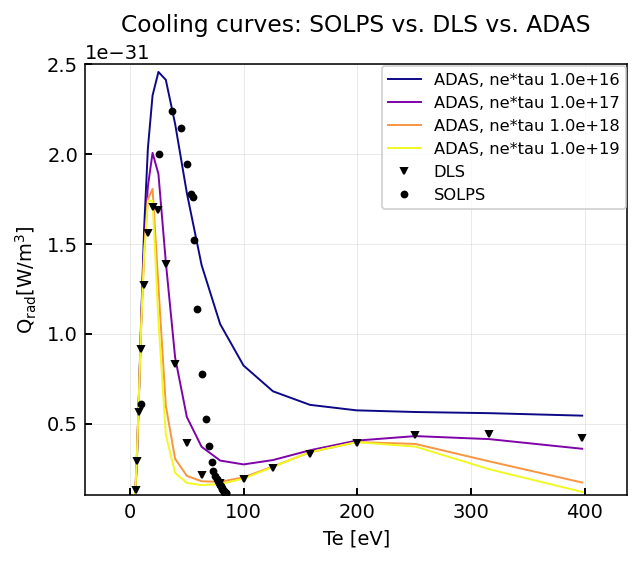

In [68]:
slc = store_slc["SPR45"]
rd2 = rd.sel(dim_electron_temp=slice(None, 500), dim_ne_tau=slice(1e16, None))

fig, ax = plt.subplots()

cmap = mpl.cm.get_cmap('plasma', 5)
colors = [cmap(x) for x in np.linspace(0,1, len(rd2["dim_ne_tau"]))]
ms = 3
marker = "X"



for i, neTau in enumerate(rd2["dim_ne_tau"]):
    data = rd2["equilibrium_Lz"].sel(dim_ne_tau = neTau, dim_electron_density=1e20, method="nearest")
    data.plot(ax = ax, label = f"ADAS, ne*tau {neTau:.1e}", color = colors[i], lw = 1)
    

radas_temp = rd2["dim_electron_temp"].values
ax.plot(radas_temp, [LfuncKallenbach("Ar")(T) for T in radas_temp], label = "DLS", c = "k", marker = "v", lw = 0, ms = ms)

solps = slc.get_1d_poloidal_data(["Te", "RAr", "fAr", "ne"], sepadd = 9)
solps["Rar"] = abs(solps["RAr"])
ax.plot(solps["Te"], solps["RAr"]/(solps["ne"]**2 * solps["fAr"]), c = "k", marker = "o", lw = 0, ms = ms, label = "SOLPS")

# ax.set_yscale("log")
# ax.set_xscale("log")

ax.set_xlabel("Te [eV]")
ax.set_ylabel(f"$Q_{{rad}} [W/m^3]$")
ax.set_ylim(1e-32, 2.5e-31)
ax.legend(loc = "upper right", fontsize = "small")
ax.set_title("Cooling curves: SOLPS vs. DLS vs. ADAS")

In [292]:
store_slc.keys()

dict_keys(['50MW', '55MW', '60MW', '70MW', '80MW', '90MW', '100MW', '120MW', 'SPR45', '100MW_inner_arpuff', '100MW_innerar_midplanepuff', '100MW_inar_mp_Ar_2.0e21_D_1.0e24', '100MW_inar_mp_Ar_2.5e21_D_1.0e24', '100MW_inar_mp_Ar_5.0e21_D_1.0e24', '100MW_inar_mp_Ar_6.0e21_D_0.8e24', '100MW_inar_mp_Ar_7.0e21_D_0.8e24', '100MW_inar_mp_Ar_7.0e21_D_0.6e24'])

C:\Users\mikek\AppData\Local\Temp\ipykernel_43324\117210946.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = mpl.cm.get_cmap('plasma', 5)
C:\Users\mikek\AppData\Local\Temp\ipykernel_43324\117210946.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap("rainbow", num_sepadds)(x) for x in range(num_sepadds)]


Text(0.5, 1.0, 'Cooling curve reconstruction')

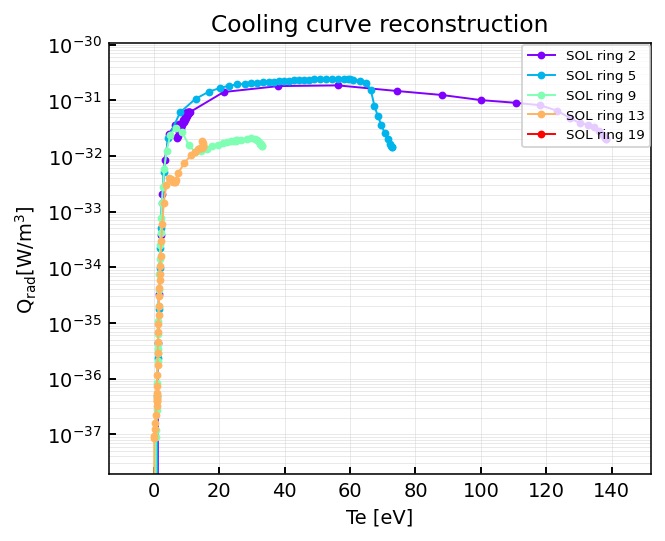

In [312]:
slc = store_slc["100MW_inner_arpuff"]
# slc = store_slc['100MW_innerar_midplanepuff']

fig, ax = plt.subplots()

cmap = mpl.cm.get_cmap('plasma', 5)
ms = 3
marker = "X"

sepadds = [1, 4, 8, 12, 18]
num_sepadds = len(sepadds)
colors = [plt.cm.get_cmap("rainbow", num_sepadds)(x) for x in range(num_sepadds)]

for idx, sepadd in enumerate(sepadds):

    solps = slc.get_1d_poloidal_data(["Te", "RAr", "fAr", "ne"], sepadd = sepadd, region = "outer_upper")
    solps["Rar"] = abs(solps["RAr"])
    ax.plot(solps["Te"], solps["RAr"]/(solps["ne"]**2 * solps["fAr"]),  color = colors[idx], lw = 1, ms = 3, marker = "o",label = f"SOL ring {sepadd+1}")
    

# ax.set_yscale("log")
# ax.set_xscale("log")

ax.set_xlabel("Te [eV]")
ax.set_ylabel(f"$Q_{{rad}} [W/m^3]$")
# ax.set_ylim(1e-32, 3e-31)
ax.set_yscale("log")
ax.legend(loc = "upper right", fontsize = "x-small")
ax.set_title("Cooling curve reconstruction")

# Debug selections

In [151]:
%matplotlib widget

In [146]:
slc.s["outer_upper_target"]

KeyError: 'outer_upper_target'

## Inner SOL

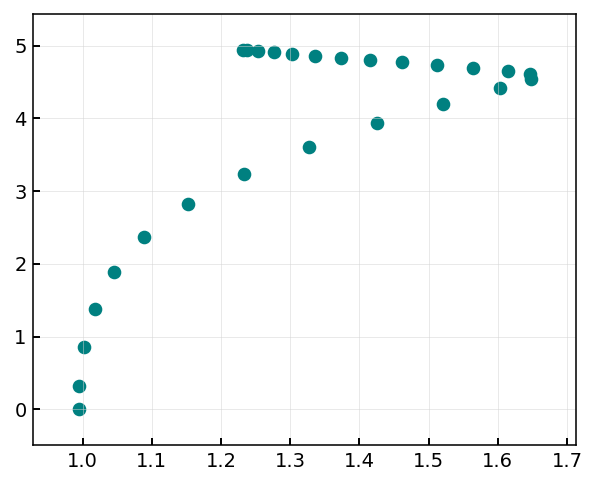

In [84]:
df = slc.get_1d_poloidal_data(["R", "Z", "Btot", "Bpol"], region = "inner_upper", sepadd = 3, target_first = True)

fig, ax = plt.subplots()

ax.scatter(df["R"], df["Z"])

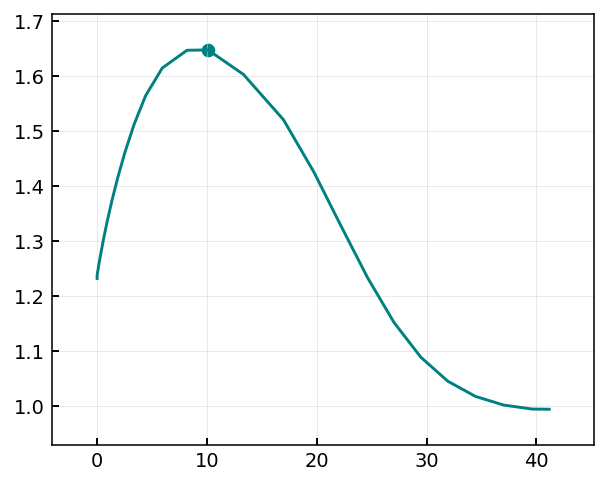

In [88]:
dfx = df[df["Xpoint"] == 1]
plt.plot(df["Spar"], df["R"])
plt.scatter(dfx["Spar"], dfx["R"])

In [86]:
df

,R,Z,Spol,Btot,Bpol,Spar,apar,Xpoint
25,1.231833,4.940152,0.000000,4.912717,-0.640497,0.000000,0.002874,0
24,1.238239,4.934988,0.000169,4.886322,-0.629110,0.001295,0.002889,0
23,1.254059,4.922513,0.016705,4.822146,-0.601736,0.129735,0.002928,0
22,1.275857,4.905575,0.040868,4.736260,-0.565312,0.323364,0.002981,0
21,1.303285,4.884560,0.071563,4.632476,-0.521323,0.580533,0.003048,0
20,1.336075,4.860008,0.109655,4.514659,-0.471510,0.919023,0.003127,0
19,1.373782,4.832281,0.154734,4.386402,-0.417411,1.350643,0.003219,0
18,1.415973,4.801724,0.205704,4.251372,-0.360066,1.886267,0.003321,0
17,1.462246,4.768550,0.261591,4.112579,-0.300386,2.546142,0.003433,0
16,1.512173,4.732709,0.321465,3.972601,-0.238833,3.365869,0.003554,0


In [81]:
df

,R,Z,Spol,Btot,Bpol,Spar,apar,Xpoint
0,0.993991,0.000000,0.000000,6.170248,-1.278839,0.000000,0.002288,0
1,0.994356,0.318995,0.321416,6.167926,-1.278102,1.551106,0.002289,0
2,1.001625,0.851793,0.856262,6.121566,-1.261407,4.146695,0.002306,0
3,1.017324,1.375152,1.378234,6.024022,-1.227025,6.709294,0.002344,0
4,1.044826,1.882563,1.880119,5.860302,-1.170689,9.221657,0.002409,0
5,1.088615,2.367119,2.357662,5.616410,-1.085278,11.692984,0.002514,0
6,1.151738,2.821463,2.804671,5.297499,-0.971335,14.130893,0.002665,0
7,1.233520,3.238243,3.214615,4.932551,-0.836128,16.549269,0.002862,0
8,1.327676,3.611077,3.581498,4.568165,-0.692588,18.969154,0.003091,0
9,1.425734,3.934464,3.898842,4.238404,-0.544516,21.439296,0.003331,0


## Target

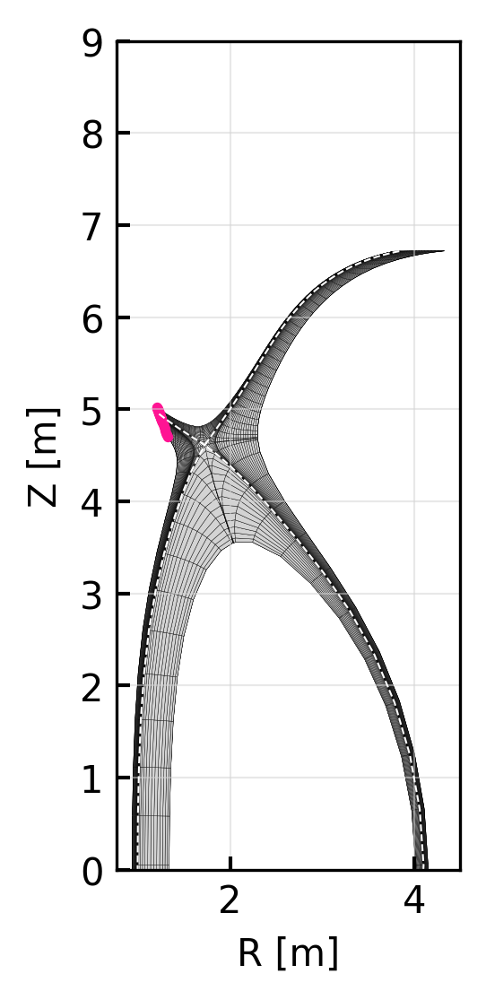

In [78]:
plt.close("all")

slc = store_slc["60MW"]

df = slc.get_1d_poloidal_data(["R", "Z", "Btot", "Bpol", "Te", "Ne"], 
                                                      region = "inner_upper", sepadd = 5)

fig, ax = plt.subplots(dpi = 300)
g = slc.g
slc.plot_selection((slc.g["upper_break"]-2, slice(None,None)),
                   dpi = 300, 
                   ax = ax,
                #    xlim = (1, 2.5),
                #    ylim = (-5,-4),
                #    ylim = (4, 5),
                    ylim = (0, 9),
                   linewidth = 0.1)

# ax.scatter(df["R"], df["Z"], c = "blue", s = 3)

# Case analysis

## Impurity fraction

C:\Users\mikek\AppData\Local\Temp\ipykernel_31828\3448883156.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap("rainbow", num_rings)(x) for x in range(num_rings)]
C:\Users\mikek\AppData\Local\Temp\ipykernel_31828\3448883156.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap("rainbow", num_rings)(x) for x in range(num_rings)]


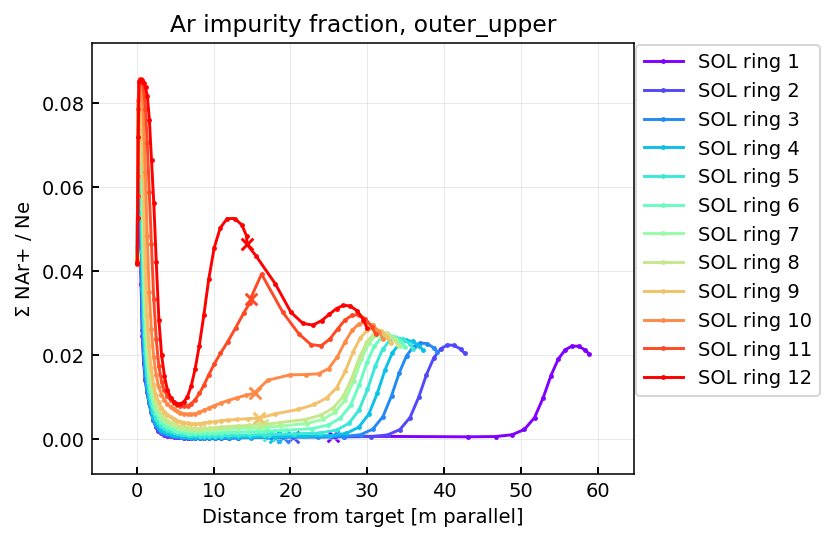

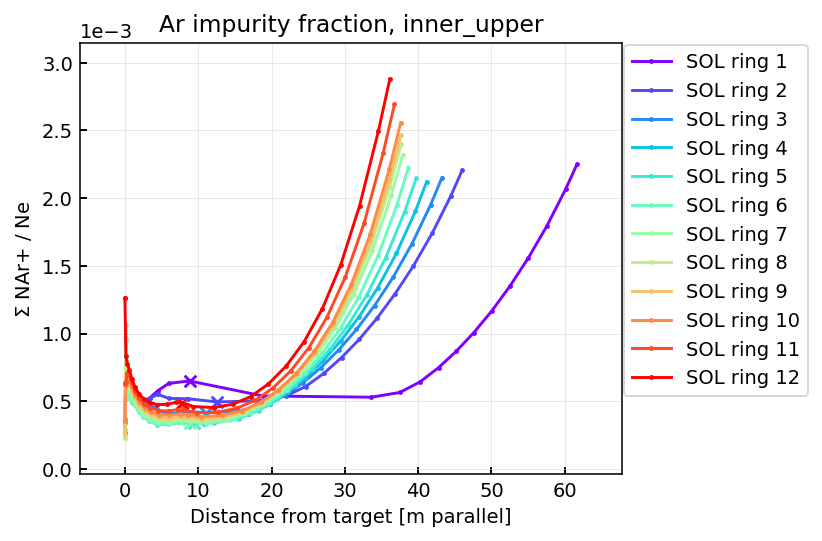

In [97]:
case = "90MW"


for region in ["outer_upper", "inner_upper"]:

    fig, ax = plt.subplots()
    # for case in store_slc:
    num_rings = 12
    colors = [plt.cm.get_cmap("rainbow", num_rings)(x) for x in range(num_rings)]

    for i in range(num_rings):
        slc = store_slc[case]
        solps = slc.get_1d_poloidal_data(["fArtot"], sepadd = i, region = region, target_first = True)
        ax.plot(solps["Spar"], solps["fArtot"], label = f"SOL ring {i+1}", color = colors[i], marker = "o", ms = 1.5)
        dfx = solps[solps["Xpoint"]==1]
        ax.scatter(dfx["Spar"], dfx["fArtot"], marker = "x", color = colors[i])
        
    ax.set_xlabel("Distance from target [m parallel]")
    ax.set_ylabel("$\Sigma$ NAr+ / Ne")
    # ax.set_yscale("log")
    ax.set_title(f"Ar impurity fraction, {region}")
    ax.legend(loc = "upper left", bbox_to_anchor = (1,1))



## Density

In [279]:
store_slc.keys()

dict_keys(['50MW', '55MW', '60MW', '70MW', '80MW', '90MW', '100MW', '120MW', 'SPR45', '100MW_inner_arpuff', '100MW_innerar_midplanepuff', '100MW_inar_mp_Ar_2.0e21_D_1.0e24', '100MW_inar_mp_Ar_2.5e21_D_1.0e24', '100MW_inar_mp_Ar_5.0e21_D_1.0e24', '100MW_inar_mp_Ar_6.0e21_D_0.8e24', '100MW_inar_mp_Ar_7.0e21_D_0.8e24', '100MW_inar_mp_Ar_7.0e21_D_0.6e24'])

C:\Users\mikek\AppData\Local\Temp\ipykernel_43324\1253755635.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap("rainbow", num_rings)(x) for x in range(num_rings)]


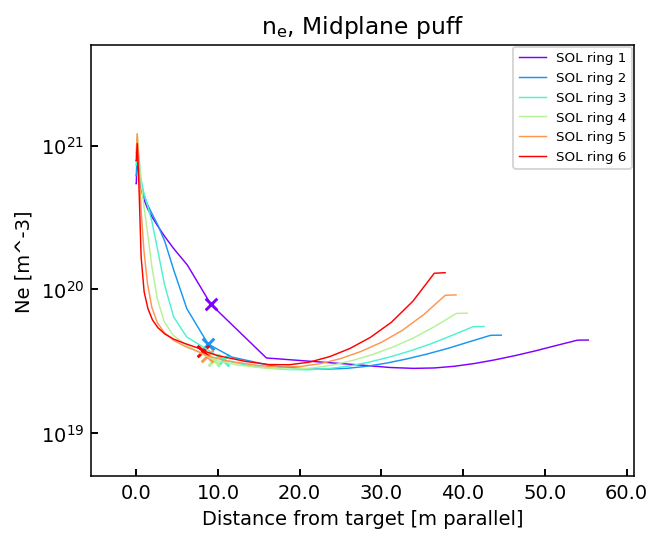

In [366]:

region = "inner_upper"
# case = "100MW_inner_arpuff"
case = '100MW_innerar_midplanepuff'

fig, ax = plt.subplots()
# for case in store_slc:
num_rings = 6
colors = [plt.cm.get_cmap("rainbow", num_rings)(x) for x in range(num_rings)]

for i in range(num_rings):
    slc = store_slc[case]
    solps = slc.get_1d_poloidal_data(["Pe", "Pd+", "Ne"], sepadd = i, region = region, target_first = True)
    
    ax.plot(solps["Spar"], solps["Ne"], label = f"SOL ring {i+1}", marker = "o", ms = 0, lw = 0.75, color = colors[i])
    dfx = solps[solps["Xpoint"]==1]
    ax.scatter(dfx["Spar"], dfx["Ne"], marker = "x", color = colors[i])
    
ax.set_xlabel("Distance from target [m parallel]")
ax.set_ylabel("Ne [m^-3]")
ax.set_yscale("log")
# ax.set_xscale("log")
ax.set_title(f"$n_e$, {labels[case] if case in labels else case}")
ax.legend(fontsize = "x-small")
ax.grid(which = "both", visible = False)
ax.set_ylim(5e18, 5e21)
ax.xaxis.set_major_formatter(mpl.ticker.FormatStrFormatter('%.1f'))

## Pressure

C:\Users\mikek\AppData\Local\Temp\ipykernel_40024\1858485862.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap("rainbow", num_rings)(x) for x in range(num_rings)]
C:\Users\mikek\AppData\Local\Temp\ipykernel_40024\1858485862.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap("rainbow", num_rings)(x) for x in range(num_rings)]
C:\Users\mikek\AppData\Local\Temp\ipykernel_40024\1858485862.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj

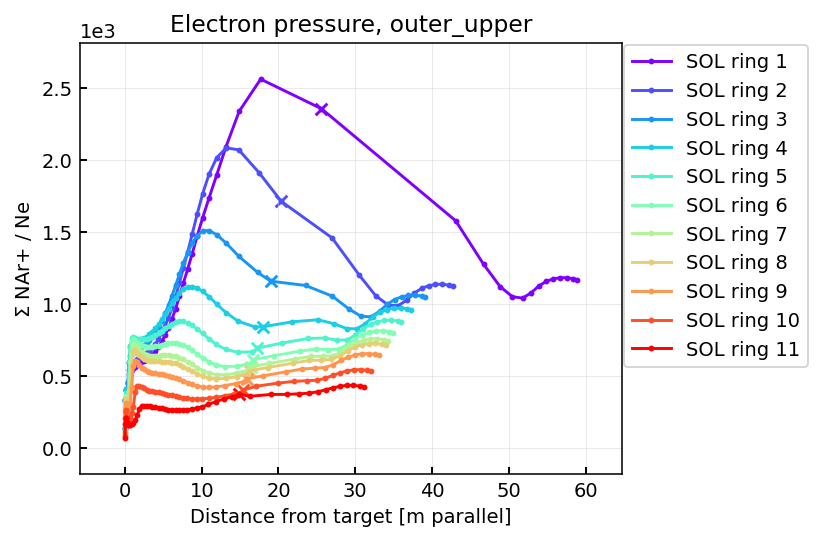

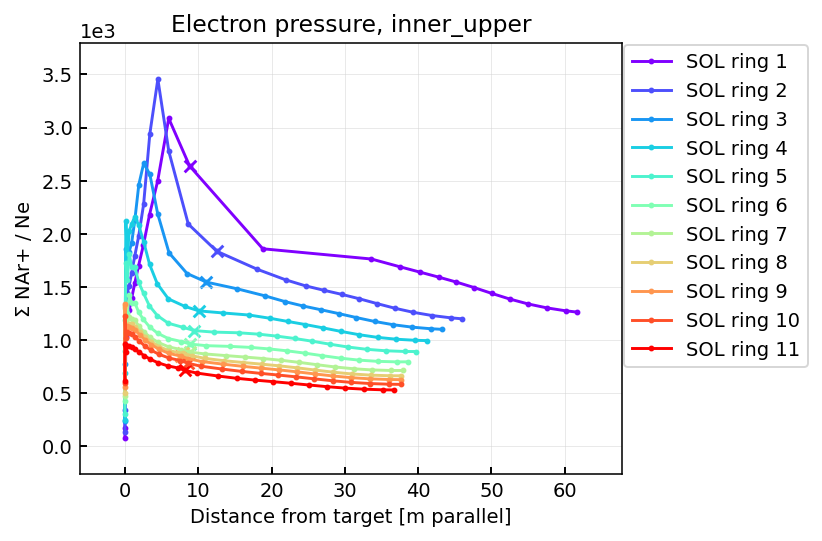

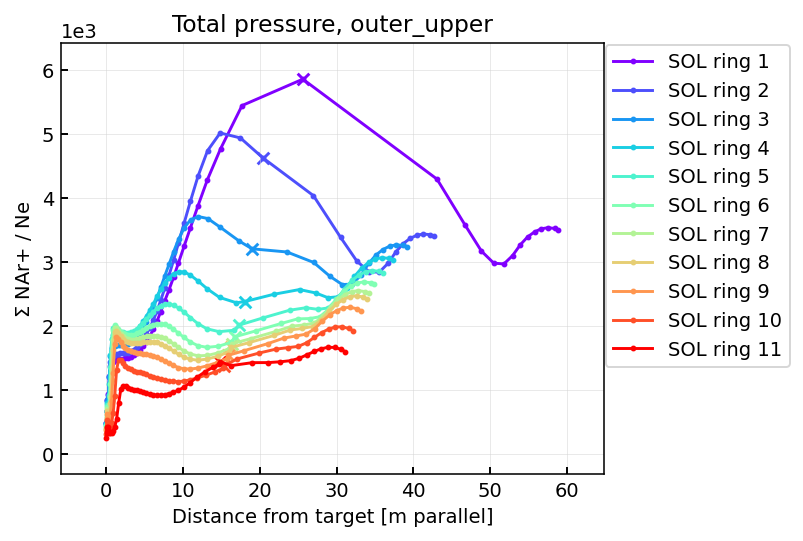

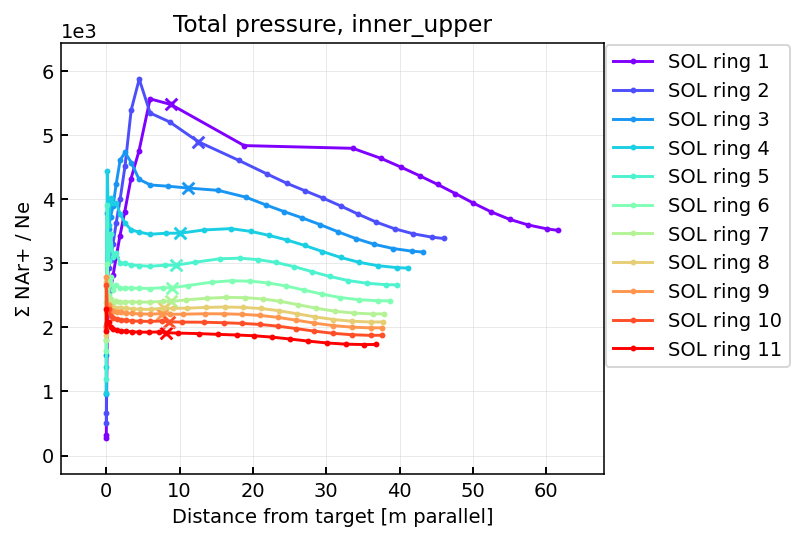

In [132]:
for region in ["outer_upper", "inner_upper"]:

    fig, ax = plt.subplots()
    # for case in store_slc:
    num_rings = 11
    colors = [plt.cm.get_cmap("rainbow", num_rings)(x) for x in range(num_rings)]

    for i in range(num_rings):
        slc = store_slc[case]
        solps = slc.get_1d_poloidal_data(["Pe", "Pd+"], sepadd = i, region = region, target_first = True)
        solps["Ptot"] = solps["Pe"] + solps["Pd+"]
        
        ax.plot(solps["Spar"], solps["Pe"], label = f"SOL ring {i+1}", marker = "o", ms = 2, color = colors[i])
        dfx = solps[solps["Xpoint"]==1]
        ax.scatter(dfx["Spar"], dfx["Pe"], marker = "x", color = colors[i])
        
    ax.set_xlabel("Distance from target [m parallel]")
    ax.set_ylabel("$\Sigma$ NAr+ / Ne")
    # ax.set_yscale("log")
    ax.set_title(f"Electron pressure, {region}")
    ax.legend(loc = "upper left", bbox_to_anchor = (1,1))

for region in ["outer_upper", "inner_upper"]:

    fig, ax = plt.subplots()
    # for case in store_slc:
    num_rings = 11
    colors = [plt.cm.get_cmap("rainbow", num_rings)(x) for x in range(num_rings)]

    for i in range(num_rings):
        slc = store_slc[case]
        solps = slc.get_1d_poloidal_data(["Pe", "Pd+"], sepadd = i, region = region, target_first = True)
        solps["Ptot"] = solps["Pe"] + solps["Pd+"]
        
        ax.plot(solps["Spar"], solps["Ptot"], label = f"SOL ring {i+1}", marker = "o", ms = 2, color = colors[i])
        dfx = solps[solps["Xpoint"]==1]
        ax.scatter(dfx["Spar"], dfx["Ptot"], marker = "x", color = colors[i])
        
    ax.set_xlabel("Distance from target [m parallel]")
    ax.set_ylabel("$\Sigma$ NAr+ / Ne")
    # ax.set_yscale("log")
    ax.set_title(f"Total pressure, {region}")
    ax.legend(loc = "upper left", bbox_to_anchor = (1,1))



## Degree of detachment for inner/outer

Text(0.5, 0.98, 'Electron temperature [eV]')

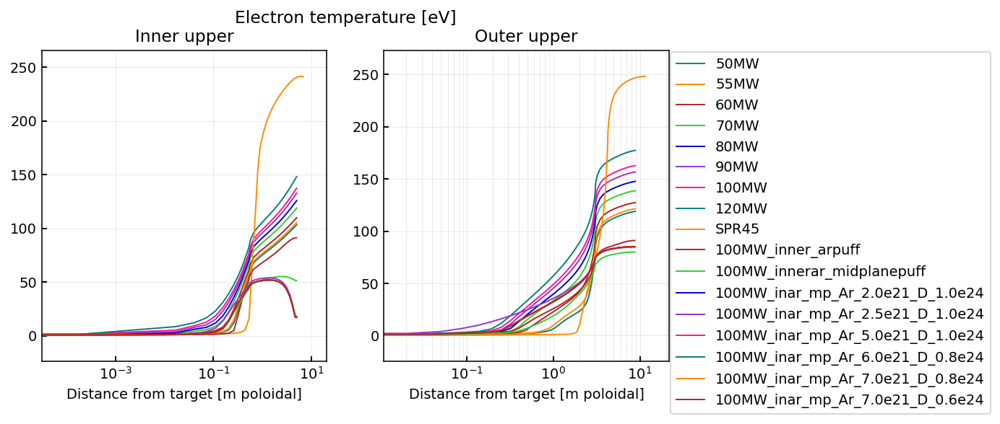

In [15]:
fig, axes = plt.subplots(1,2, figsize = (8,4))

for case in store_slc:
    slc = store_slc[case]
    
    # Inner
    df = store_slc[case].get_1d_poloidal_data(["R", "Z", "Btot", "Bpol", "Te", "Ne", "RAr"], 
                                                      region = "inner_upper", sepadd = 3, target_first = True)
    axes[0].plot(df["Spol"], df["Te"], label = case, lw = 1.0)
    
    # Outer
    df = store_slc[case].get_1d_poloidal_data(["R", "Z", "Btot", "Bpol", "Te", "Ne", "RAr"], 
                                                      region = "outer_upper", sepadd = 3, target_first = True)
    axes[1].plot(df["Spol"], df["Te"], label = case, lw = 1.0)
    
axes[0].set_title("Inner upper")
axes[1].set_title("Outer upper")
for ax in axes:
    ax.set_xlabel("Distance from target [m poloidal]")
    ax.set_xscale("log")

axes[1].legend(loc = "upper left", bbox_to_anchor = (1,1))
    
fig.suptitle("Electron temperature [eV]")
# ax.set_yscale("log")

## Front location for each SOL ring

C:\Users\mikek\AppData\Local\Temp\ipykernel_43324\3369735277.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap("rainbow", len(store_slc))(x) for x in range(len(store_slc))]


50MW
55MW
60MW
70MW
80MW
90MW
100MW
120MW
SPR45
100MW_inner_arpuff
100MW_innerar_midplanepuff
100MW_inar_mp_Ar_2.0e21_D_1.0e24
Failed for 100MW_inar_mp_Ar_2.0e21_D_1.0e24
100MW_inar_mp_Ar_2.5e21_D_1.0e24
Failed for 100MW_inar_mp_Ar_2.5e21_D_1.0e24
100MW_inar_mp_Ar_5.0e21_D_1.0e24
100MW_inar_mp_Ar_6.0e21_D_0.8e24
100MW_inar_mp_Ar_7.0e21_D_0.8e24
100MW_inar_mp_Ar_7.0e21_D_0.6e24


Text(0.5, 1.0, 'Front location across SOL rings')

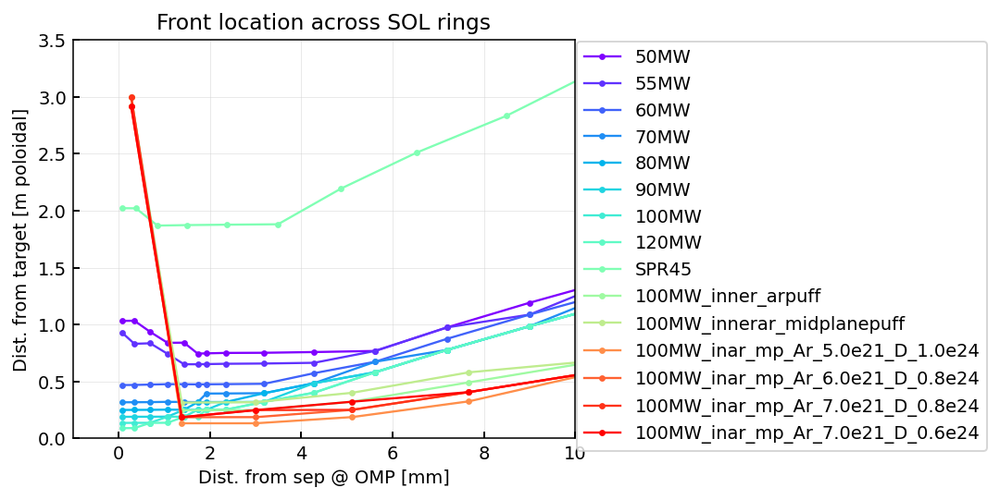

In [31]:
fig, ax = plt.subplots()
style = dict(marker = "o", ms = 2.5, lw = 1.2)

colors = [plt.cm.get_cmap("rainbow", len(store_slc))(x) for x in range(len(store_slc))]


for case_idx, case in enumerate(store_slc):
    print(case)
    slc = store_slc[case]
    distances = dict(hfmax = [], te = [])
    radial = slc.get_1d_radial_data([], region = "omp")
    radialsol = radial[radial["dist"]>0].iloc[:-5]
    
    # for i in range(27):

    dfs = []
    for i in range(len(radialsol)):

        df = slc.get_1d_poloidal_data(["fhe_cond", "Te"], region = "outer_upper", sepadd = i, target_first = True)
        df["hf_cond"] = abs(df["fhe_cond"] / df["apar"])
        dfs.append(df)

        dfreverse = df.iloc[::-1]
        hfmax = df["hf_cond"].max()
        spar_hfmax = df["Spar"][df["hf_cond"].idxmax()]
        dfreverse = dfreverse[dfreverse["Spar"] < spar_hfmax]  # Discard cold upstream to not confuse algorithm
        target = hfmax * 0.01  # 1% of maximum electron cond hflux

        # Find first point where hf_cond is below target starting from upstream
        for idx in dfreverse.index:
            if dfreverse.loc[idx, "hf_cond"] < target:
                distances["hfmax"].append(dfreverse.loc[idx, "Spol"])
                break
            
        for idx in dfreverse.index:
            if dfreverse.loc[idx, "Te"] < 5:
                distances["te"].append(dfreverse.loc[idx, "Spol"])
                break
                
    
    
    # ax.plot(radialsol["dist"]*1000, distances["hfmax"], label = f"{case}", color = colors[case_idx], **style)
    try:
        ax.plot(radialsol["dist"]*1000, distances["te"],c = colors[case_idx], label = f"{case}",  **style)
    except:
        print(f"Failed for {case}")
    # ax.plot(radialsol["dist"]*1000, distances["te"], label = r"$Te < 5eV$", **style)

ax.set_xlabel("Dist. from sep @ OMP [mm]")
ax.set_ylabel("Dist. from target [m poloidal]")
ax.set_xlim(-1, 10)
ax.set_ylim(0,3.5)
ax.legend(loc = "upper left", bbox_to_anchor = (1,1))
ax.set_title("Front location across SOL rings")

## Target heat fluxes

In [26]:
store_slc.keys()

dict_keys(['50MW', '55MW', '60MW', '70MW', '80MW', '90MW', '100MW', '120MW', 'SPR45', '100MW_inner_arpuff', '100MW_innerar_midplanepuff'])

60MW: ring 5.00
70MW: ring 4.00
80MW: ring 3.00
90MW: ring 3.00
100MW: ring 2.00
120MW: ring 2.00


Text(0, 0.5, 'MW/m2 parallel')

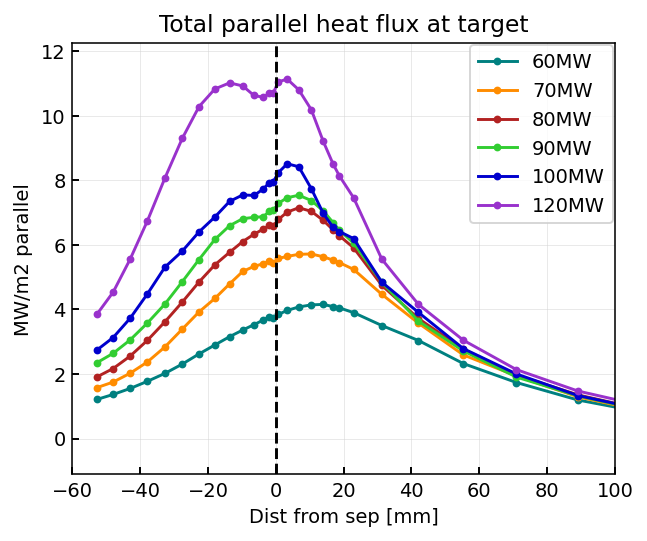

In [37]:
fig, ax = plt.subplots()

for case in ['60MW', '70MW', '80MW', '90MW', '100MW', '120MW']:
    slc = store_slc[case]

    df = slc.get_1d_radial_data(params = ["Te", "fhx_total", "apar"], region = "outer_upper_target")
    df["hf_par_tot"] = df["fhx_total"] / df["apar"] * 1e-6
    df = df.iloc[1:-1]  # Guards
    ax.plot(df["dist"]*1000, abs(df["hf_par_tot"]), marker = "o", ms = 3, label = case)
    
    dfsol = df[df["dist"]>0].reset_index(drop = True)
    ring = dfsol["hf_par_tot"].idxmin()+1
    print(f"{case}: ring {ring:.2f}")
    
ylim = ax.get_ylim()
ax.vlines(0, *ylim, ls = "--", colors = "k")
ax.set_ylim(ylim)
ax.legend()
ax.set_xlabel("Dist from sep [mm]")
ax.set_xlim(-60, 100)
ax.set_title("Total parallel heat flux at target")
ax.set_ylabel("MW/m2 parallel")


## Front width

In [322]:
store_slc.keys()

dict_keys(['50MW', '55MW', '60MW', '70MW', '80MW', '90MW', '100MW', '120MW', 'SPR45', '100MW_inner_arpuff', '100MW_innerar_midplanepuff', '100MW_inar_mp_Ar_2.0e21_D_1.0e24', '100MW_inar_mp_Ar_2.5e21_D_1.0e24', '100MW_inar_mp_Ar_5.0e21_D_1.0e24', '100MW_inar_mp_Ar_6.0e21_D_0.8e24', '100MW_inar_mp_Ar_7.0e21_D_0.8e24', '100MW_inar_mp_Ar_7.0e21_D_0.6e24'])

C:\Users\mikek\AppData\Local\Temp\ipykernel_43324\2577712935.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap("rainbow", num_rings)(x) for x in range(num_rings)]


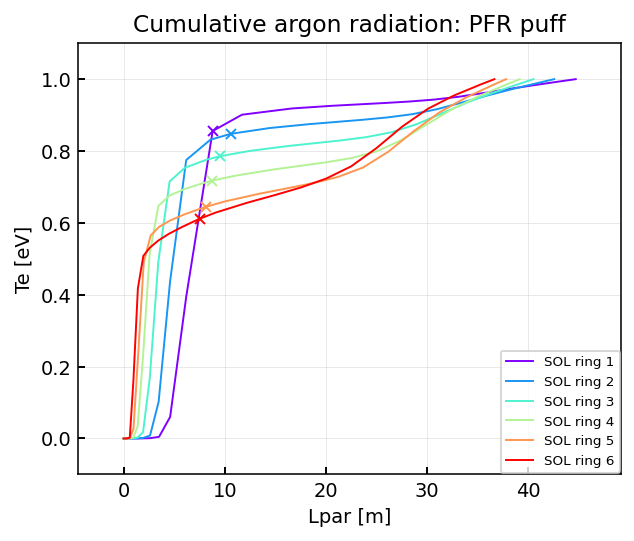

In [364]:
fig, ax = plt.subplots()

num_rings = 6

colors = [plt.cm.get_cmap("rainbow", num_rings)(x) for x in range(num_rings)]
case = '100MW_inner_arpuff'
# case = '100MW_innerar_midplanepuff'
for i in range(num_rings):
    df = store_slc[case].get_1d_poloidal_data(["RAr", "Te", "Btot", "R"], sepadd = i+1, region = "inner_upper", target_first = True)   
    cumR = sp.integrate.cumulative_trapezoid(y = df["RAr"] / df["Btot"], x = df["Spar"], initial = 0)
    # cumR = cumR[::-1]
    df["cumR"] = cumR/cumR[-1]
    dfx = df[df["Xpoint"]==1]

    ax.plot(df["Spar"], df["cumR"], color = colors[i], lw = 1, marker = "o", ms = 0, label = f"SOL ring {i+1}") 
    ax.plot(dfx["Spar"], dfx["cumR"], color = colors[i], marker = "x", ms = 5) 

ylims = ax.get_ylim()
# ax.vlines(df[df["Xpoint"]==1]["Spar"], ylims[0], ylims[1], ls = "-", colors = "darkslategrey", lw = 4, alpha = 0.3, label = "X-point")
ax.set_ylim(ylims)


ax.set_xlabel("Lpar [m]")

ax.set_ylabel("$\int{Q_{Ar}}\ ds_{\parallel}$ (normalised)")

if case in labels.keys():
    name = labels[case]
else:
    name = case
    
ax.set_title(f"Cumulative argon radiation: {name}")
ax.set_ylabel("Te [eV]")
ax.legend(fontsize = "x-small")
# ax.set_yscale("log")


## Front width v2

In [108]:
store_slc.keys()

dict_keys(['50MW', '55MW', '60MW', '70MW', '80MW', '90MW', '100MW', '120MW', 'SPR45', '100MW_inner_arpuff', '100MW_innerar_midplanepuff', '100MW_inar_mp_Ar_2.0e21_D_1.0e24', '100MW_inar_mp_Ar_2.5e21_D_1.0e24', '100MW_inar_mp_Ar_5.0e21_D_1.0e24', '100MW_inar_mp_Ar_6.0e21_D_0.8e24', '100MW_inar_mp_Ar_7.0e21_D_0.8e24', '100MW_inar_mp_Ar_7.0e21_D_0.6e24'])

Text(0.5, 1.0, 'Cumulative Ar radiation location (Outer)')

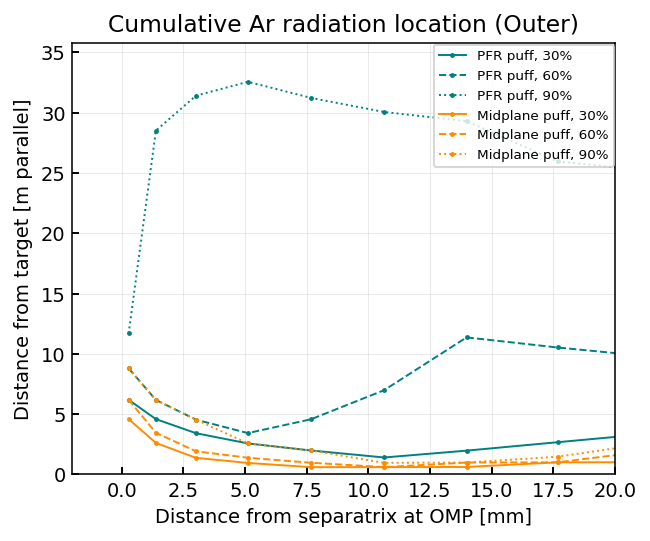

In [316]:
fig, ax = plt.subplots()

num_rings = 15

# case_list = ['60MW', '70MW', '80MW', '90MW', '100MW', '120MW']
# case_list = ['100MW_inar_mp_Ar_2.0e21_D_1.0e24', '100MW_inar_mp_Ar_2.5e21_D_1.0e24', '100MW_inar_mp_Ar_5.0e21_D_1.0e24', '100MW_inar_mp_Ar_6.0e21_D_0.8e24', '100MW_inar_mp_Ar_7.0e21_D_0.8e24', '100MW_inar_mp_Ar_7.0e21_D_0.6e24']
case_list = ['100MW_inner_arpuff', '100MW_innerar_midplanepuff']

labels = {'100MW_inner_arpuff' : "PFR puff", '100MW_innerar_midplanepuff' : "Midplane puff"}

quartilechoice = 0.5
colors = [color['color'] for color in plt.rcParams['axes.prop_cycle']]

for caseid, case in enumerate(case_list):
    if "SPR45" not in case:
        slc = store_slc[case]

        dfradial = slc.get_1d_radial_data([], region = "omp")
        dfradial = dfradial[dfradial["dist"]>0].iloc[:num_rings]  # Select only SOL

        dists = {}
        quartiles = [0.3, 0.6, 0.7, 0.8, 0.9, 0.95]
        for quartile in quartiles:
            dists[quartile] = []
            
        for i in range(num_rings):
            df = slc.get_1d_poloidal_data(["RAr", "Te", "Btot", "R"], sepadd = i+1, region = "inner_upper", target_first = True)   
            cumR = sp.integrate.cumulative_trapezoid(y = df["RAr"] / df["Btot"], x = df["Spar"], initial = 0)
            # cumR = cumR[::-1]
            df["cumR"] = cumR/cumR[-1]
            dfx = df[df["Xpoint"]==1]
            
            
            for quartile in quartiles:
                dists[quartile].append(df[df["cumR"]>quartile]["Spar"].iloc[0])


        # label = case
        label = labels[case]
        ax.plot(dfradial["dist"]*1000, dists[0.3], marker = "o", c = colors[caseid], lw = 1, ms = 1.5, label = f"{label}, 30%", ls = "-")
        ax.plot(dfradial["dist"]*1000, dists[0.6], marker = "o", c = colors[caseid], lw = 1, ms = 1.5, label = f"{label}, 60%", ls = "--")
        ax.plot(dfradial["dist"]*1000, dists[0.9], marker = "o", c = colors[caseid], lw = 1, ms = 1.5, label = f"{label}, 90%", ls = ":")
        
        # ax.plot(dfradial["dist"]*1000, dists[0.3], marker = "o", c = colors[caseid], lw = 0, ms = 3, label = f"{label}, 30%")
        # ax.plot(dfradial["dist"]*1000, dists[0.6], marker = "+", c = colors[caseid], lw = 0, ms = 6, label = f"{label}, 60%")
        # ax.plot(dfradial["dist"]*1000, dists[0.9], marker = "x", c = colors[caseid], lw = 0, ms = 6, label = f"{label}, 90%")
        
# ax.legend(loc = "upper left", bbox_to_anchor = (1,1))
ax.legend(loc = "upper right", fontsize = "x-small")
ax.set_xlabel("Distance from separatrix at OMP [mm]")
ax.set_ylabel("Distance from target [m parallel]")
ax.set_xlim(-2, 20)
ax.set_ylim(0, None)
ax.set_title(f"Cumulative Ar radiation location (Outer)")


### Why are inner front sizes all the same?
- Poor resolution.

(0.0, 10.0)

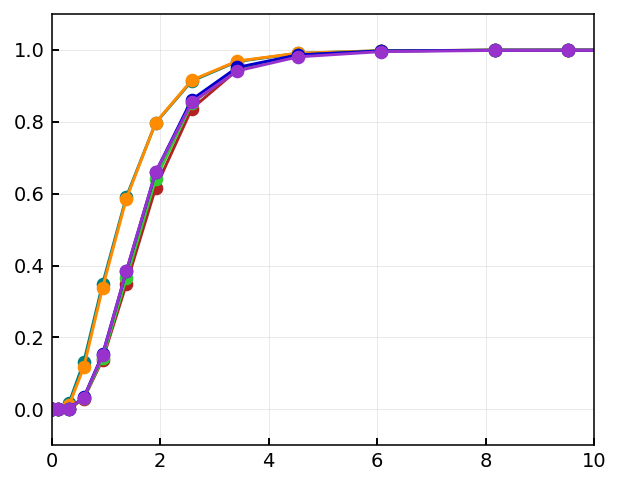

In [121]:
fig, ax = plt.subplots()

for case in case_list:
    slc = store_slc[case]
    
    df = slc.get_1d_poloidal_data(["RAr", "Te", "Btot", "R"], sepadd = 3, region = "inner_upper", target_first = True)   
    cumR = sp.integrate.cumulative_trapezoid(y = df["RAr"] / df["Btot"], x = df["Spar"], initial = 0)
    # cumR = cumR[::-1]
    df["cumR"] = cumR/cumR[-1]
    dfx = df[df["Xpoint"]==1]
    
    ax.plot(df["Spar"], df["cumR"], marker = "o", label = case)
        
ax.set_xlim(0,10)
    

### Why do the DDN cases appear like they have different raidal distances?

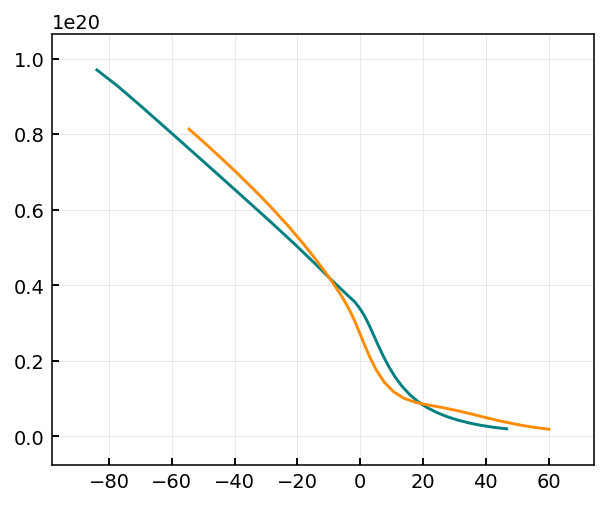

In [133]:
fig, ax =plt.subplots()

for case in ["100MW", '100MW_innerar_midplanepuff']:
    slc = store_slc[case]
    dfradial = slc.get_1d_radial_data(["Ne"], region = "omp")
    
    ax.plot(dfradial["dist"]*1000, dfradial["Ne"], label = case)

## Leg ionisation and cross-field transport by SOL ring

In [179]:
%matplotlib inline

In [164]:
store_slc.keys()

dict_keys(['50MW', '55MW', '60MW', '70MW', '80MW', '90MW', '100MW', '120MW', 'SPR45', '100MW_inner_arpuff', '100MW_innerar_midplanepuff', '100MW_inar_mp_Ar_2.0e21_D_1.0e24', '100MW_inar_mp_Ar_2.5e21_D_1.0e24', '100MW_inar_mp_Ar_5.0e21_D_1.0e24', '100MW_inar_mp_Ar_6.0e21_D_0.8e24', '100MW_inar_mp_Ar_7.0e21_D_0.8e24', '100MW_inar_mp_Ar_7.0e21_D_0.6e24'])

Text(0.5, 1.0, 'Total ionisation integral in leg')

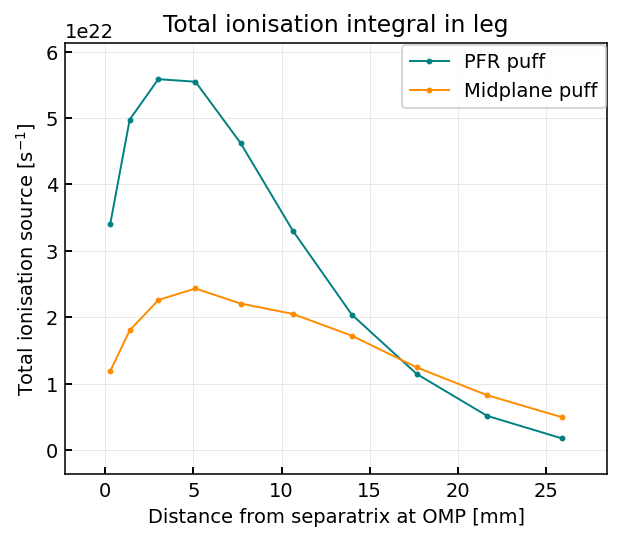

In [317]:
case_list = ['100MW_inner_arpuff', '100MW_innerar_midplanepuff']
labels = {'100MW_inner_arpuff' : "PFR puff", '100MW_innerar_midplanepuff' : "Midplane puff"}

fig, ax = plt.subplots()

for case in case_list:
    slc = store_slc[case]
    papl = slc.bal["eirene_mc_papl_sna_bal"][:,:,1,:].sum(axis = 2) # Select EIRENE neutral and sum over all strata

    num_rings = 10
    papl.shape

    df = pd.DataFrame()

    dfradial = slc.get_1d_radial_data([], region = "omp")
    dfradial = dfradial[dfradial["dist"]>0].iloc[:num_rings]  # Select only SOL

    for ring in range(num_rings):
        selector = slc.make_custom_sol_ring(i = ring, name = "inner_upper_leg")
        
        df.loc[ring, "iz"] = papl[selector].sum()
        df.loc[ring, "dist"] = dfradial["dist"].iloc[ring]
        # print(papl[selector].sum())
        
    ax.plot(df["dist"]*1000, df["iz"], marker = "o", ms = 2, lw = 1, label = labels[case])
    
ax.legend()
ax.set_xlabel("Distance from separatrix at OMP [mm]")
ax.set_ylabel("Total ionisation source [$s^{-1}$]")
ax.set_title("Total ionisation integral in leg")

## Leg average density

Text(0.5, 1.0, 'Average electron density in leg')

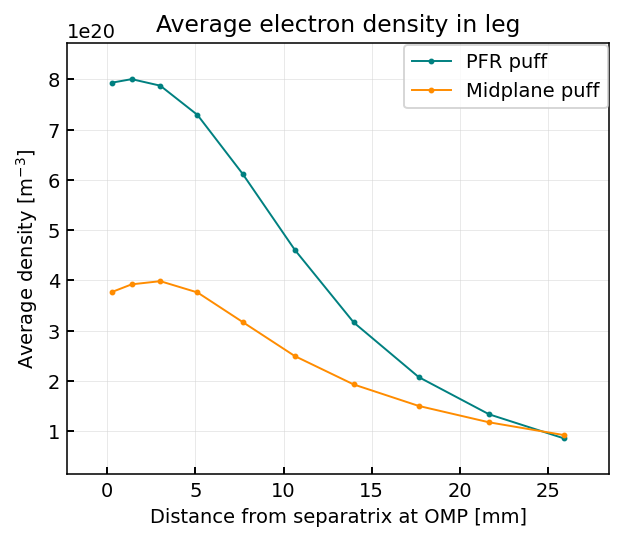

In [318]:
case_list = ['100MW_inner_arpuff', '100MW_innerar_midplanepuff']

fig, ax = plt.subplots()

for case in case_list:
    slc = store_slc[case]
    papl = slc.bal["eirene_mc_papl_sna_bal"][:,:,1,:].sum(axis = 2) # Select EIRENE neutral and sum over all strata

    num_rings = 10
    papl.shape

    df = pd.DataFrame()

    dfradial = slc.get_1d_radial_data([], region = "omp")
    dfradial = dfradial[dfradial["dist"]>0].iloc[:num_rings]  # Select only SOL

    for ring in range(num_rings):
        selector = slc.make_custom_sol_ring(i = ring, name = "inner_upper_leg")
        
        df.loc[ring, "Ne"] = slc.bal["Ne"][selector].mean()
        df.loc[ring, "dist"] = dfradial["dist"].iloc[ring]
        # print(papl[selector].sum())
        
    ax.plot(df["dist"]*1000, df["Ne"], marker = "o", ms = 2, lw = 1, label = labels[case])
    
ax.legend()
ax.set_xlabel("Distance from separatrix at OMP [mm]")
ax.set_ylabel("Average density [$m^{-3}$]")
ax.set_title("Average electron density in leg")

## Leg average temperature

Text(0.5, 1.0, 'Average electron temperature in leg')

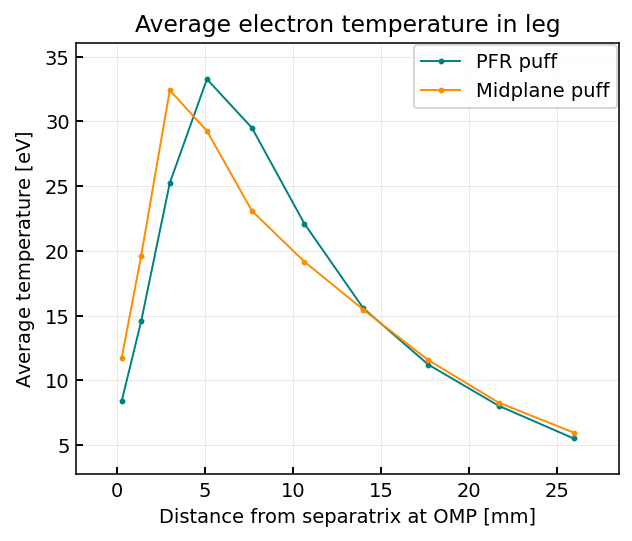

In [290]:
case_list = ['100MW_inner_arpuff', '100MW_innerar_midplanepuff']

fig, ax = plt.subplots()

for case in case_list:
    slc = store_slc[case]
    papl = slc.bal["eirene_mc_papl_sna_bal"][:,:,1,:].sum(axis = 2) # Select EIRENE neutral and sum over all strata

    num_rings = 10
    papl.shape

    df = pd.DataFrame()

    dfradial = slc.get_1d_radial_data([], region = "omp")
    dfradial = dfradial[dfradial["dist"]>0].iloc[:num_rings]  # Select only SOL

    for ring in range(num_rings):
        selector = slc.make_custom_sol_ring(i = ring, name = "outer_upper_leg")
        
        df.loc[ring, "Te"] = slc.bal["Te"][selector].mean()
        df.loc[ring, "dist"] = dfradial["dist"].iloc[ring]
        # print(papl[selector].sum())
        
    ax.plot(df["dist"]*1000, df["Te"], marker = "o", ms = 2, lw = 1, label = labels[case])
    
ax.legend()
ax.set_xlabel("Distance from separatrix at OMP [mm]")
ax.set_ylabel("Average temperature [$eV$]")
ax.set_title("Average electron temperature in leg")

## Temperature gradient by SOL ring

Text(0.5, 1.0, '$T_u - T_t$')

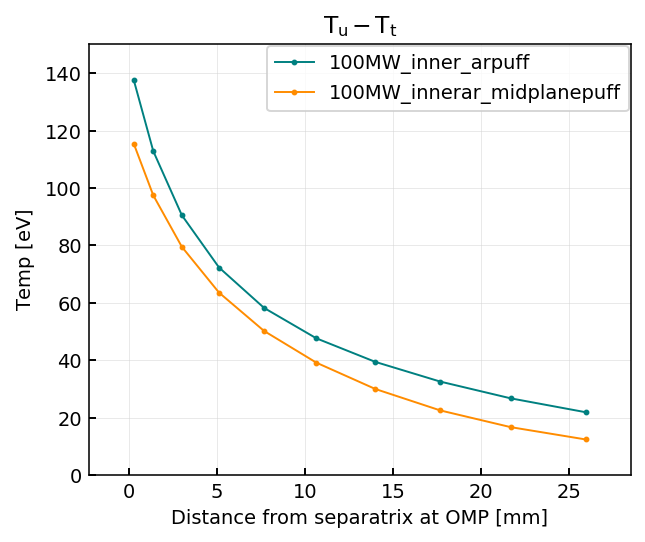

In [245]:
case_list = ['100MW_inner_arpuff', '100MW_innerar_midplanepuff']

fig, ax = plt.subplots()

for case in case_list:
    slc = store_slc[case]
    num_rings = 10

    dfradial = slc.get_1d_radial_data([], region = "omp")
    dfradial = dfradial[dfradial["dist"]>0].iloc[:num_rings]  # Select only SOL
    gradT = []

    for ring in range(num_rings):
        df = slc.get_1d_poloidal_data(["RAr", "Te", "Td+"], sepadd = ring+1, region = "outer_upper", target_first = True)  
        
        Tdiff = df["Te"].iloc[-1] - df["Te"].iloc[0]
        gradT.append(Tdiff)
        
    ax.plot(dfradial["dist"]*1000, gradT, marker = "o", ms = 2, lw = 1, label = case)
    
ax.legend()
ax.set_xlabel("Distance from separatrix at OMP [mm]")
ax.set_ylabel("Temp [$eV$]")
ax.set_title("$T_u - T_t$")

In [237]:
df["Te"].iloc[-1]

4.221497032184664

## Heat flux decomposition

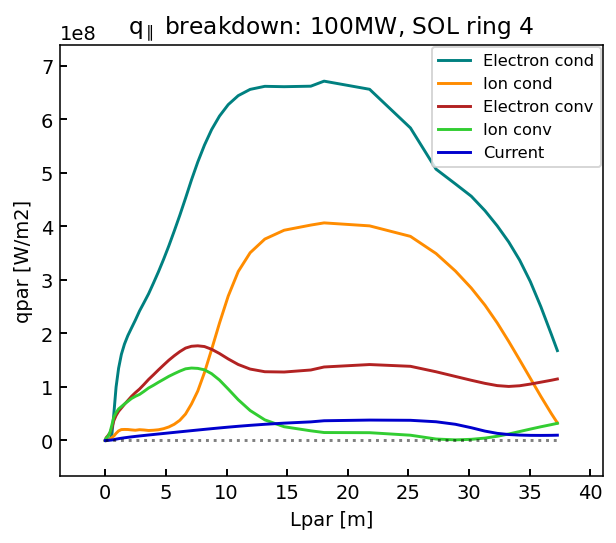

In [82]:
case = "100MW"
sepadd = 3
slc = store_slc[case]

df = slc.get_1d_poloidal_data(["Te", "RAr", "ne", "fhex_cond", "fhex_32", "fhix_cond", "fhix_32", "fhex_thermj", "fhx_total"], sepadd = sepadd, region = "outer_upper", target_first = True)
for param in ["fhex_32", "fhix_32"]:
    df[param] = df[param] * 5/3

for param in df.columns:
    if param.startswith("fh"):
        df[param] = df[param] / df["apar"]
        df[param] *= -1

fig, ax = plt.subplots()
ax.set_title(fr"$q_{{\parallel}}$ breakdown: {case}, SOL ring {sepadd+1}")
labels = dict(fhex_cond = "Electron cond", fhix_cond = "Ion cond", fhex_32 = "Electron conv", fhix_32 = "Ion conv", fhex_thermj = "Current")

for param in labels:
    ax.plot(df["Spar"], df[param], label = labels[param])
    
# df["fhx_total_check"] = df["fhex_cond"] + df["fhex_32"] + df["fhex_thermj"] + df["fhix_cond"] + df["fhix_32"]
# ax.plot(df["Spar"], df["fhx_total"], label = "Total", ls = "--", color = "k")
# ax.plot(df["Spar"], df["fhx_total_check"], label = "Total", ls = "--", color = "r")

ax.set_xlabel("Lpar [m]")
ax.set_ylabel("qpar [W/m2]")
ylims = ax.get_ylim()
ax.set_ylim(ylims)
ax.legend(fontsize = "small")
ax.grid()
ylim = ax.get_ylim()
ax.hlines(0, 0, df["Spar"].max(), ls = ":", color = "k", alpha = 0.5)

## Ar vs. hydrogenic radiation

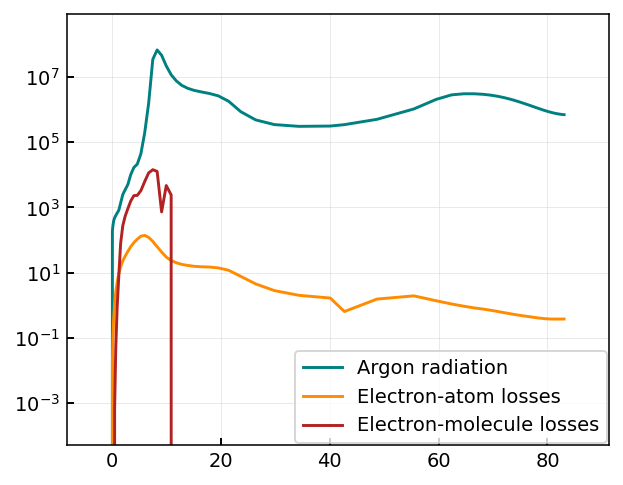

In [73]:
slc.bal["b2stel_she_bal"].shape

slc.bal["Rd+_ex"] = slc.bal["b2stel_she_bal"][:,:,1]
slc.bal["Rd+_mol"] = slc.bal["eirene_mc_emel_she_bal"].sum(axis = 2)  # Sum over all strata

df = slc.get_1d_poloidal_data(["Te", "RAr", "Rd+_ex", "Rd+_mol"], sepadd = sepadd, region = "outer_upper", target_first = True)

fig, ax = plt.subplots()
ax.plot(df["Spar"], df["RAr"], label = "Argon radiation")
ax.plot(df["Spar"], abs(df["Rd+_ex"]), label = "Electron-atom losses")
ax.plot(df["Spar"], abs(df["Rd+_mol"]), label = "Electron-molecule losses")

ax.legend()
ax.set_yscale("log")

In [14]:
slc.species

,name
0,D0
1,D+1
2,Ar0
3,Ar+1
4,Ar+2
5,Ar+3
6,Ar+4
7,Ar+5
8,Ar+6
9,Ar+7


## Ion/electron temperature 

In [ ]:
list(colors)

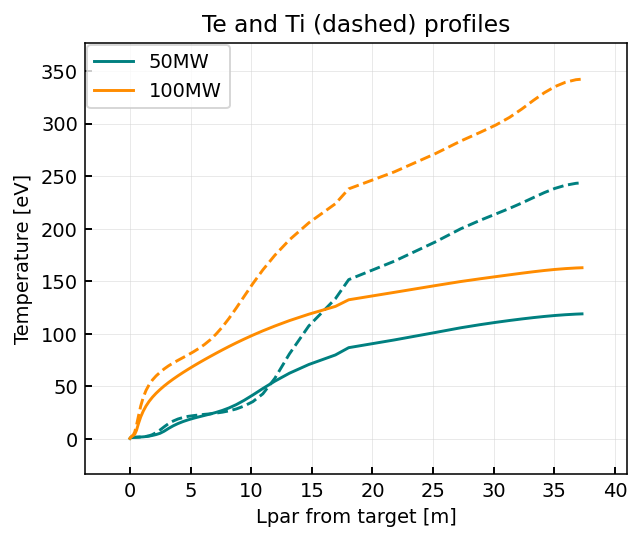

In [8]:
sepadd = 3
fig, ax = plt.subplots()
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

for i, case in enumerate(["50MW", "100MW"]):
    slc = store_slc[case]
    df = slc.get_1d_poloidal_data(["Te", "RAr", "Td+"], sepadd = sepadd, region = "outer_upper", target_first = True)
    
    ax.plot(df["Spar"], df["Te"], label = case, color = colors[i])
    ax.plot(df["Spar"], df["Td+"], color = colors[i], ls = "--")
    
ax.set_xlabel("Lpar from target [m]")
ax.set_ylabel("Temperature [eV]")
ax.set_title("Te and Ti (dashed) profiles")
ax.legend()

## Impurity enrichment (single SOL ring)

C:\Users\mikek\AppData\Local\Temp\ipykernel_31664\3111092030.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap("rainbow", num_cases)(x) for x in range(num_cases)]


Text(0.5, 1.0, 'Argon enrichment for different powers')

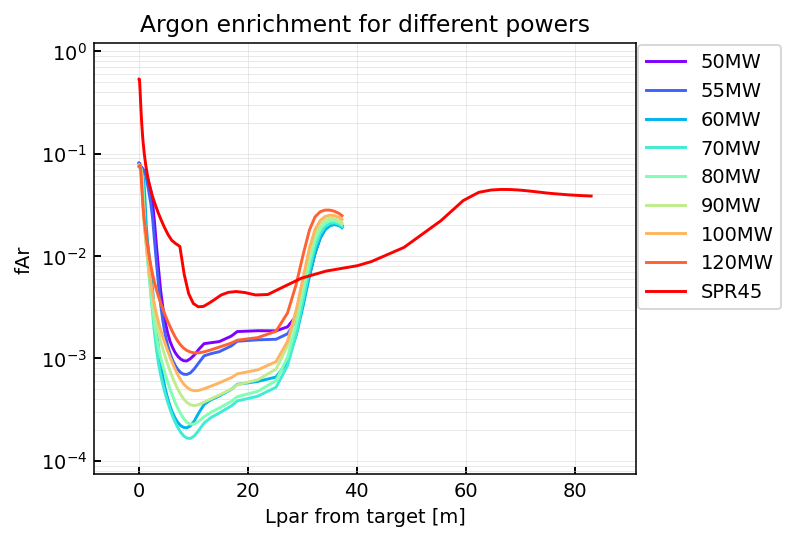

In [71]:
fig, ax = plt.subplots()
num_cases = len(store_slc.keys())
colors = [plt.cm.get_cmap("rainbow", num_cases)(x) for x in range(num_cases)]

for i, case in enumerate(store_slc):
    slc = store_slc[case]
    df = store_slc[case].get_1d_poloidal_data(["fAr"], 
                                                      region = "outer_upper", sepadd = 3, target_first = True)
    
    ax.plot(df["Spar"], df["fAr"], label = case, color = colors[i])
    
ax.legend(loc = "upper left", bbox_to_anchor = (1,1))
ax.set_xlabel("Lpar from target [m]")
ax.set_ylabel("fAr")
ax.set_yscale("log")
ax.set_title("Argon enrichment for different powers")

## Impurity enrichment (multiple SOL rings)

C:\Users\mikek\AppData\Local\Temp\ipykernel_43324\2943185463.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap("rainbow", num_rings)(x) for x in range(num_rings)]


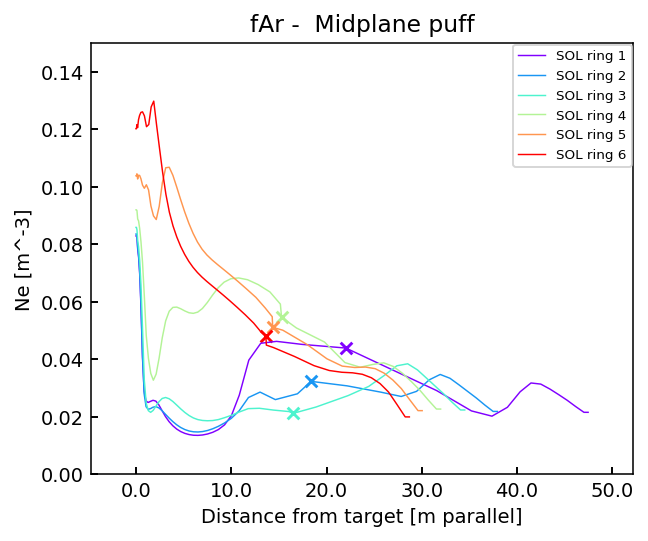

In [368]:

region = "outer_upper"
# case = "100MW_inner_arpuff"
case = '100MW_innerar_midplanepuff'

fig, ax = plt.subplots()
# for case in store_slc:
num_rings = 6
colors = [plt.cm.get_cmap("rainbow", num_rings)(x) for x in range(num_rings)]

for i in range(num_rings):
    slc = store_slc[case]
    solps = slc.get_1d_poloidal_data(["Pe", "Pd+", "Ne", "fAr"], sepadd = i, region = region, target_first = True)
    
    ax.plot(solps["Spar"], solps["fAr"], label = f"SOL ring {i+1}", marker = "o", ms = 0, lw = 0.75, color = colors[i])
    dfx = solps[solps["Xpoint"]==1]
    ax.scatter(dfx["Spar"], dfx["fAr"], marker = "x", color = colors[i])
    
ax.set_xlabel("Distance from target [m parallel]")
ax.set_ylabel("Ne [m^-3]")
ax.set_yscale("linear")
# ax.set_xscale("log")

ax.set_title(f"fAr -  {labels[case] if case in labels else case}")
ax.legend(fontsize = "x-small")
ax.grid(which = "both", visible = False)
ax.set_ylim(0, 0.15)
ax.xaxis.set_major_formatter(mpl.ticker.FormatStrFormatter('%.1f'))

# 2D Plots

## Separatrix location

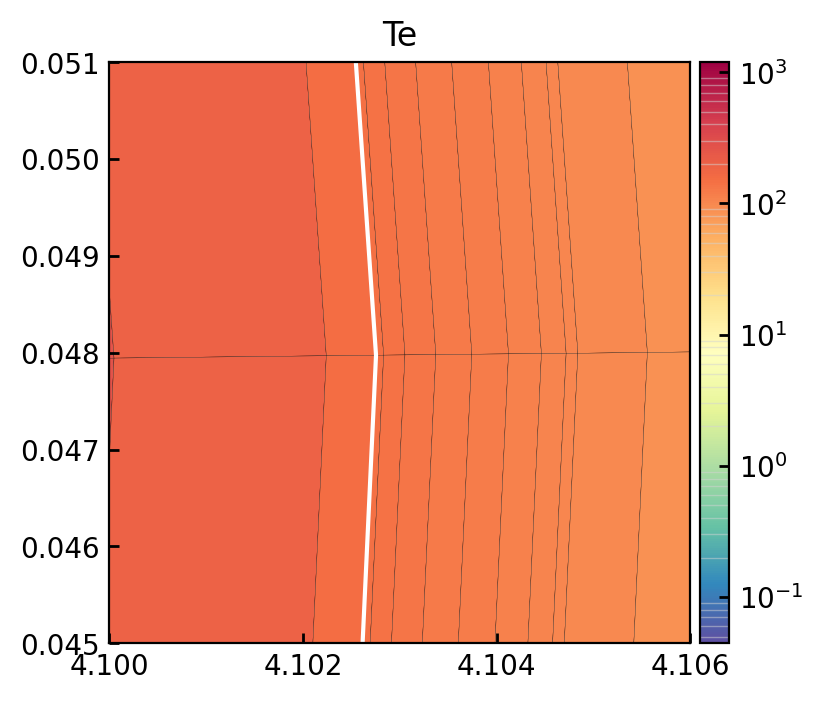

In [82]:
slc = store_slc["60MW"]

fig, ax = plt.subplots(dpi = 200, figsize = (4,6), sharey = True)
slc.plot_2d(param = "Te",  ax = ax, 
            linewidth = 0.1, antialias = True, grid_only = False, vmax = None, vmin = None, logscale = True, separatrix = True,
            custom_cmap = "Spectral_r", cbar = True, axis_labels = False, alpha = 1,
            )
ax.set_ylim(0.045, 0.051)
ax.set_xlim(4.10, 4.106)
ax.grid(False)

In [ ]:
## 

In [97]:
target = 0.0015/2  # Half a lambda q
print("Finding sepadds for a lambda q for each case")

for case in store_slc:

    df = store_slc[case].get_1d_radial_data(params = ["NVd+"], region = "omp")
    dfsol = df[df["dist"]>0].reset_index(drop = True)
    sepadd = np.argmin(abs(dfsol["dist"]-target))
    print(f"{case}: {sepadd}")
    


Finding sepadds for a lambda q for each case
50MW: 2
55MW: 2
60MW: 2
70MW: 2
80MW: 2
90MW: 2
120MW: 2


## Radiation location

### Logical grid

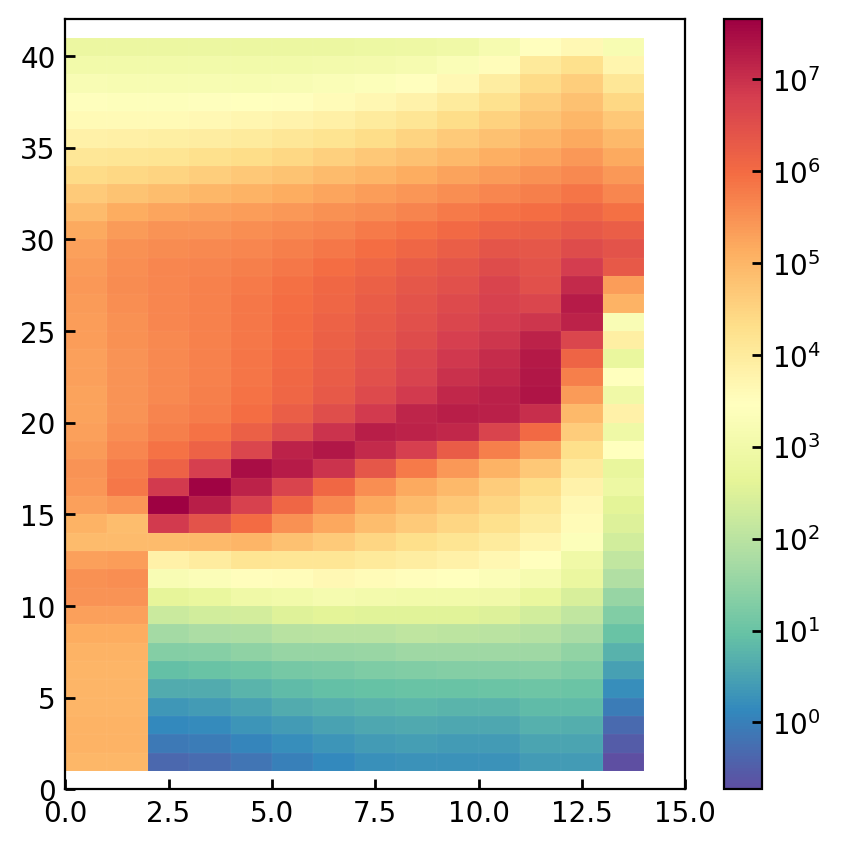

In [73]:
slc = store_slc["50MW"]
# slc = store_slc["60MW"]

fig, ax = plt.subplots(dpi = 200, figsize = (5,5), sharey = True)

RAr = slc.bal["RAr"].copy().transpose()
RAr = RAr[:, 35:50]

pcolor = ax.pcolormesh(RAr, cmap = "Spectral_r", linewidth = 0.01, color = "white", antialiased = True, norm = mpl.colors.LogNorm())
fig.colorbar(pcolor, ax = ax)
ax.grid(which = "both", visible = False)

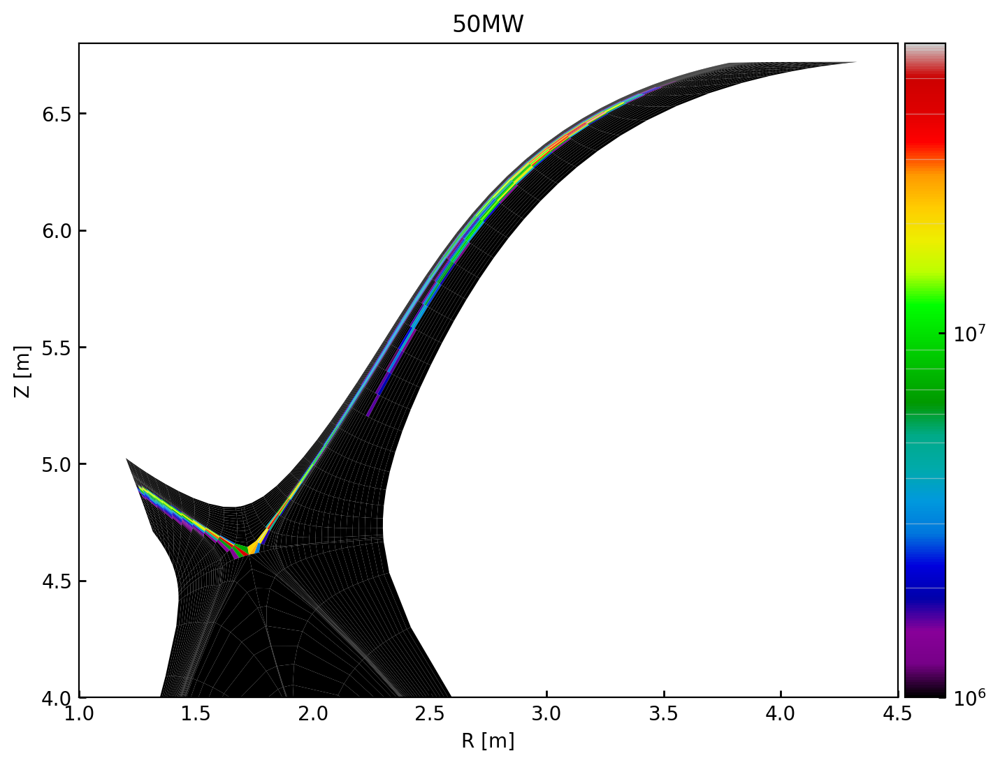

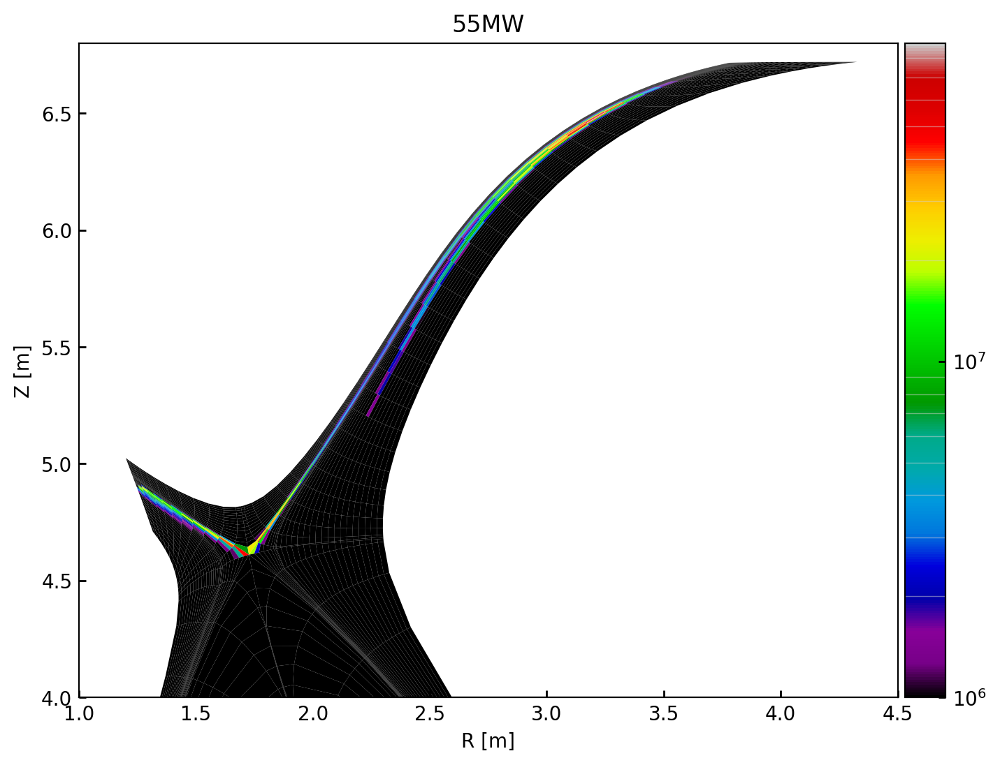

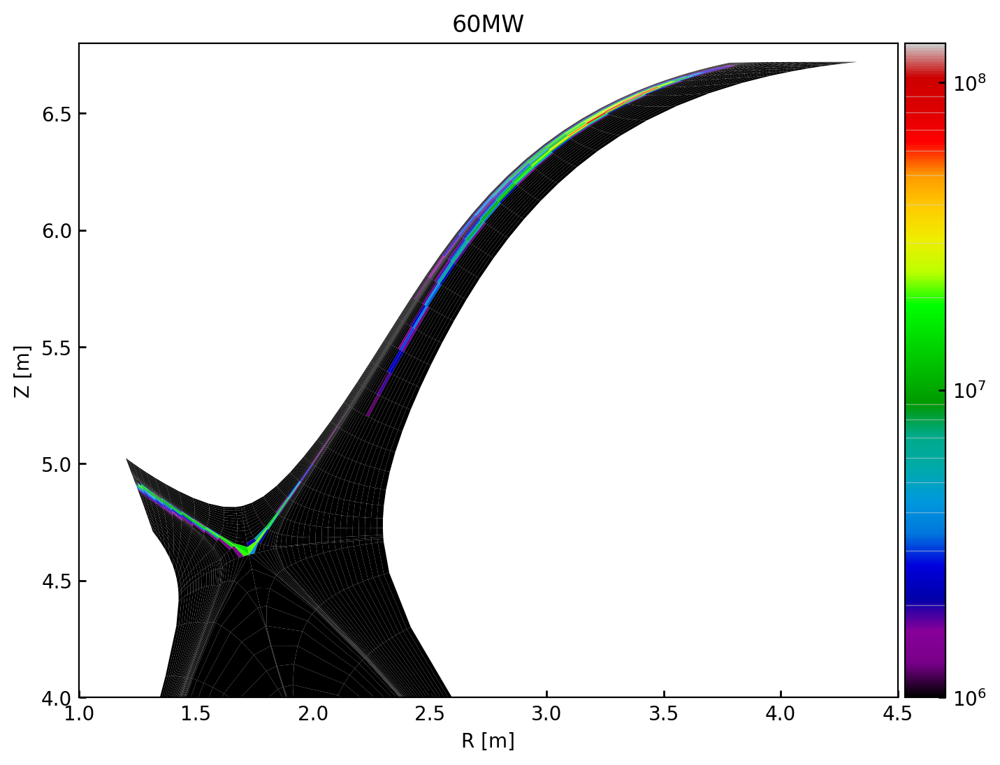

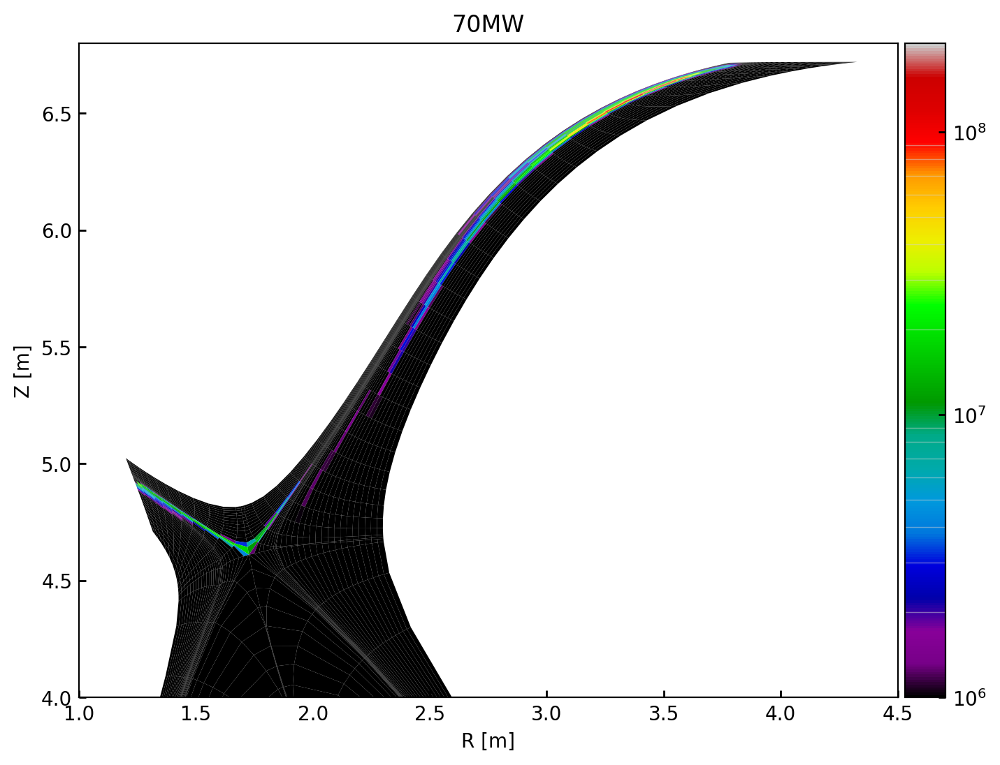

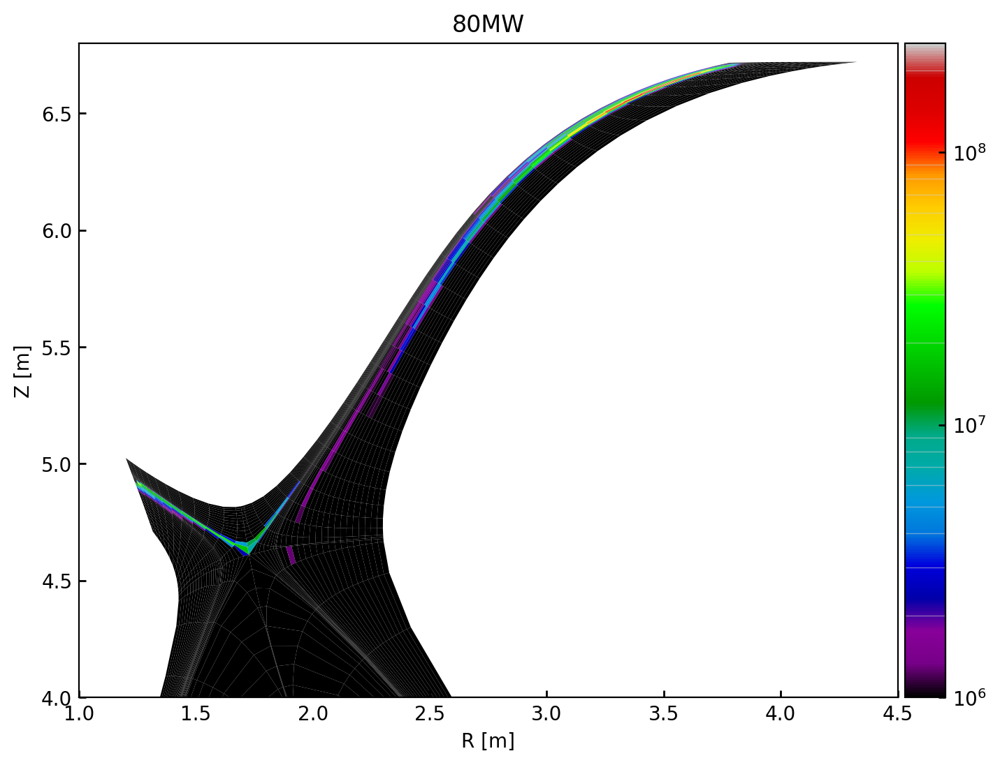

...

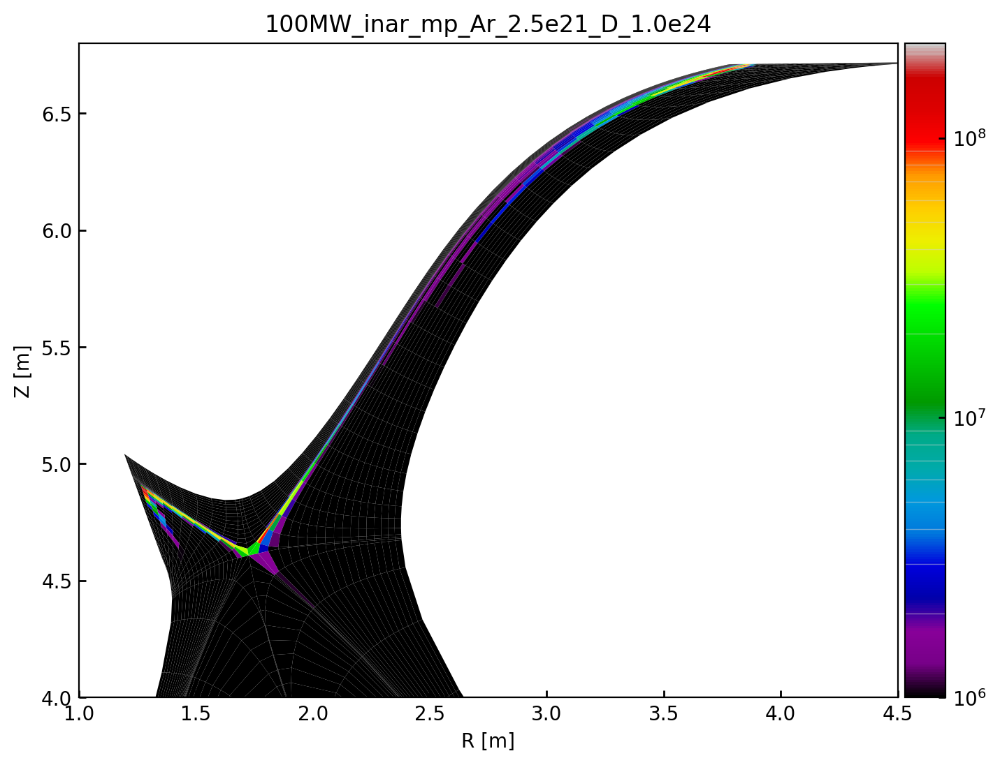

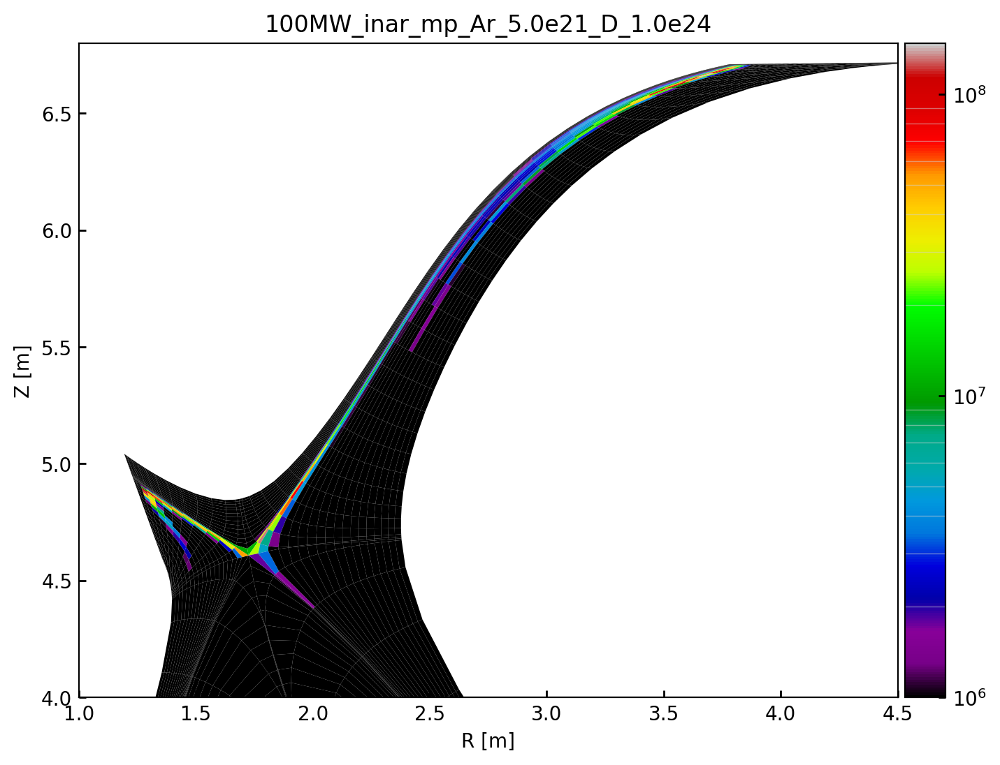

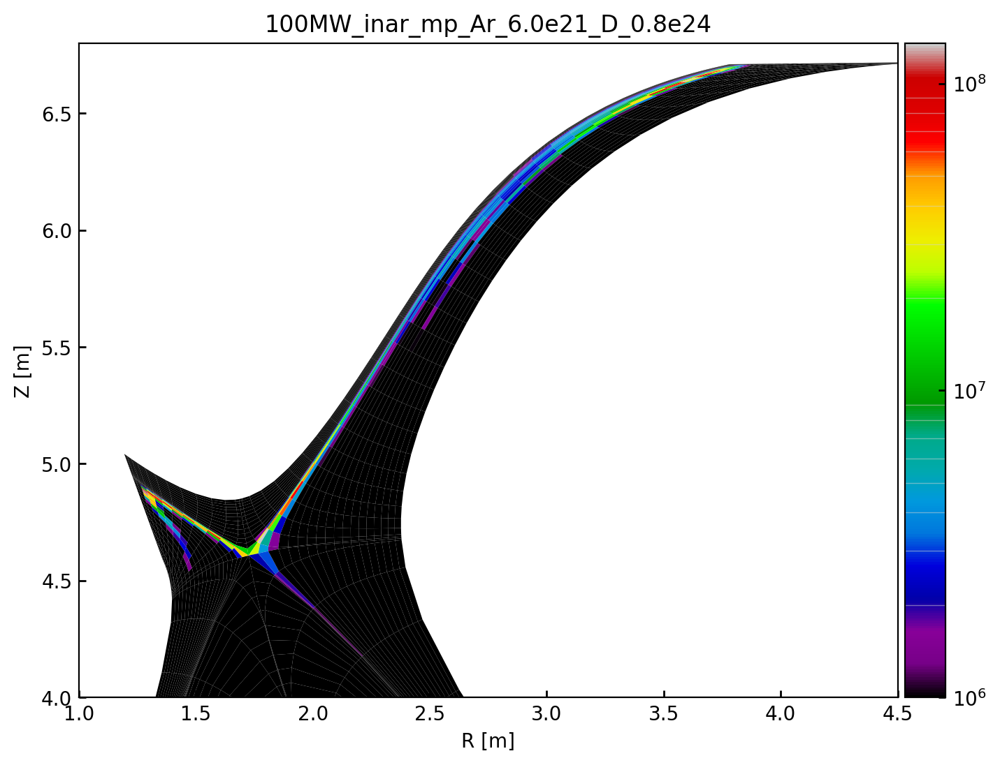

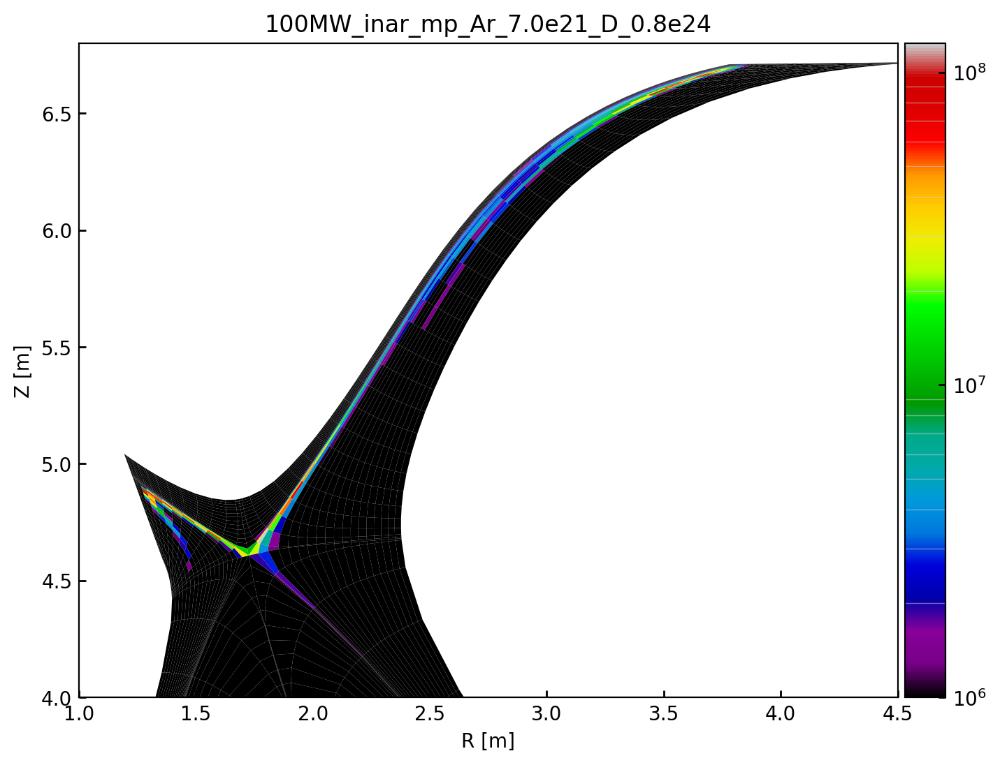

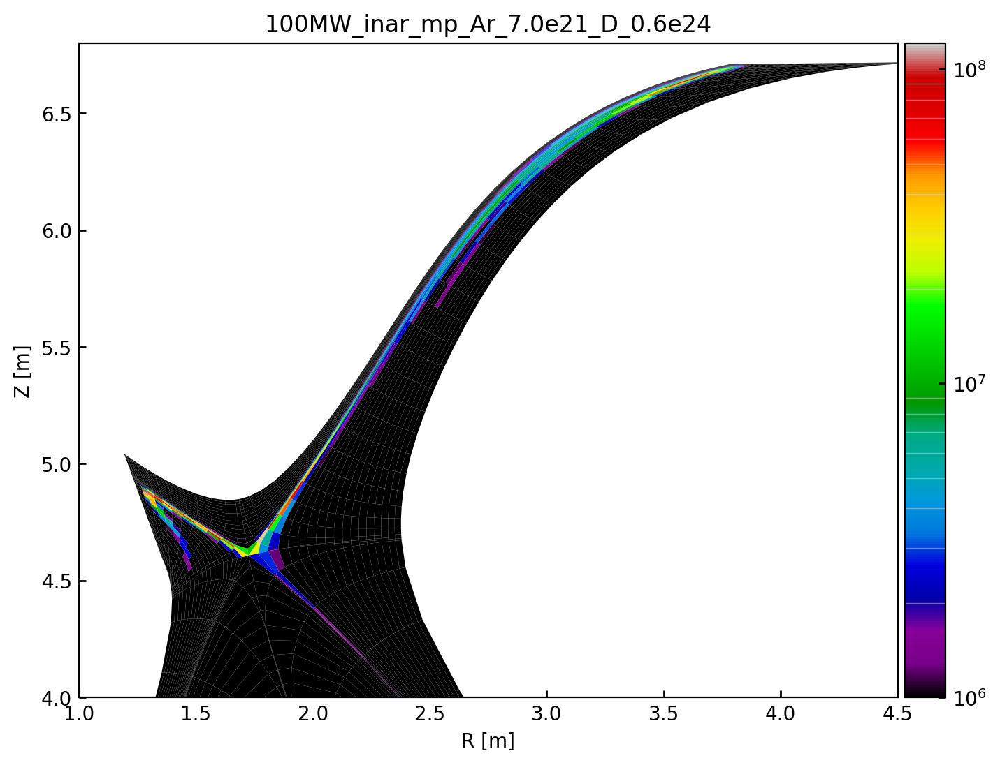

In [38]:

for case in store_slc:
    slc = store_slc[case]
    # slc = store_slc["60MW"]

    fig, ax = plt.subplots(dpi = 200, figsize = (8,12), sharey = True)
    slc.plot_2d(param = "RAr",  ax = ax, 
                linewidth = 0, antialias = True, grid_only = False, vmax = None, vmin = 1e6, logscale = True, separatrix = False,
                custom_cmap = "nipy_spectral", cbar = True, axis_labels = False, alpha = 1)

    ax.grid(False)

    # SPR45
    # ax.set_xlim(1.5, 6.0)
    # ax.set_ylim(-9, -4)

    # SPR45 inner
    # ax.set_xlim(1.65, 2.5)
    # ax.set_ylim(-6.8, -5.5)

    # V10
    ax.set_xlim(1.0, 4.5)
    # ax.set_ylim(-7, -3)
    ax.set_ylim(4, 6.8)

    ax.set_xlabel("R [m]")
    ax.set_ylabel("Z [m]")
    ax.set_title(case)

## Argon fraction

In [139]:
store_slc.keys()

dict_keys(['50MW', '55MW', '60MW', '70MW', '80MW', '90MW', '100MW', '120MW', 'SPR45', '100MW_inner_arpuff', '100MW_innerar_midplanepuff'])

Text(0, 0.5, 'Z [m]')

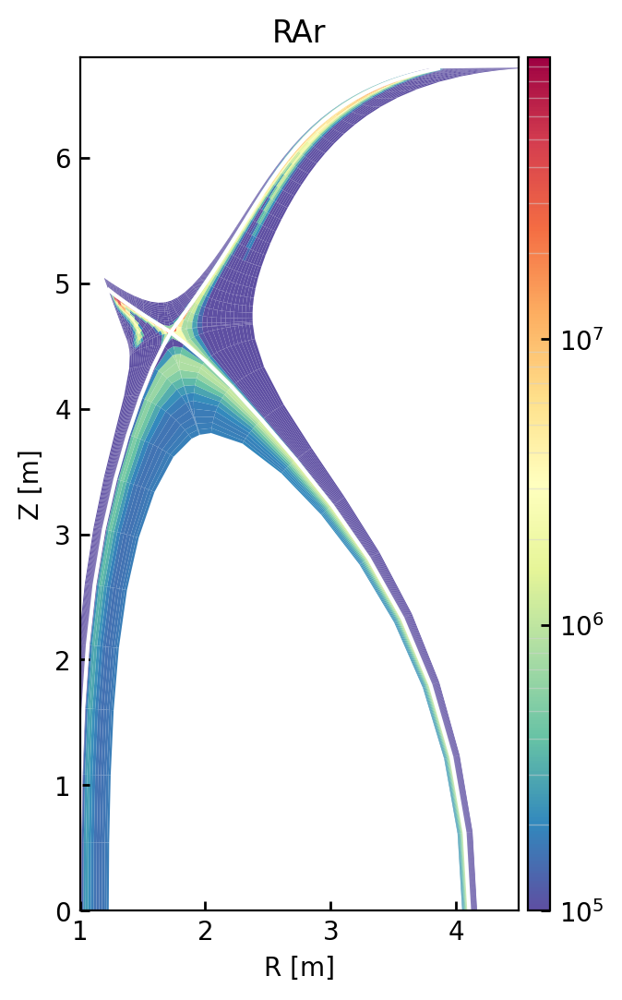

In [136]:
slc = store_slc["100MW_innerar_midplanepuff"]

fig, ax = plt.subplots(dpi = 200, figsize = (4,6), sharey = True)
slc.plot_2d(param = "RAr",  ax = ax, 
            linewidth = 0, antialias = True, grid_only = False, vmax = None, vmin = 1e5, logscale = True, separatrix = True,
            custom_cmap = "Spectral_r", cbar = True, axis_labels = False, alpha = 1)

ax.grid(False)

# SPR45
# ax.set_xlim(1.5, 6.0)
# ax.set_ylim(-9, -4)

# SPR45 inner
# ax.set_xlim(1.65, 2.5)
# ax.set_ylim(-6.8, -5.5)

# V10
ax.set_xlim(1.0, 4.5)
# ax.set_ylim(-7, -3)
ax.set_ylim(0, 6.8)

ax.set_xlabel("R [m]")
ax.set_ylabel("Z [m]")

## Pressure

In [10]:
store_slc.keys()

dict_keys(['50MW', '55MW', '60MW', '70MW', '80MW', '90MW', '100MW', '120MW', 'SPR45', '100MW_inner_arpuff', '100MW_innerar_midplanepuff'])

Text(0, 0.5, 'Z [m]')

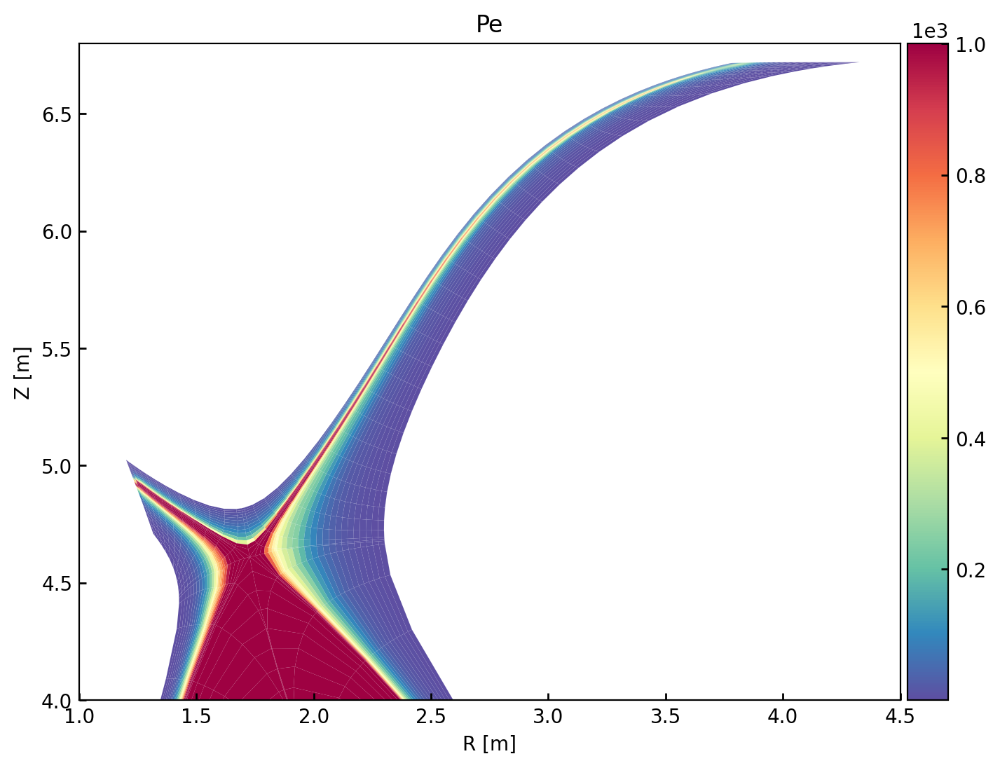

In [17]:
# slc = store_slc["100MW_innerar_midplanepuff"]
# slc = store_slc["100MW_inner_arpuff"]
slc = store_slc["100MW"]

fig, ax = plt.subplots(dpi = 200, figsize = (8,12), sharey = True)
slc.plot_2d(param = "Pe",  ax = ax, 
            linewidth = 0, antialias = True, grid_only = False, vmax = 1000, vmin = 1, logscale = False, separatrix = False,
            custom_cmap = "Spectral_r", cbar = True, axis_labels = False, alpha = 1)

ax.grid(False)

# SPR45
# ax.set_xlim(1.5, 6.0)
# ax.set_ylim(-9, -4)

# SPR45 inner
# ax.set_xlim(1.65, 2.5)
# ax.set_ylim(-6.8, -5.5)

# V10
ax.set_xlim(1.0, 4.5)
# ax.set_ylim(-7, -3)
ax.set_ylim(4, 6.8)

ax.set_xlabel("R [m]")
ax.set_ylabel("Z [m]")

## Compare upper and lower

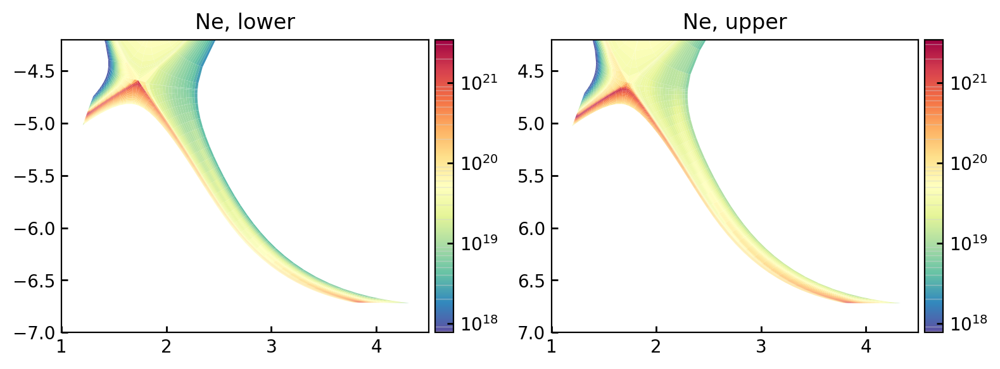

In [69]:
slc = store_slc["120MW"]

fig, axes = plt.subplots(1,2, dpi = 200, figsize = (8,6), sharex = True)

vmin = None
vmax = None
logscale = True
param = "Ne"

for ax in axes:
    slc.plot_2d(param = param,  ax = ax, 
                linewidth = 0, antialias = True, grid_only = False, vmax = vmax, vmin = vmin, logscale = logscale, separatrix = False,
                custom_cmap = "Spectral_r", cbar = True, axis_labels = False, alpha = 1)

    ax.grid(False)

# V10
axes[0].set_xlim(1.0, 4.5)
axes[0].set_ylim(-7, -4.2)
axes[1].set_xlim(1.0, 4.5)
axes[1].set_ylim(7, 4.2)
axes[0].set_title(f"{param}, lower")
axes[1].set_title(f"{param}, upper")
fig.tight_layout()